In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
import time

# Dataset Class
import torch

import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from matplotlib.widgets import Slider
import numpy as np
import gc
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader
import torch.utils.checkpoint as checkpoint
import json
import matplotlib.pyplot as plt
from matplotlib import cm
import gc
import torch.nn.functional as F


In [ ]:
import importlib

# Unique packages from your imports
packages = [
    "torch",        # external
    "pandas",       # external
    "numpy",        # external
    "matplotlib",   # external
    "subprocess",   # built-in
    "time",         # built-in
    "gc",           # built-in
    "json"          # built-in
]

for pkg in packages:
    try:
        module = importlib.import_module(pkg)
        version = getattr(module, "__version__", "built-in / no version attr")
        print(f"{pkg} version: {version}")
    except ImportError:
        print(f"{pkg} not installed")


torch version: 2.6.0+cu124
pandas version: 2.2.2
numpy version: 2.0.2
matplotlib version: 3.10.0
subprocess version: built-in / no version attr
time version: built-in / no version attr
gc version: built-in / no version attr
json version: 2.0.9


In [ ]:
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

In [ ]:
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

In [ ]:


def collate_fn(batch):
    """Collate function for batches that include goal"""
    max_agents = max(sample[0].shape[0] for sample in batch)
    # history
    max_neighbors = max(sample[2].shape[1] for sample in batch)  # neighbors
    hist_len = batch[0][0].shape[1]
    fut_len = batch[0][1].shape[1]

    padded_histories = []
    padded_futures = []
    padded_neighbors = []
    padded_goals = []

    for sample in batch:
        history, future, neighbors, goal = sample
        A, H, D = history.shape
        N = neighbors.shape[1]

        padded_hist = torch.zeros(max_agents, hist_len, D)
        padded_fut = torch.zeros(max_agents, fut_len, D)
        padded_neigh = torch.zeros(max_agents, max_neighbors, D)
        padded_goal = torch.zeros(max_agents, D)

        padded_hist[:A] = history
        padded_fut[:A] = future
        padded_neigh[:A, :N] = neighbors
        padded_goal[:A] = goal

        padded_histories.append(padded_hist)
        padded_futures.append(padded_fut)
        padded_neighbors.append(padded_neigh)
        padded_goals.append(padded_goal)

    return (
        torch.stack(padded_histories),   # [B, A, hist_len, D]
        torch.stack(padded_futures),     # [B, A, fut_len, D]
        torch.stack(padded_neighbors),   # [B, A, max_neighbors, D]
        torch.stack(padded_goals)        # [B, A, D]
    )

# FIXED: Added goals to test data (4th element in each tuple)
test_batch = [
    (torch.rand(3, 8, 2), torch.rand(3, 12, 2), torch.rand(3, 5, 2), torch.rand(3, 2)),  # 3 agents with goals
    (torch.rand(2, 8, 2), torch.rand(2, 12, 2), torch.rand(2, 3, 2), torch.rand(2, 2)),  # 2 agents with goals
    (torch.rand(4, 8, 2), torch.rand(4, 12, 2), torch.rand(4, 6, 2), torch.rand(4, 2))   # 4 agents with goals
]

# Now this should work correctly
hist, fut, neigh, goals = collate_fn(test_batch)  # Note: also need to unpack goals here
print(f"History shape: {hist.shape}")     # Will be [3, 4, 8, 2]
print(f"Future shape: {fut.shape}")       # Will be [3, 4, 12, 2]
print(f"Neighbors shape: {neigh.shape}")  # Will be [3, 4, 6, 2]
print(f"Goals shape: {goals.shape}")      # Will be [3, 4, 2]

History shape: torch.Size([3, 4, 8, 2])
Future shape: torch.Size([3, 4, 12, 2])
Neighbors shape: torch.Size([3, 4, 6, 2])
Goals shape: torch.Size([3, 4, 2])


## Data analysis

In [ ]:

def analyze_dataset(file_path):
    """Basic analytics for pedestrian trajectory CSV dataset."""
    df = pd.read_csv(file_path)

    # Show basic info
    print("==== Dataset Shape ====")
    print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")

    print("\n==== Columns ====")
    print(df.columns.tolist())

    print("\n==== Data Types ====")
    print(df.dtypes)

    print("\n==== Missing Values Per Column ====")
    print(df.isnull().sum())

    print("\n==== Summary Statistics (numerical) ====")
    print(df.describe())

    print("\n==== First Few Rows (sample) ====")
    print(df.head())

    # If agent column exists, show agent distribution
    if 'agent' in df.columns:
        print("\n==== Agent Counts ====")
        print(df['agent'].value_counts())
        print(f"Total unique agents: {df['agent'].nunique()}")

    # If frame column exists, show frame range
    if 'frame' in df.columns:
        print("\n==== Frame Coverage ====")
        print(f"Frame min: {df['frame'].min()}")
        print(f"Frame max: {df['frame'].max()}")
        print(f"Unique frames: {df['frame'].nunique()}")

    # If x/y columns exist, show bounds
    if 'x' in df.columns and 'y' in df.columns:
        print("\n==== Position Ranges (x, y) ====")
        print(f"x: min {df['x'].min()}, max {df['x'].max()}")
        print(f"y: min {df['y'].min()}, max {df['y'].max()}")

# Usage
analyze_dataset('/content/combined_annotations.csv')

==== Dataset Shape ====
Rows: 514558, Columns: 4

==== Columns ====
['0', '825', '2129.27', '689.285']

==== Data Types ====
0            int64
825          int64
2129.27    float64
689.285    float64
dtype: object

==== Missing Values Per Column ====
0          0
825        0
2129.27    0
689.285    0
dtype: int64

==== Summary Statistics (numerical) ====
                   0            825        2129.27        689.285
count  514558.000000  514558.000000  514558.000000  514558.000000
mean      372.616943     751.171998    1389.800317     735.206465
std       203.975468     443.226750     467.594894     316.584713
min         0.000000       0.000000      -3.205000      -1.375000
25%       197.000000     281.000000    1231.980000     544.260000
50%       384.000000     884.000000    1373.307500     742.500000
75%       555.000000    1123.000000    1606.770000     886.558750
max       699.000000    1404.000000    2686.635000    1510.870000

==== First Few Rows (sample) ====
   0  825   

## Grid based grouping

/tmp/ipython-input-622262192.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  agent_cmap = cm.get_cmap('tab10', n_agents)  # Use a qualitative colormap
/tmp/ipython-input-622262192.py:56: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(x_future[-1], y_future[-1], color=base_color, marker='x', edgecolor='k', s=70, zorder=5)


Agent 510: len(history)=8, len(future)=72
Agent 636: len(history)=4, len(future)=1
Agent 769: len(history)=8, len(future)=1
Agent 1378: len(history)=8, len(future)=40


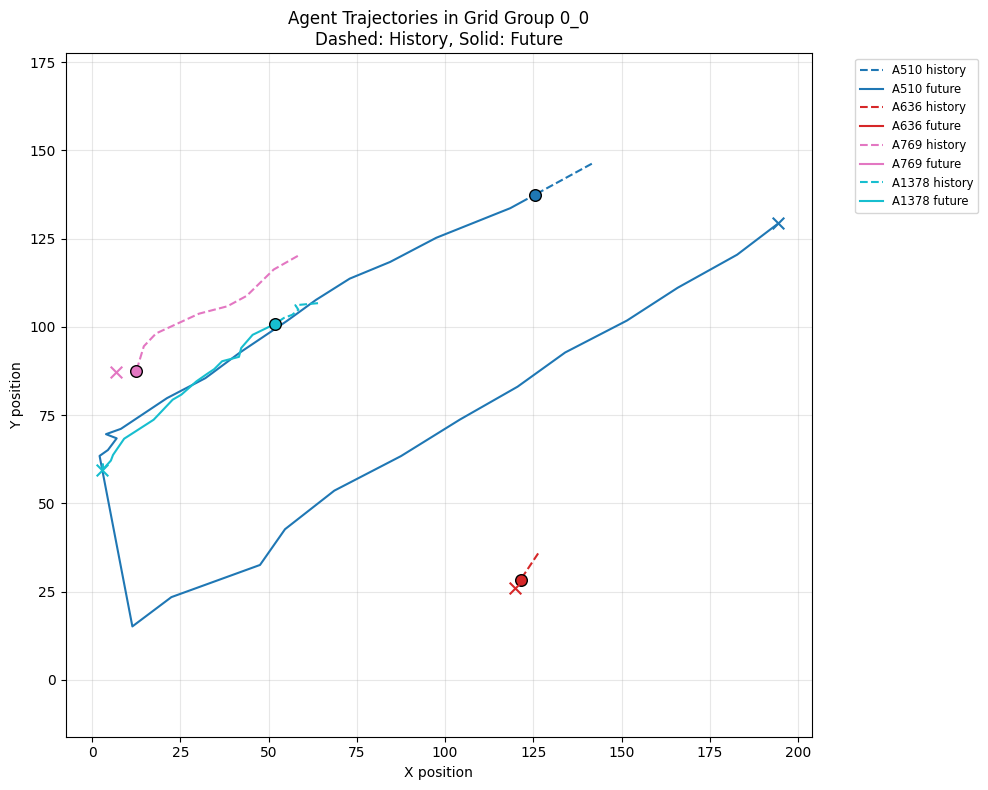

Agent 210: len(history)=8, len(future)=482


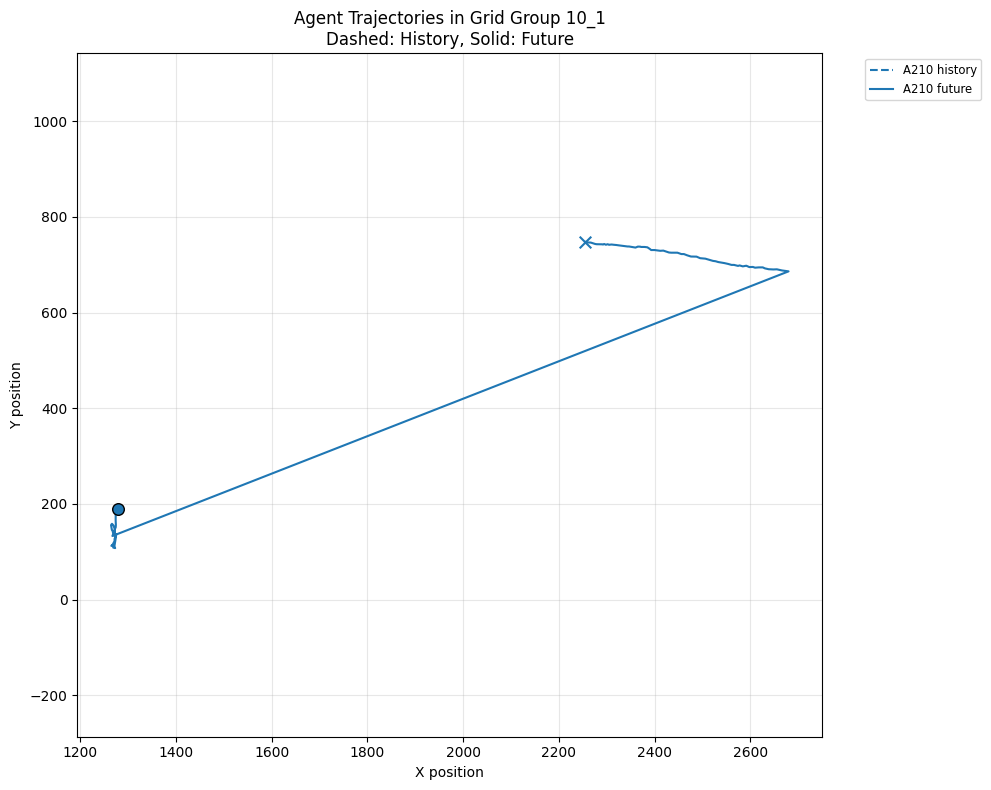

Agent 525: len(history)=8, len(future)=100
Agent 860: len(history)=8, len(future)=273
Agent 1227: len(history)=8, len(future)=310


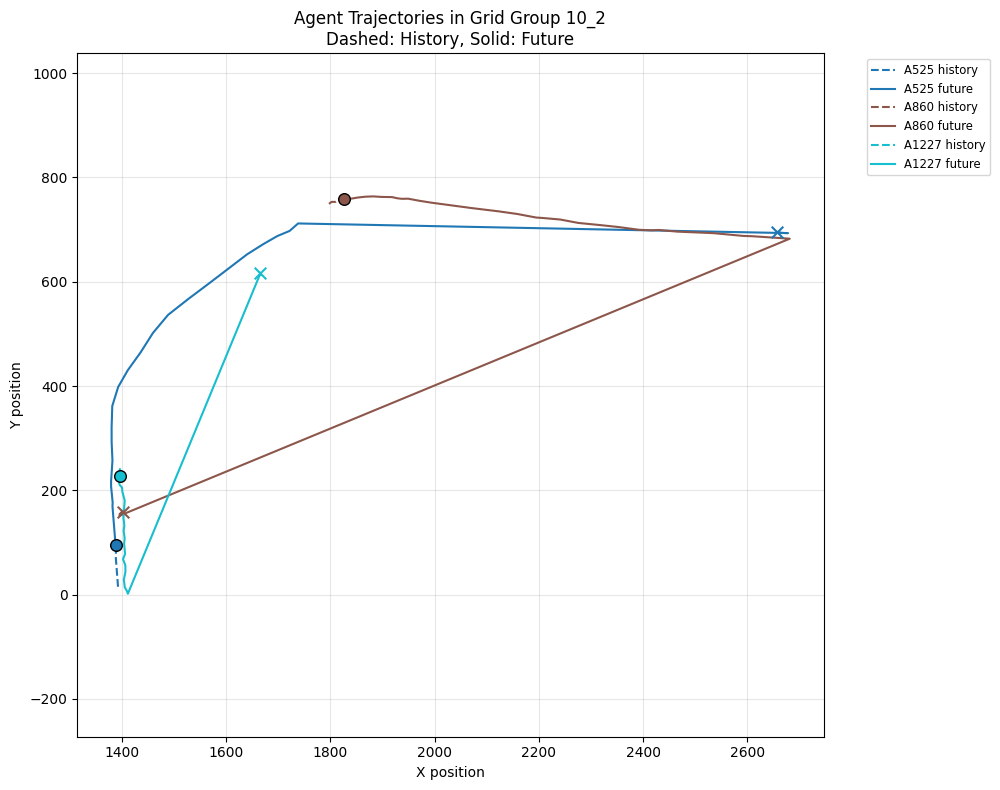

Agent 79: len(history)=8, len(future)=263
Agent 265: len(history)=8, len(future)=421
Agent 328: len(history)=8, len(future)=303
Agent 384: len(history)=8, len(future)=238
Agent 395: len(history)=8, len(future)=184
Agent 402: len(history)=8, len(future)=218
Agent 404: len(history)=8, len(future)=174
Agent 424: len(history)=8, len(future)=164
Agent 429: len(history)=8, len(future)=175
Agent 515: len(history)=8, len(future)=114
Agent 1072: len(history)=8, len(future)=422
Agent 1073: len(history)=8, len(future)=677
Agent 1189: len(history)=8, len(future)=306
Agent 1218: len(history)=8, len(future)=692
Agent 1229: len(history)=8, len(future)=691
Agent 1331: len(history)=8, len(future)=688
Agent 1336: len(history)=8, len(future)=474
Agent 1366: len(history)=8, len(future)=492


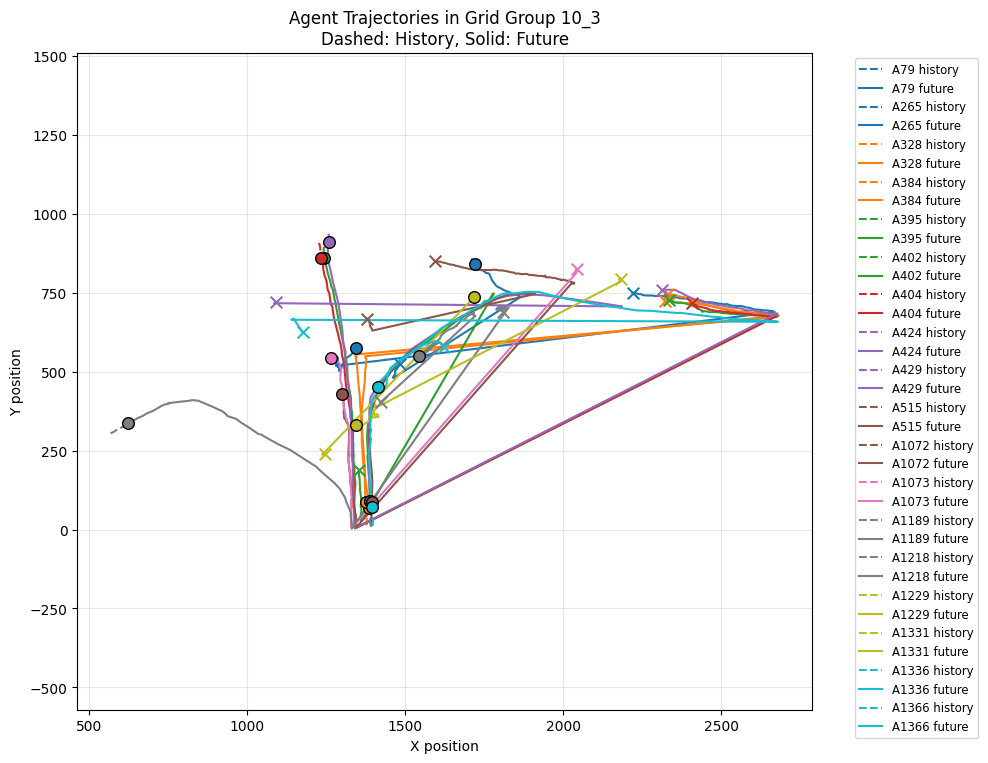

Agent 7: len(history)=8, len(future)=674
Agent 18: len(history)=8, len(future)=387
Agent 101: len(history)=8, len(future)=606
Agent 107: len(history)=8, len(future)=601
Agent 109: len(history)=8, len(future)=523
Agent 124: len(history)=8, len(future)=582
Agent 198: len(history)=8, len(future)=493
Agent 199: len(history)=8, len(future)=354
Agent 266: len(history)=8, len(future)=436
Agent 365: len(history)=8, len(future)=254
Agent 387: len(history)=8, len(future)=235
Agent 407: len(history)=8, len(future)=232
Agent 423: len(history)=8, len(future)=200
Agent 427: len(history)=8, len(future)=197
Agent 712: len(history)=8, len(future)=192
Agent 723: len(history)=8, len(future)=192
Agent 848: len(history)=8, len(future)=692
Agent 850: len(history)=8, len(future)=605
Agent 854: len(history)=8, len(future)=570
Agent 861: len(history)=8, len(future)=692
Agent 862: len(history)=8, len(future)=692
Agent 863: len(history)=8, len(future)=692
Agent 864: len(history)=8, len(future)=692
Agent 865: len

/tmp/ipython-input-622262192.py:64: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


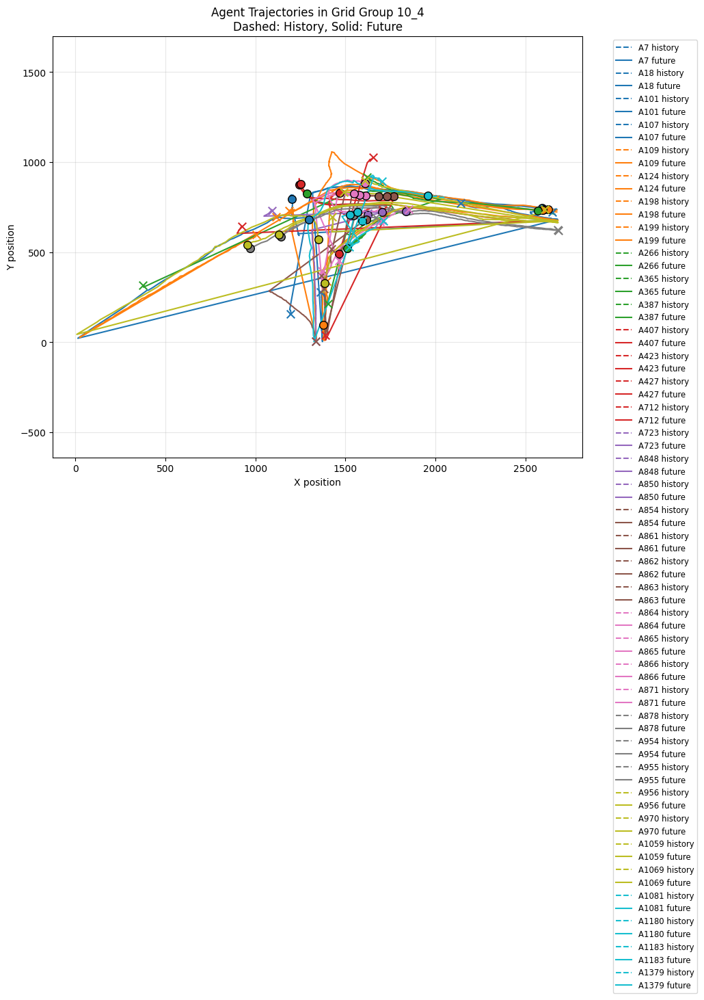

Agent 12: len(history)=8, len(future)=624
Agent 28: len(history)=8, len(future)=607
Agent 53: len(history)=8, len(future)=503
Agent 66: len(history)=8, len(future)=643
Agent 69: len(history)=8, len(future)=630
Agent 76: len(history)=8, len(future)=626
Agent 77: len(history)=8, len(future)=625
Agent 88: len(history)=8, len(future)=525
Agent 108: len(history)=8, len(future)=601
Agent 126: len(history)=8, len(future)=580
Agent 146: len(history)=8, len(future)=500
Agent 169: len(history)=8, len(future)=620
Agent 170: len(history)=8, len(future)=556
Agent 172: len(history)=8, len(future)=236
Agent 174: len(history)=8, len(future)=337
Agent 179: len(history)=8, len(future)=298
Agent 183: len(history)=8, len(future)=284
Agent 191: len(history)=8, len(future)=264
Agent 234: len(history)=8, len(future)=422
Agent 286: len(history)=8, len(future)=359
Agent 290: len(history)=8, len(future)=341
Agent 297: len(history)=8, len(future)=340
Agent 301: len(history)=8, len(future)=375
Agent 302: len(hist

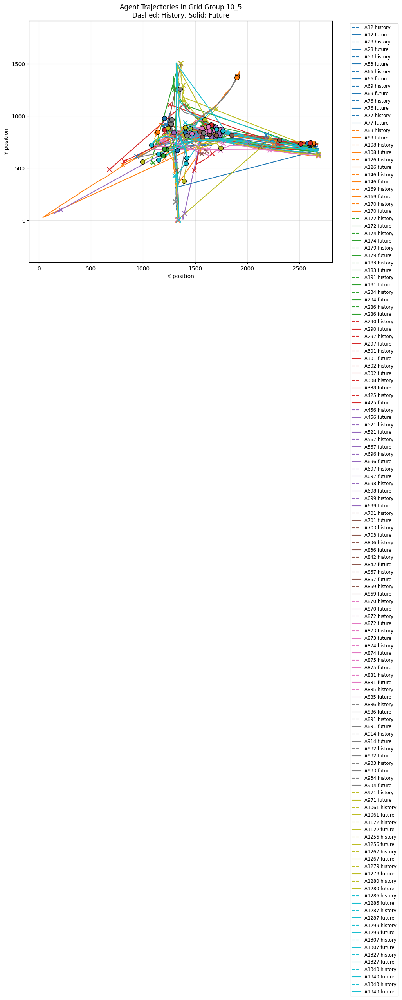

Agent 61: len(history)=8, len(future)=230
Agent 98: len(history)=8, len(future)=608
Agent 261: len(history)=8, len(future)=276
Agent 268: len(history)=8, len(future)=383
Agent 323: len(history)=8, len(future)=281
Agent 432: len(history)=8, len(future)=202
Agent 433: len(history)=8, len(future)=202
Agent 457: len(history)=8, len(future)=177
Agent 520: len(history)=8, len(future)=122
Agent 539: len(history)=8, len(future)=118
Agent 694: len(history)=8, len(future)=192
Agent 821: len(history)=8, len(future)=228
Agent 822: len(history)=8, len(future)=228
Agent 830: len(history)=8, len(future)=209
Agent 843: len(history)=8, len(future)=515
Agent 887: len(history)=8, len(future)=509
Agent 902: len(history)=8, len(future)=692
Agent 929: len(history)=8, len(future)=692
Agent 1066: len(history)=8, len(future)=221
Agent 1082: len(history)=8, len(future)=692
Agent 1086: len(history)=8, len(future)=287
Agent 1096: len(history)=8, len(future)=279
Agent 1184: len(history)=8, len(future)=434
Agent 12

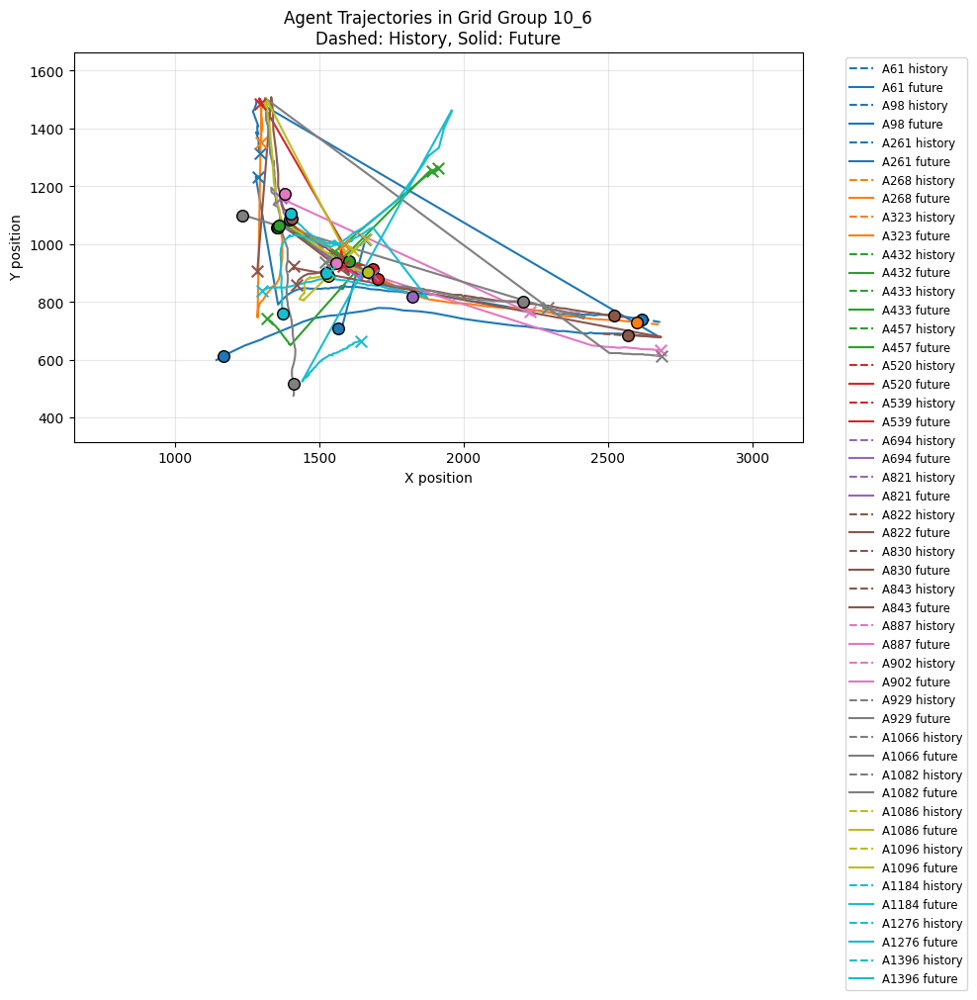

Agent 142: len(history)=8, len(future)=415
Agent 216: len(history)=8, len(future)=172
Agent 221: len(history)=8, len(future)=455
Agent 252: len(history)=8, len(future)=371
Agent 259: len(history)=8, len(future)=404
Agent 837: len(history)=8, len(future)=562
Agent 903: len(history)=8, len(future)=692
Agent 918: len(history)=8, len(future)=692
Agent 920: len(history)=8, len(future)=692
Agent 921: len(history)=8, len(future)=692
Agent 923: len(history)=8, len(future)=692
Agent 924: len(history)=8, len(future)=692
Agent 925: len(history)=8, len(future)=692


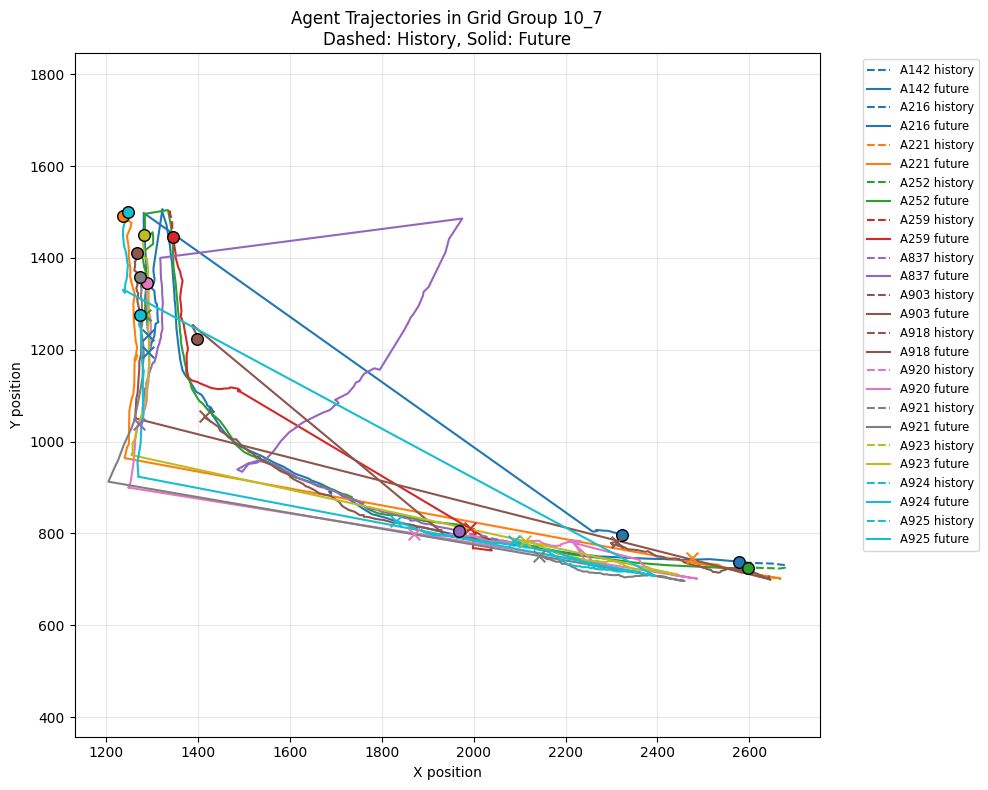

Agent 204: len(history)=8, len(future)=496
Agent 922: len(history)=8, len(future)=692
Agent 1333: len(history)=8, len(future)=572


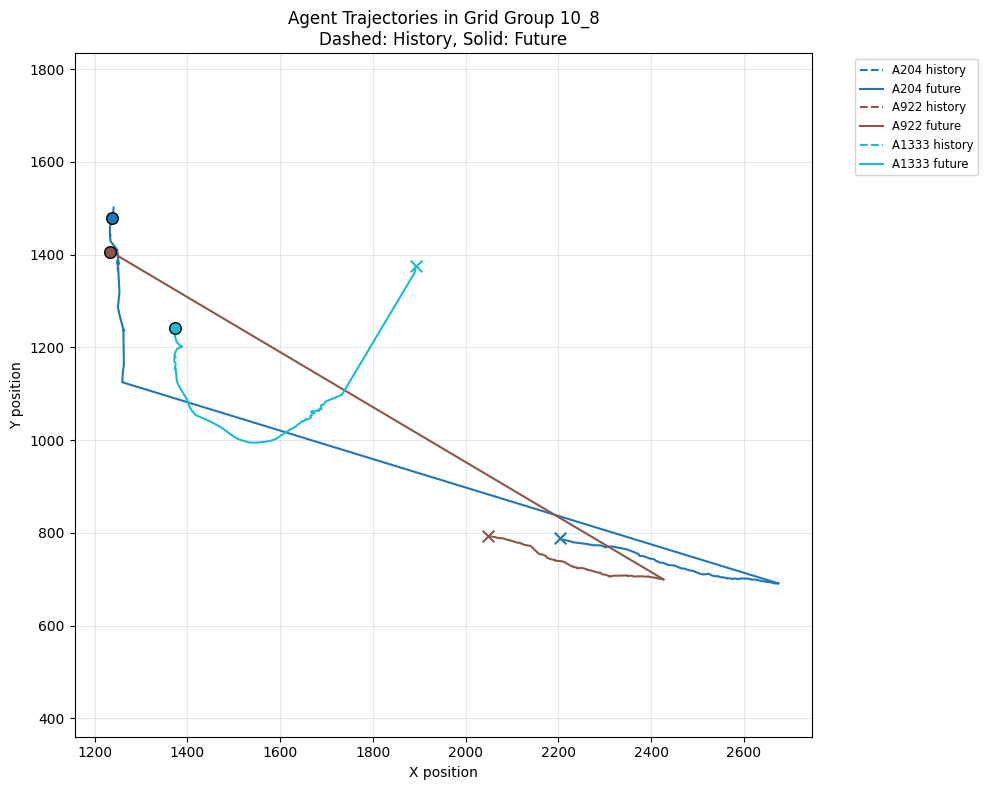

Agent 858: len(history)=8, len(future)=285


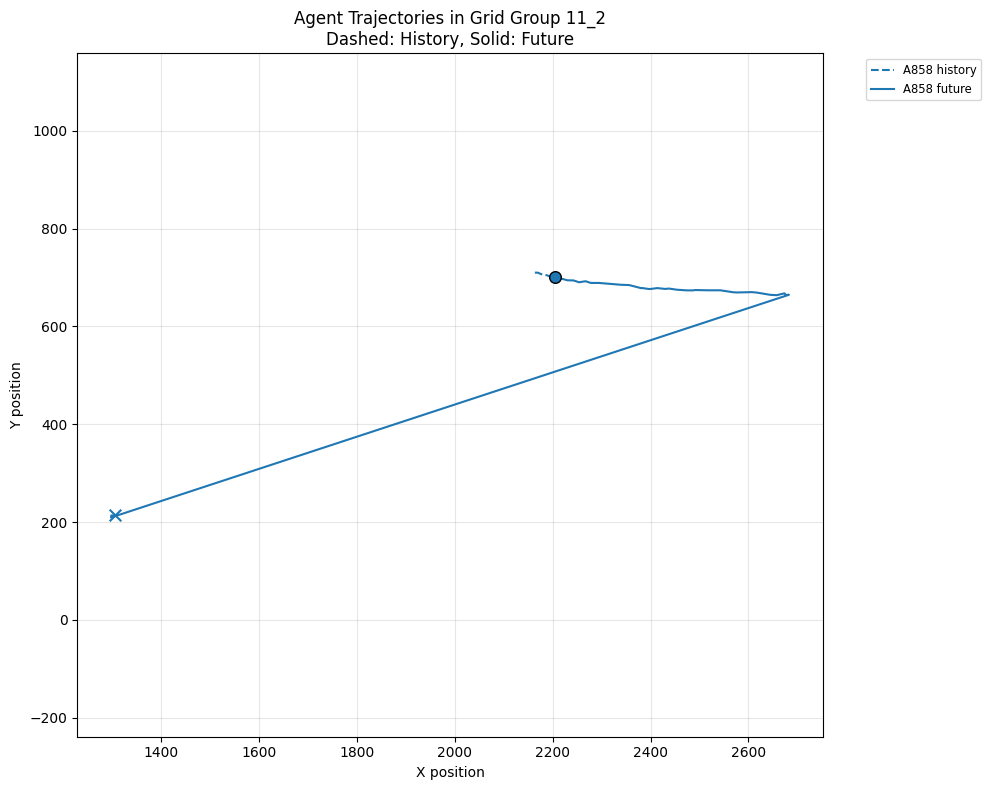

Agent 96: len(history)=8, len(future)=245
Agent 236: len(history)=8, len(future)=229
Agent 352: len(history)=8, len(future)=171
Agent 859: len(history)=8, len(future)=692
Agent 1034: len(history)=8, len(future)=361
Agent 1049: len(history)=8, len(future)=692
Agent 1195: len(history)=8, len(future)=228
Agent 1337: len(history)=8, len(future)=113


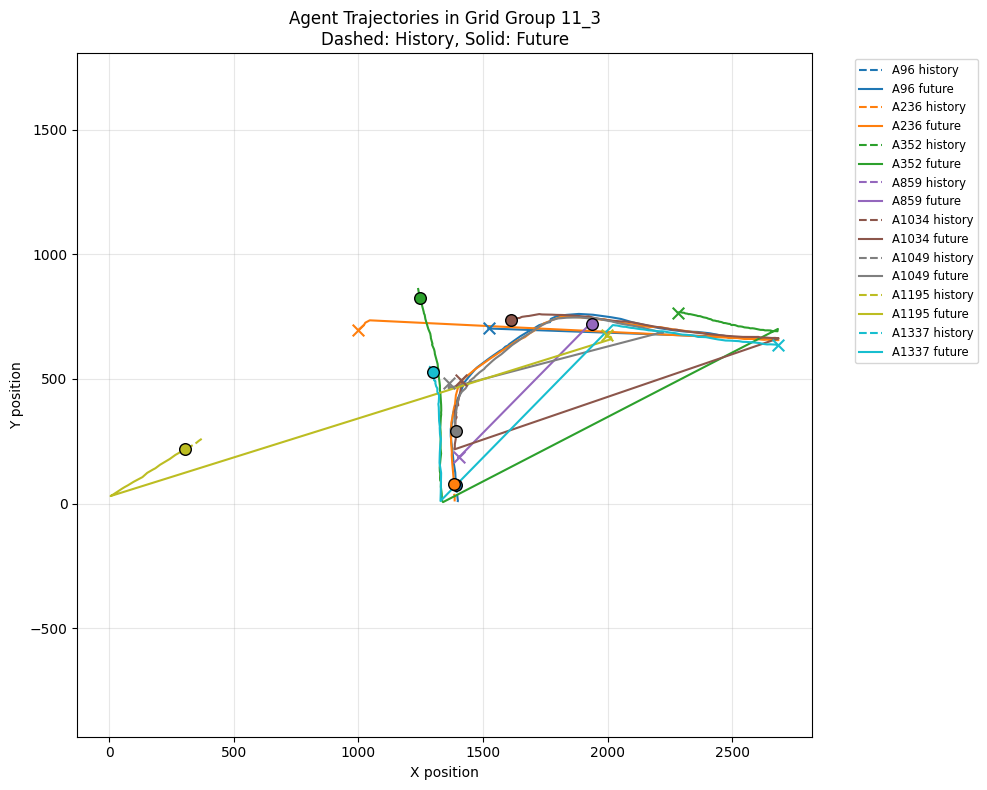

Agent 37: len(history)=8, len(future)=629
Agent 87: len(history)=8, len(future)=570
Agent 92: len(history)=8, len(future)=507
Agent 192: len(history)=8, len(future)=504
Agent 200: len(history)=8, len(future)=454
Agent 292: len(history)=8, len(future)=153
Agent 293: len(history)=8, len(future)=353
Agent 294: len(history)=8, len(future)=386
Agent 356: len(history)=8, len(future)=264
Agent 358: len(history)=8, len(future)=276
Agent 418: len(history)=8, len(future)=200
Agent 421: len(history)=8, len(future)=201
Agent 718: len(history)=8, len(future)=192
Agent 727: len(history)=8, len(future)=192
Agent 879: len(history)=8, len(future)=692
Agent 882: len(history)=8, len(future)=645
Agent 883: len(history)=8, len(future)=692
Agent 1045: len(history)=8, len(future)=658
Agent 1060: len(history)=8, len(future)=294
Agent 1075: len(history)=8, len(future)=251
Agent 1181: len(history)=8, len(future)=565
Agent 1192: len(history)=8, len(future)=219
Agent 1193: len(history)=8, len(future)=222
Agent 11

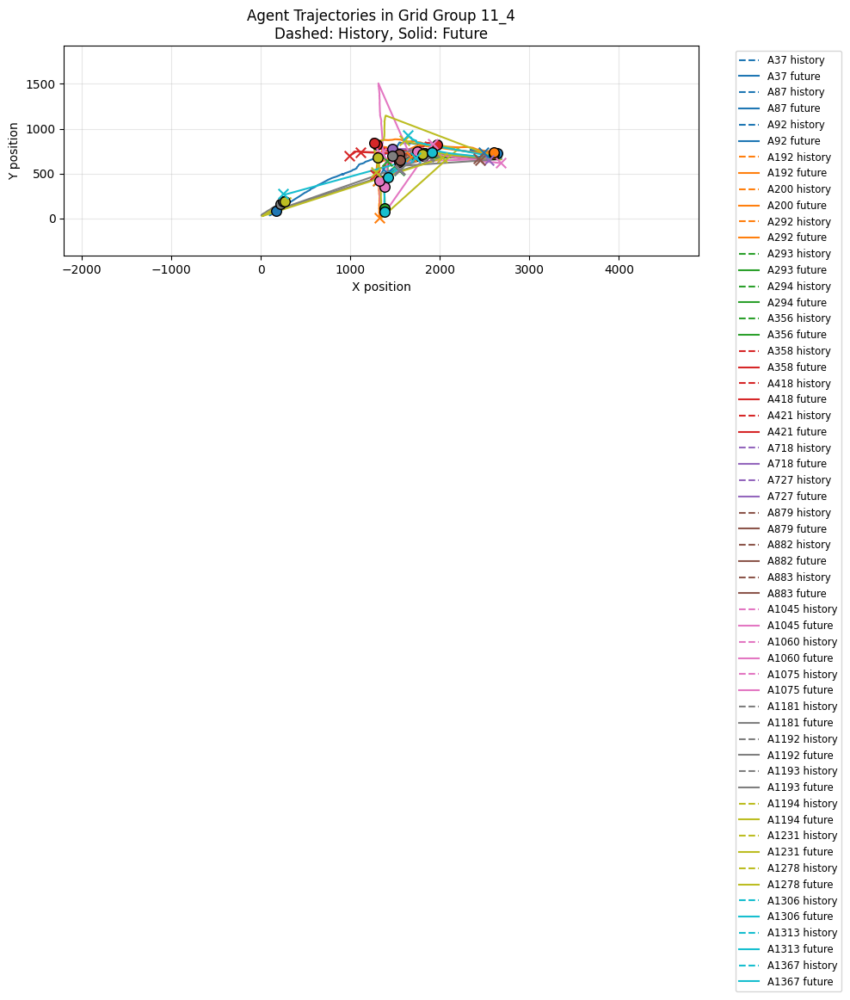

Agent 31: len(history)=8, len(future)=658
Agent 48: len(history)=8, len(future)=644
Agent 110: len(history)=8, len(future)=601
Agent 120: len(history)=8, len(future)=437
Agent 127: len(history)=8, len(future)=588
Agent 128: len(history)=8, len(future)=553
Agent 151: len(history)=8, len(future)=556
Agent 166: len(history)=8, len(future)=386
Agent 173: len(history)=8, len(future)=472
Agent 195: len(history)=8, len(future)=499
Agent 201: len(history)=8, len(future)=457
Agent 206: len(history)=8, len(future)=294
Agent 215: len(history)=8, len(future)=520
Agent 264: len(history)=8, len(future)=311
Agent 280: len(history)=8, len(future)=352
Agent 329: len(history)=8, len(future)=301
Agent 334: len(history)=8, len(future)=295
Agent 342: len(history)=8, len(future)=291
Agent 346: len(history)=8, len(future)=280
Agent 382: len(history)=8, len(future)=377
Agent 383: len(history)=8, len(future)=315
Agent 401: len(history)=8, len(future)=218
Agent 455: len(history)=8, len(future)=297
Agent 536: le

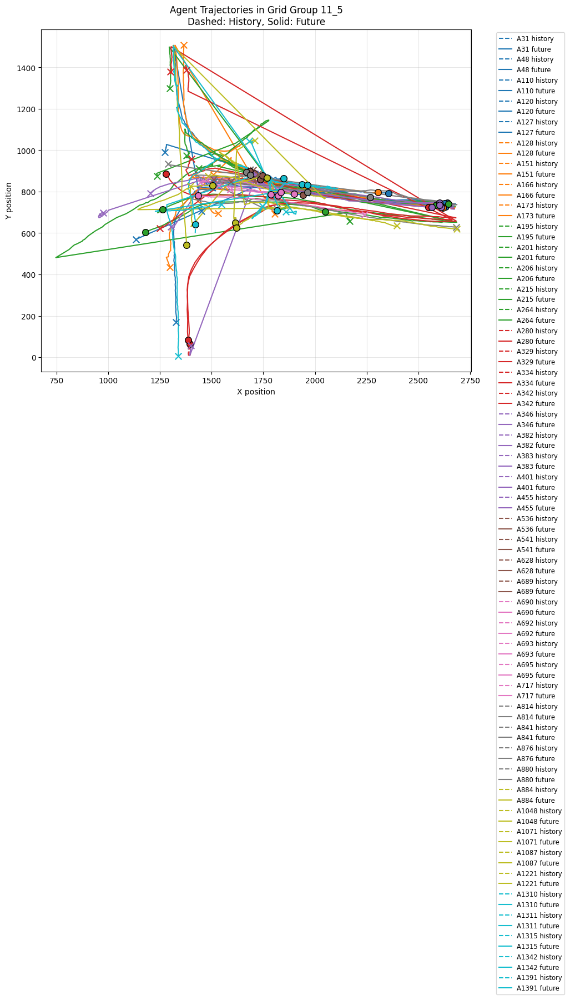

Agent 40: len(history)=8, len(future)=492
Agent 41: len(history)=8, len(future)=443
Agent 119: len(history)=8, len(future)=363
Agent 152: len(history)=8, len(future)=407
Agent 153: len(history)=8, len(future)=479
Agent 190: len(history)=8, len(future)=545
Agent 223: len(history)=8, len(future)=335
Agent 246: len(history)=8, len(future)=415
Agent 269: len(history)=8, len(future)=382
Agent 270: len(history)=8, len(future)=309
Agent 282: len(history)=8, len(future)=307
Agent 303: len(history)=8, len(future)=387
Agent 357: len(history)=8, len(future)=276
Agent 540: len(history)=8, len(future)=94
Agent 919: len(history)=8, len(future)=692
Agent 1088: len(history)=8, len(future)=257
Agent 1394: len(history)=8, len(future)=492


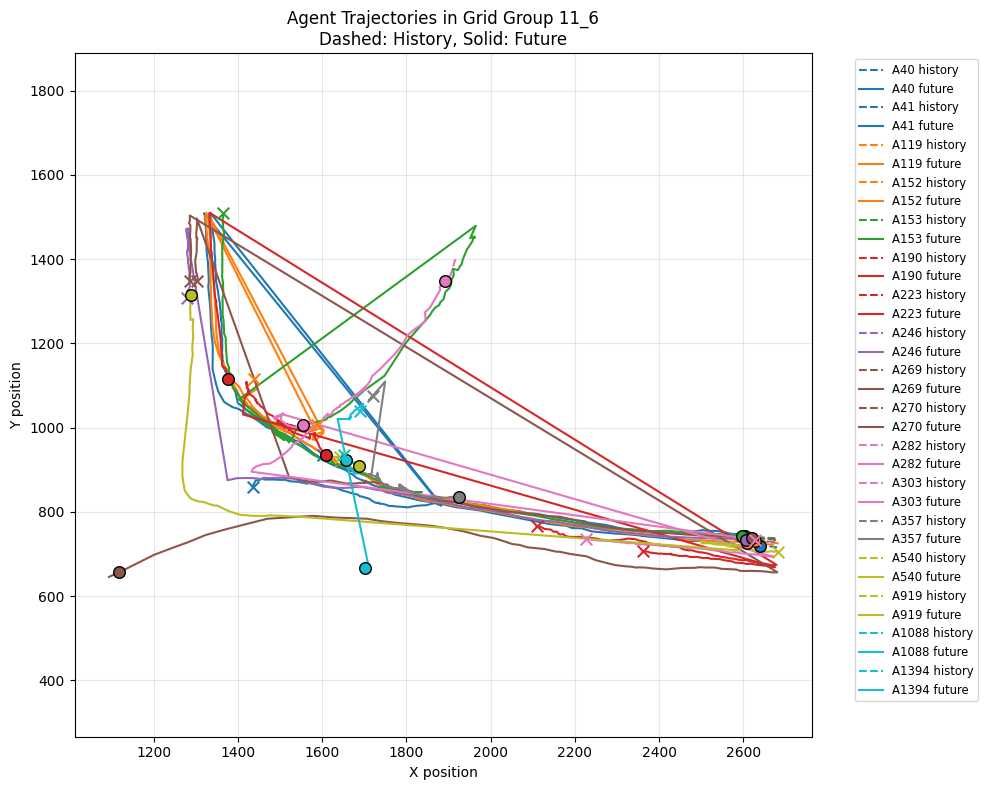

Agent 658: len(history)=8, len(future)=45
Agent 1095: len(history)=8, len(future)=692
Agent 1400: len(history)=8, len(future)=492


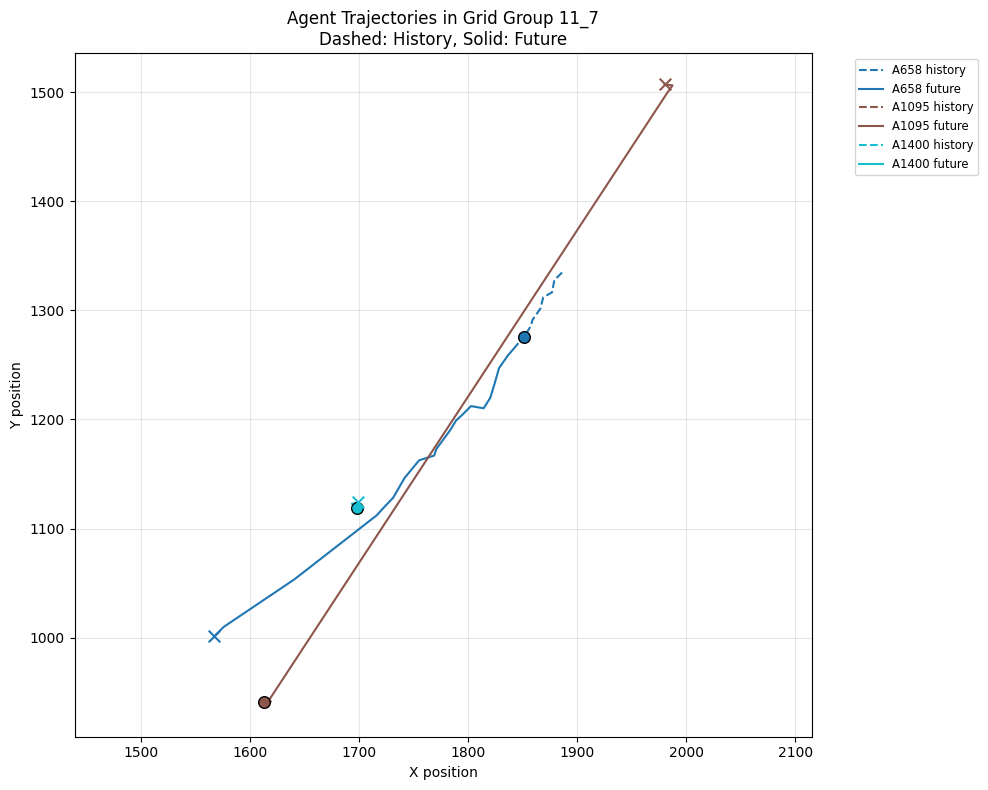

Agent 1091: len(history)=8, len(future)=316
Agent 1092: len(history)=8, len(future)=325


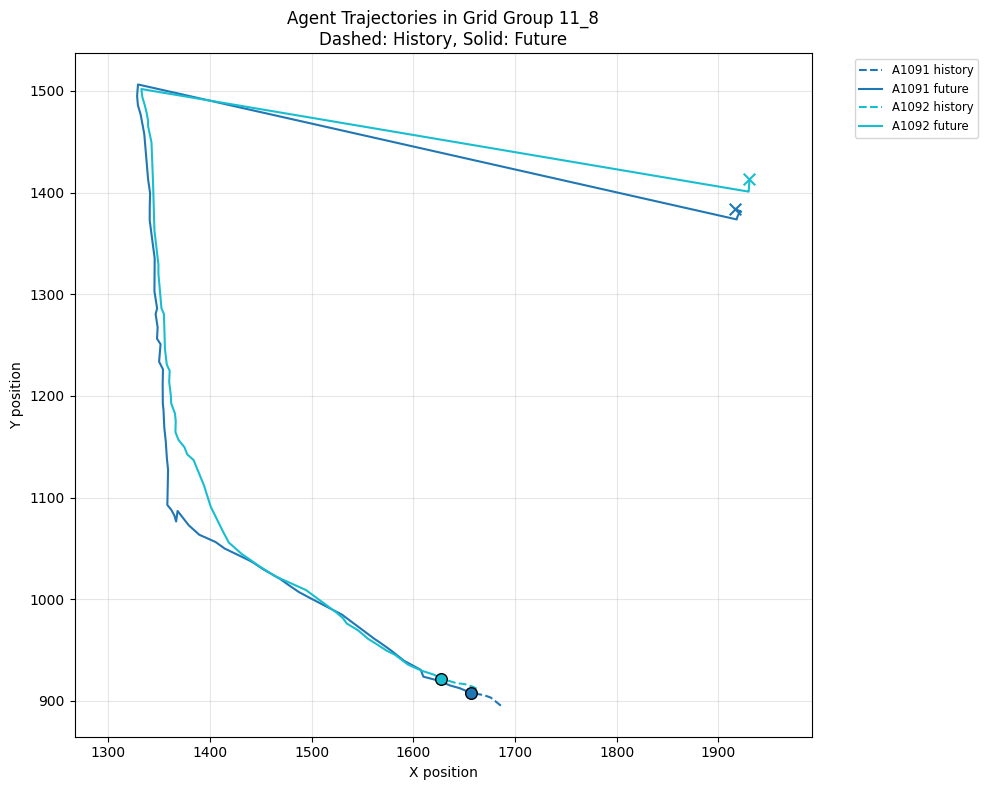

Agent 73: len(history)=8, len(future)=305
Agent 220: len(history)=8, len(future)=381
Agent 419: len(history)=8, len(future)=183
Agent 1191: len(history)=8, len(future)=156
Agent 1196: len(history)=8, len(future)=127
Agent 1322: len(history)=8, len(future)=256
Agent 1324: len(history)=8, len(future)=320


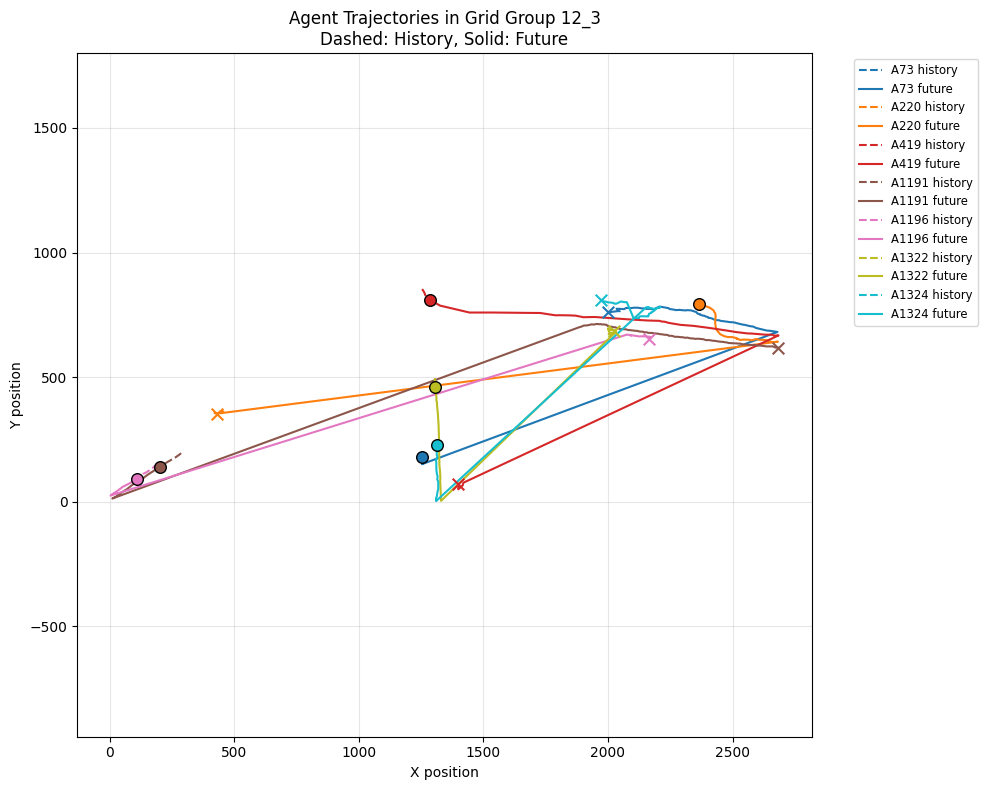

Agent 6: len(history)=8, len(future)=676
Agent 288: len(history)=8, len(future)=249
Agent 295: len(history)=8, len(future)=417
Agent 359: len(history)=8, len(future)=261
Agent 360: len(history)=8, len(future)=259
Agent 366: len(history)=8, len(future)=252
Agent 368: len(history)=8, len(future)=249
Agent 411: len(history)=8, len(future)=211
Agent 420: len(history)=8, len(future)=202
Agent 436: len(history)=8, len(future)=203
Agent 495: len(history)=8, len(future)=112
Agent 496: len(history)=8, len(future)=112
Agent 726: len(history)=8, len(future)=192
Agent 730: len(history)=8, len(future)=183
Agent 849: len(history)=8, len(future)=692
Agent 877: len(history)=8, len(future)=341
Agent 1065: len(history)=8, len(future)=337
Agent 1084: len(history)=8, len(future)=533
Agent 1220: len(history)=8, len(future)=214
Agent 1222: len(history)=8, len(future)=641
Agent 1314: len(history)=8, len(future)=601
Agent 1375: len(history)=8, len(future)=492
Agent 1376: len(history)=8, len(future)=250


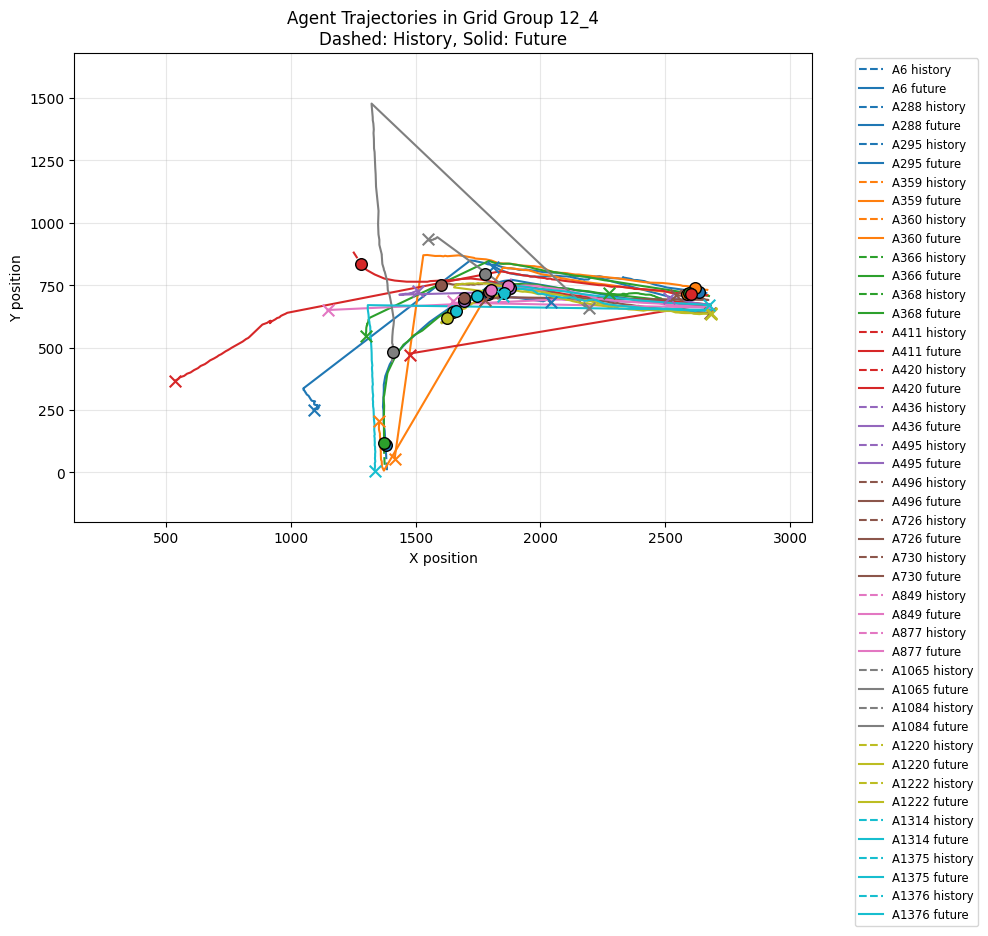

Agent 13: len(history)=8, len(future)=669
Agent 32: len(history)=8, len(future)=607
Agent 121: len(history)=8, len(future)=401
Agent 178: len(history)=8, len(future)=188
Agent 217: len(history)=8, len(future)=494
Agent 263: len(history)=8, len(future)=393
Agent 317: len(history)=8, len(future)=322
Agent 318: len(history)=8, len(future)=126
Agent 354: len(history)=8, len(future)=231
Agent 373: len(history)=8, len(future)=246
Agent 392: len(history)=8, len(future)=227
Agent 412: len(history)=8, len(future)=207
Agent 434: len(history)=8, len(future)=189
Agent 451: len(history)=8, len(future)=176
Agent 454: len(history)=8, len(future)=215
Agent 468: len(history)=8, len(future)=154
Agent 494: len(history)=8, len(future)=163
Agent 686: len(history)=8, len(future)=192
Agent 687: len(history)=8, len(future)=192
Agent 688: len(history)=8, len(future)=192
Agent 691: len(history)=8, len(future)=192
Agent 815: len(history)=8, len(future)=192
Agent 816: len(history)=8, len(future)=192
Agent 819: le

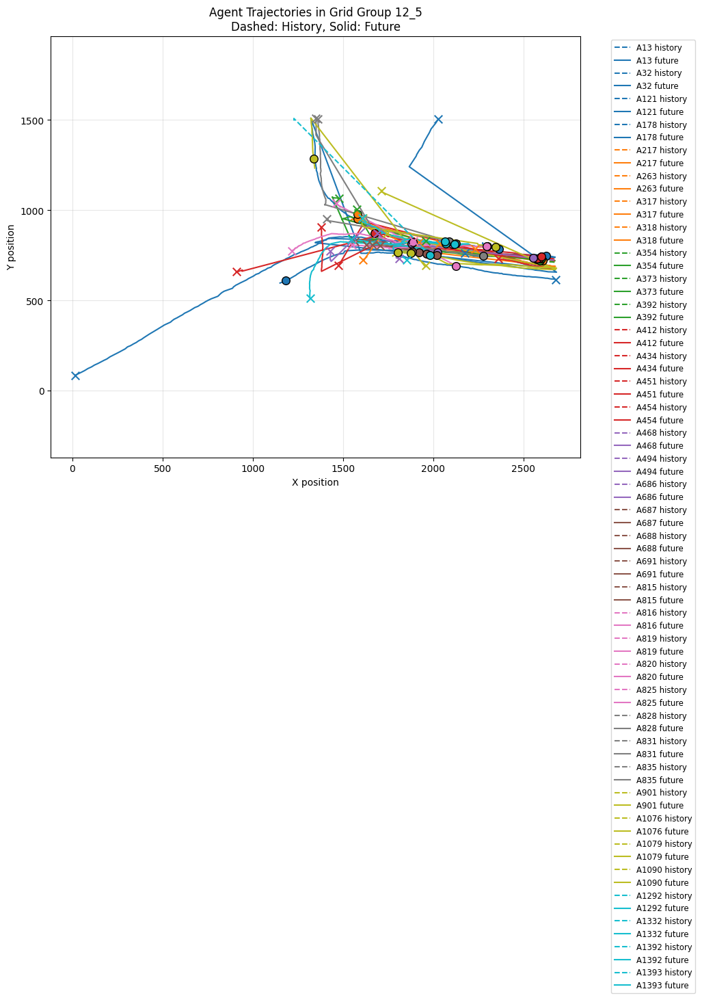

Agent 30: len(history)=8, len(future)=391
Agent 380: len(history)=8, len(future)=277
Agent 832: len(history)=8, len(future)=692


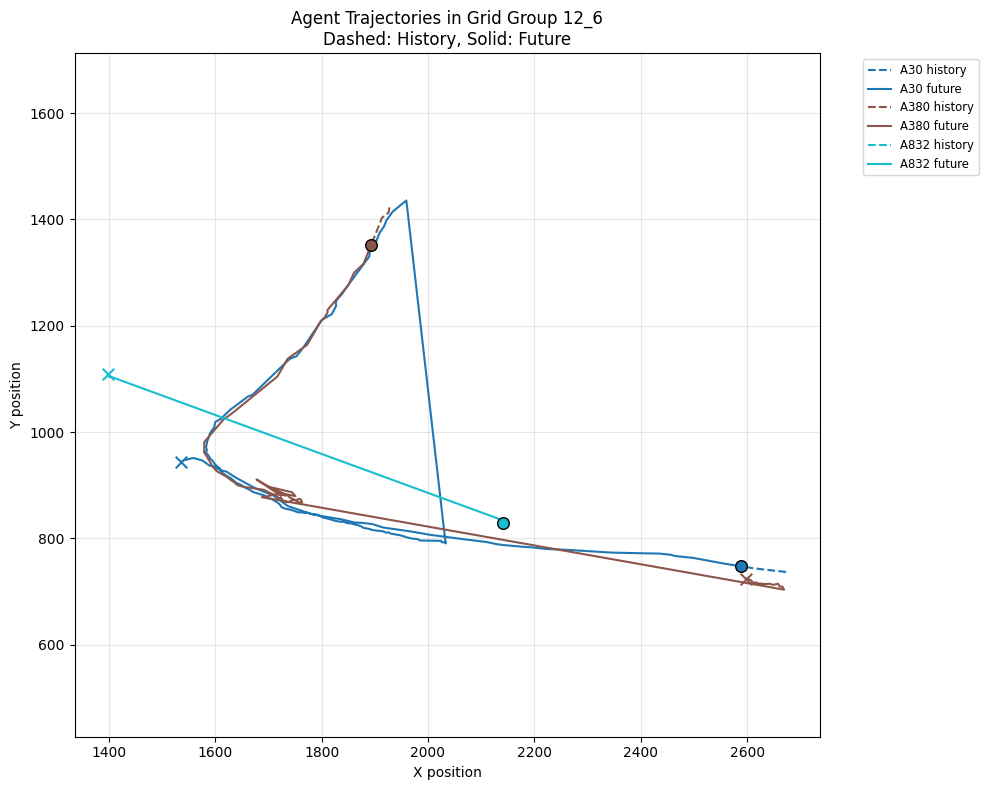

Agent 659: len(history)=8, len(future)=43
Agent 660: len(history)=8, len(future)=32
Agent 1094: len(history)=8, len(future)=346
Agent 1402: len(history)=8, len(future)=142


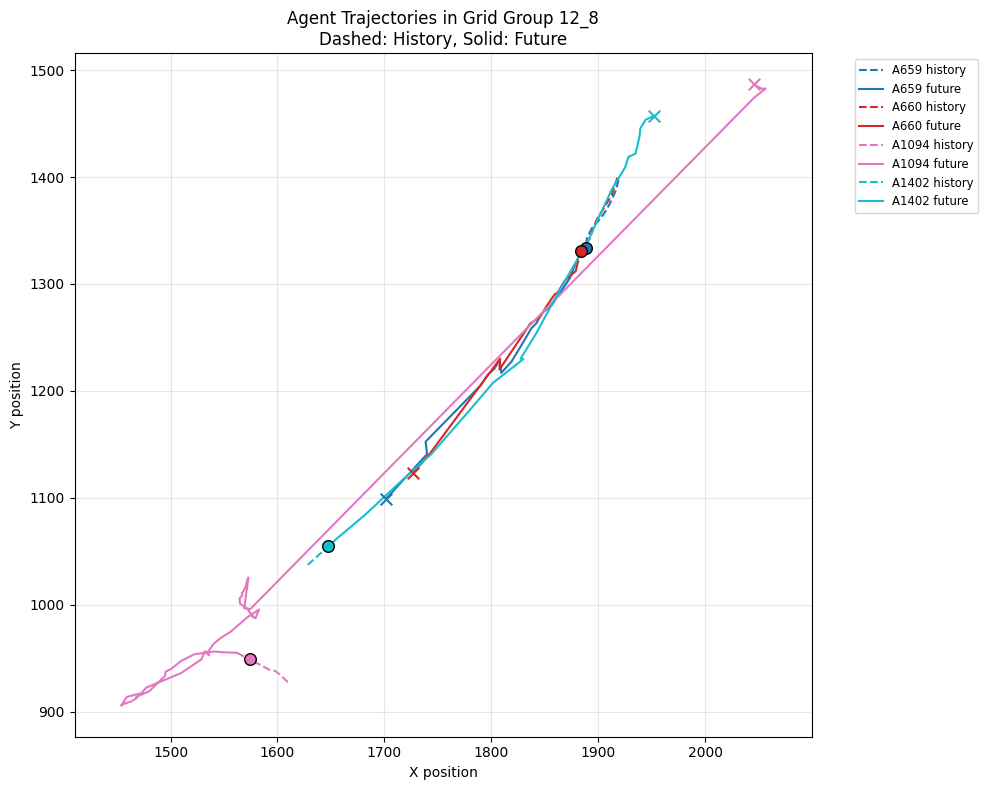

Agent 1093: len(history)=8, len(future)=291
Agent 1401: len(history)=8, len(future)=492


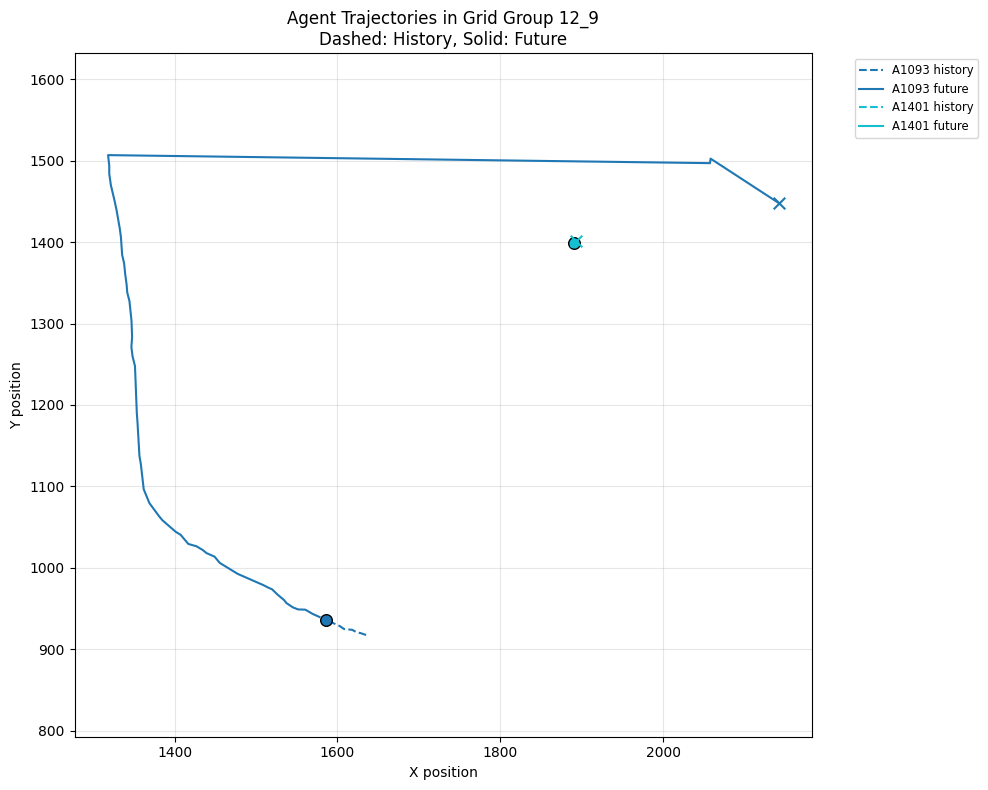

Agent 65: len(history)=8, len(future)=251
Agent 1197: len(history)=8, len(future)=49


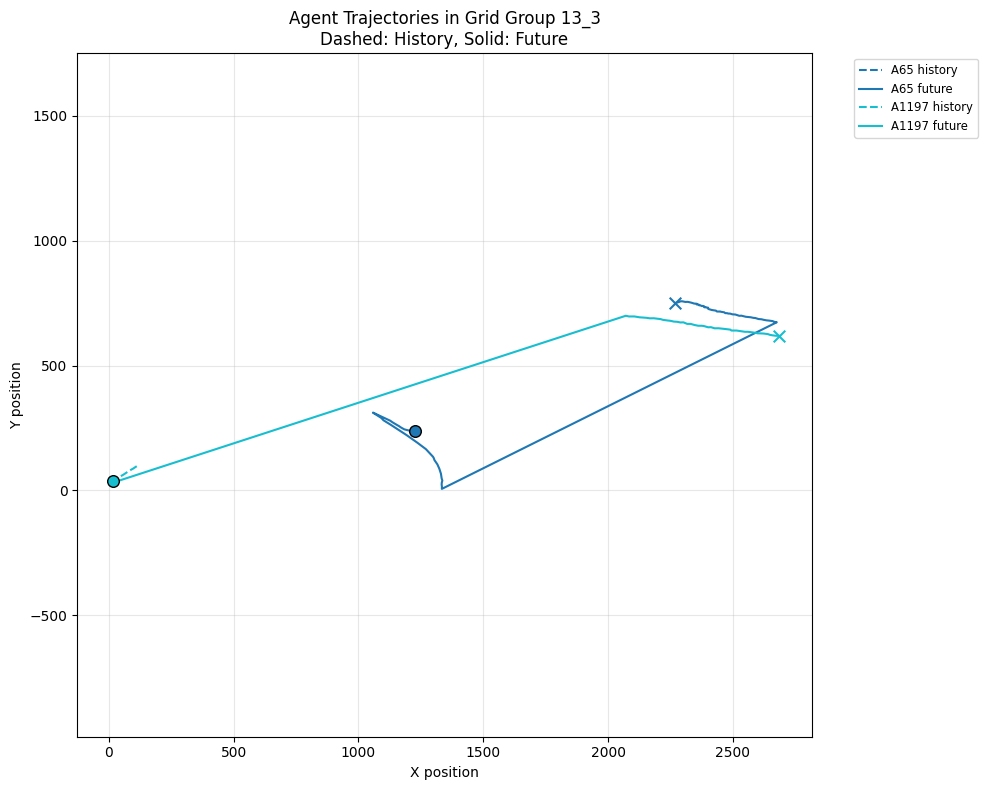

Agent 38: len(history)=8, len(future)=392
Agent 177: len(history)=8, len(future)=304
Agent 257: len(history)=8, len(future)=427
Agent 258: len(history)=8, len(future)=416
Agent 308: len(history)=8, len(future)=212
Agent 367: len(history)=8, len(future)=252
Agent 467: len(history)=8, len(future)=156
Agent 594: len(history)=8, len(future)=120
Agent 595: len(history)=8, len(future)=120
Agent 596: len(history)=8, len(future)=240
Agent 597: len(history)=8, len(future)=133
Agent 719: len(history)=8, len(future)=153
Agent 720: len(history)=8, len(future)=127
Agent 721: len(history)=8, len(future)=94
Agent 722: len(history)=8, len(future)=104
Agent 803: len(history)=8, len(future)=178
Agent 806: len(history)=8, len(future)=192
Agent 1062: len(history)=8, len(future)=230
Agent 1063: len(history)=8, len(future)=151
Agent 1064: len(history)=8, len(future)=152


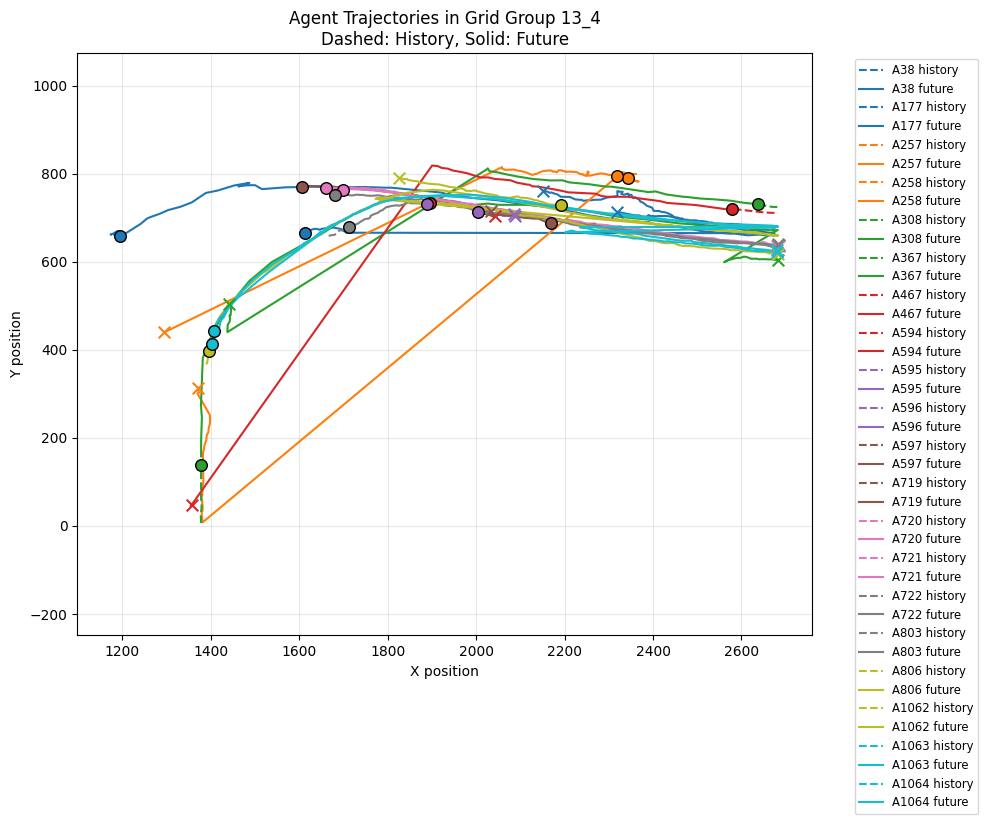

Agent 27: len(history)=8, len(future)=195
Agent 47: len(history)=8, len(future)=647
Agent 193: len(history)=8, len(future)=381
Agent 224: len(history)=8, len(future)=369
Agent 254: len(history)=8, len(future)=422
Agent 255: len(history)=8, len(future)=427
Agent 283: len(history)=8, len(future)=367
Agent 437: len(history)=8, len(future)=230
Agent 439: len(history)=8, len(future)=172
Agent 441: len(history)=8, len(future)=58
Agent 445: len(history)=8, len(future)=86
Agent 448: len(history)=8, len(future)=217
Agent 449: len(history)=8, len(future)=178
Agent 450: len(history)=8, len(future)=176
Agent 505: len(history)=8, len(future)=126
Agent 523: len(history)=8, len(future)=105
Agent 680: len(history)=8, len(future)=192
Agent 681: len(history)=8, len(future)=192
Agent 682: len(history)=8, len(future)=192
Agent 683: len(history)=8, len(future)=192
Agent 684: len(history)=8, len(future)=192
Agent 685: len(history)=8, len(future)=192
Agent 807: len(history)=8, len(future)=192
Agent 812: len(

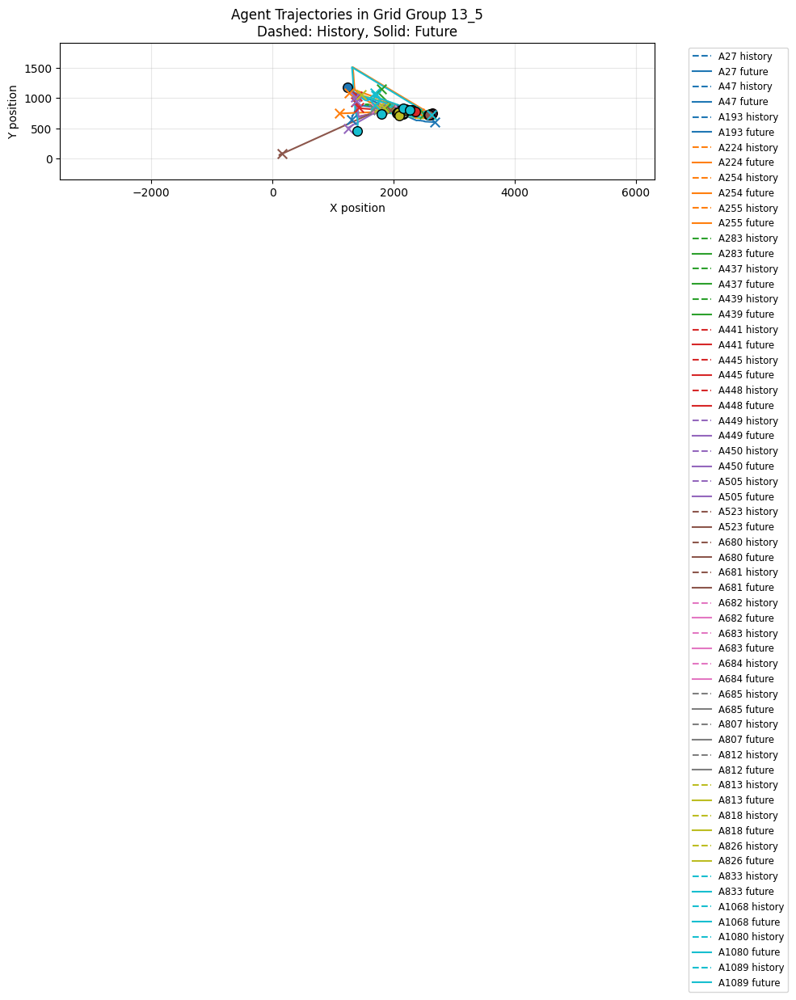

Agent 447: len(history)=8, len(future)=217


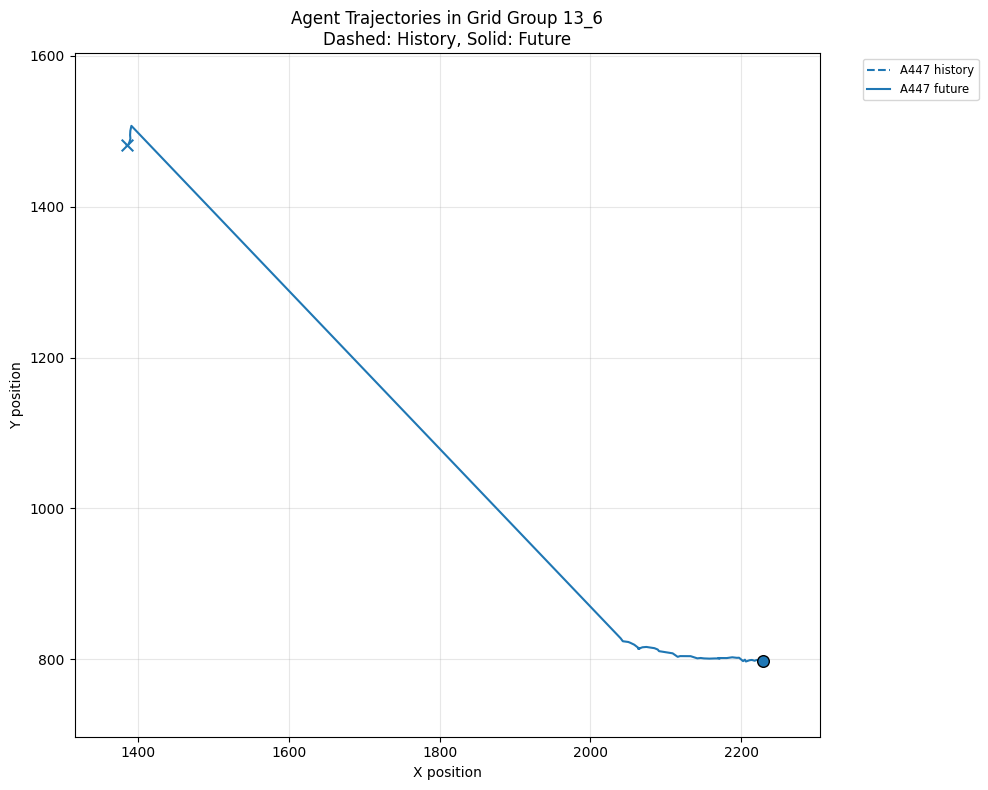

Agent 476: len(history)=8, len(future)=61


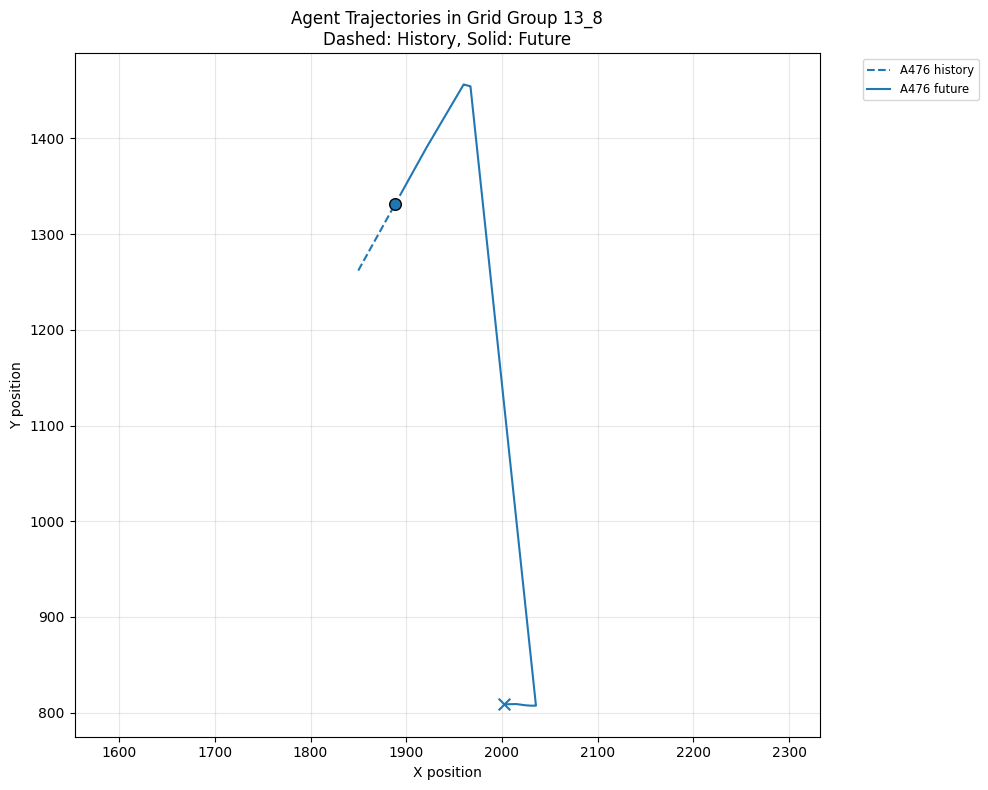

Agent 39: len(history)=8, len(future)=284
Agent 202: len(history)=8, len(future)=499
Agent 225: len(history)=8, len(future)=461
Agent 253: len(history)=8, len(future)=432
Agent 598: len(history)=8, len(future)=119
Agent 676: len(history)=8, len(future)=192
Agent 677: len(history)=8, len(future)=192
Agent 678: len(history)=8, len(future)=192
Agent 724: len(history)=8, len(future)=71
Agent 725: len(history)=8, len(future)=65


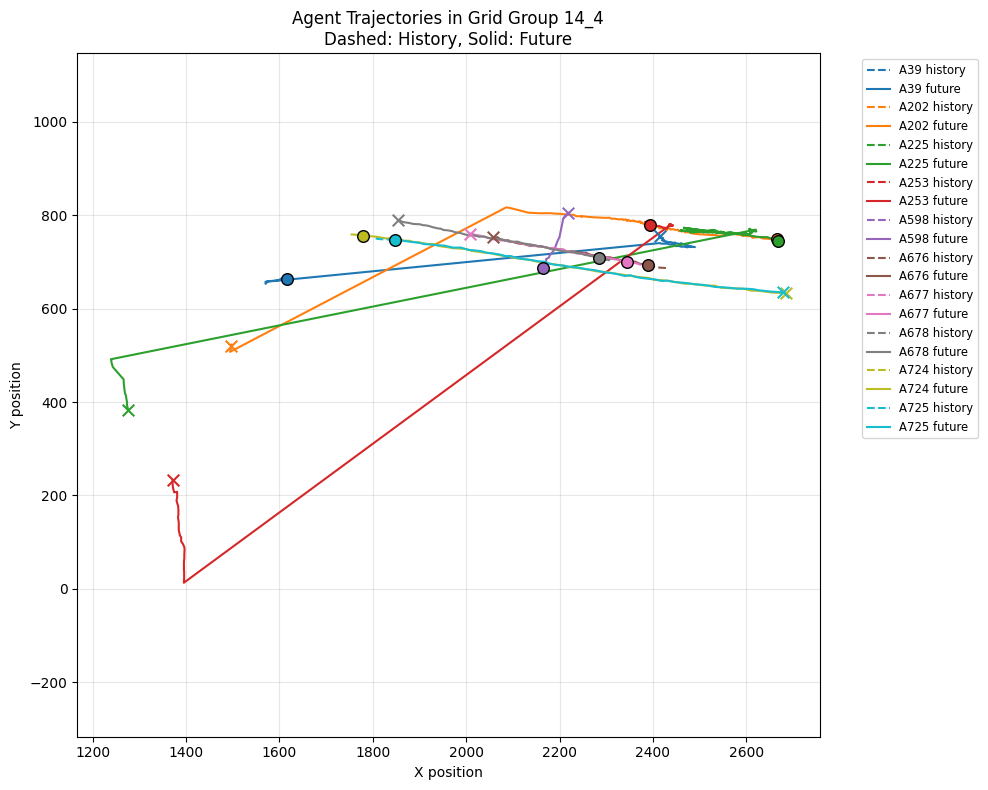

Agent 33: len(history)=8, len(future)=598
Agent 218: len(history)=8, len(future)=413
Agent 438: len(history)=8, len(future)=229
Agent 440: len(history)=8, len(future)=266
Agent 462: len(history)=8, len(future)=165
Agent 474: len(history)=8, len(future)=146
Agent 497: len(history)=8, len(future)=131
Agent 498: len(history)=8, len(future)=129
Agent 512: len(history)=8, len(future)=115
Agent 513: len(history)=8, len(future)=113
Agent 522: len(history)=8, len(future)=106
Agent 537: len(history)=8, len(future)=85
Agent 538: len(history)=8, len(future)=82
Agent 561: len(history)=8, len(future)=71
Agent 679: len(history)=8, len(future)=192
Agent 805: len(history)=8, len(future)=192
Agent 808: len(history)=8, len(future)=192
Agent 809: len(history)=8, len(future)=192
Agent 810: len(history)=8, len(future)=192
Agent 811: len(history)=8, len(future)=192
Agent 817: len(history)=8, len(future)=329
Agent 834: len(history)=8, len(future)=512
Agent 1077: len(history)=8, len(future)=531
Agent 1078: le

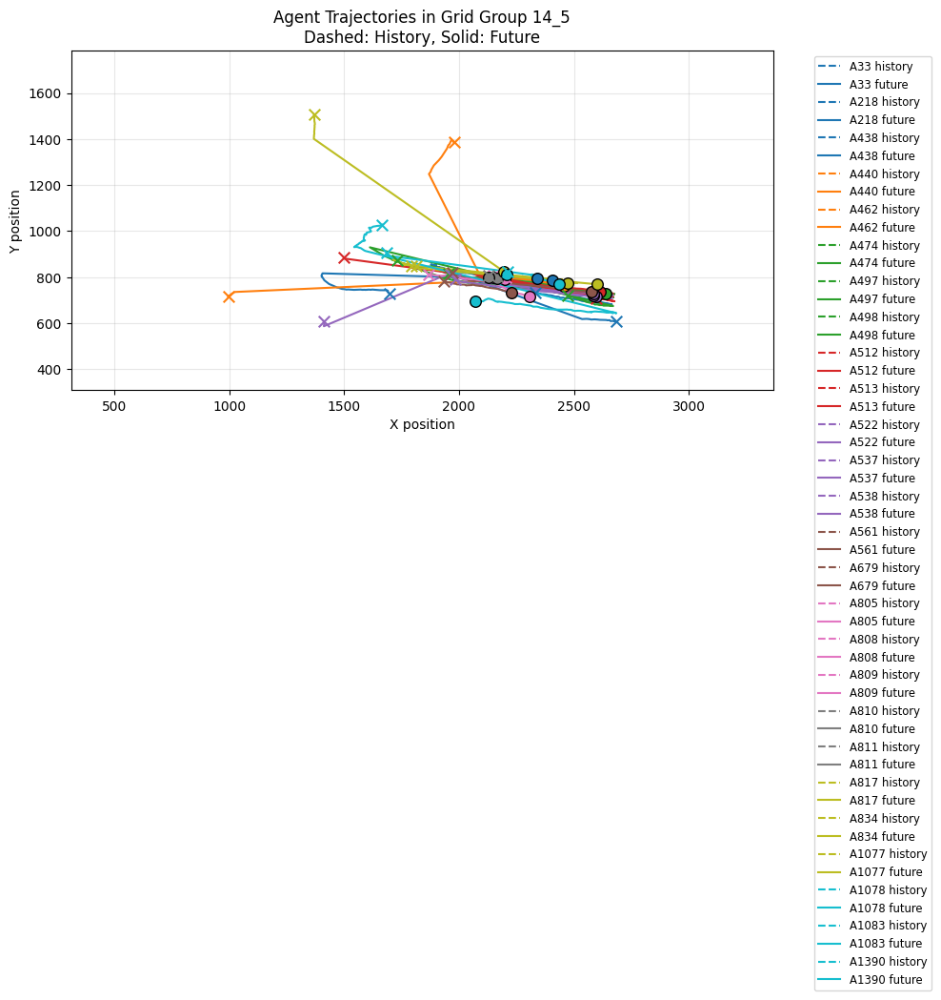

Agent 475: len(history)=8, len(future)=53


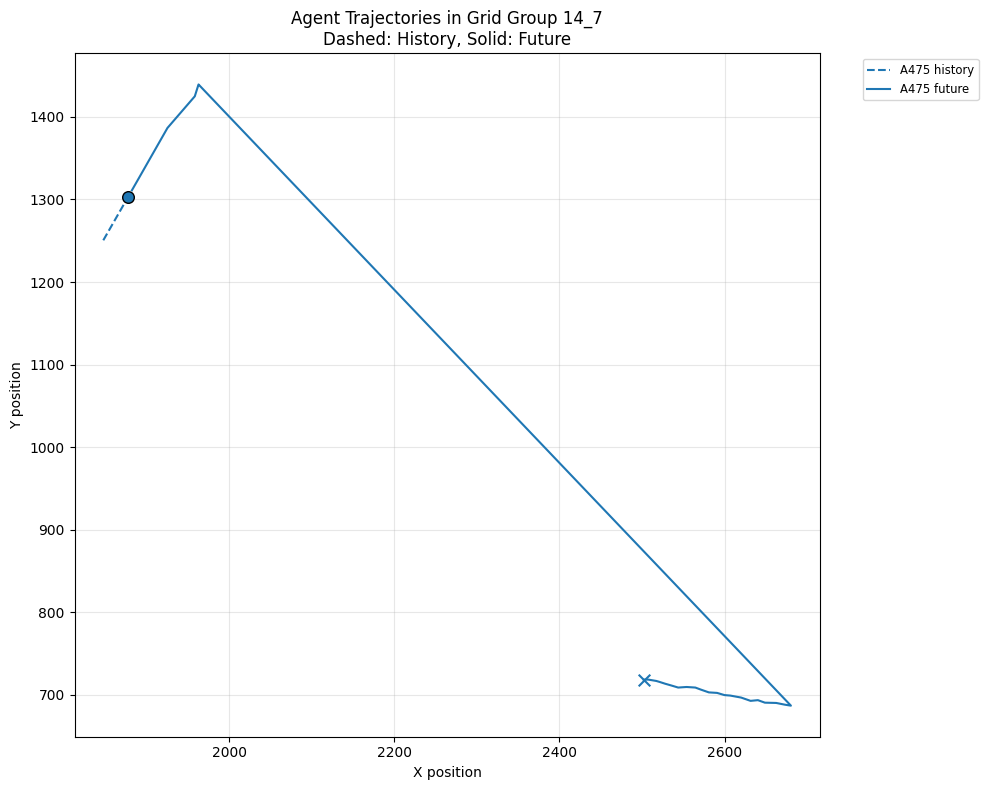

Agent 580: len(history)=8, len(future)=58
Agent 674: len(history)=8, len(future)=192
Agent 804: len(history)=8, len(future)=192
Agent 857: len(history)=8, len(future)=692


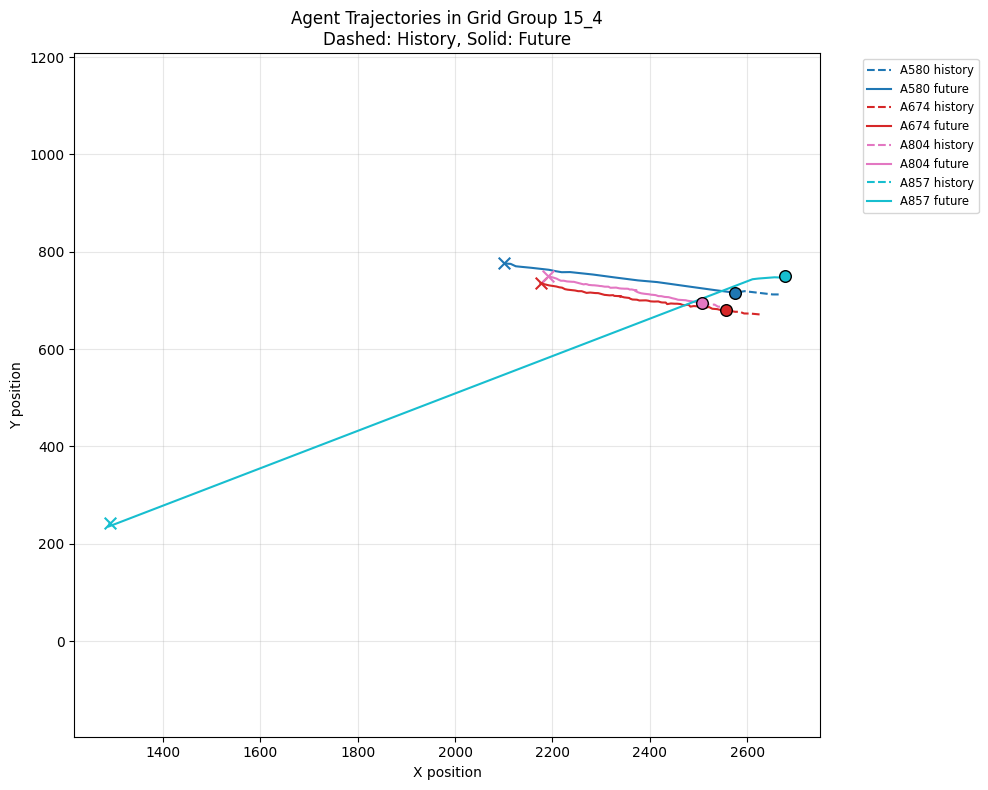

Agent 256: len(history)=8, len(future)=335
Agent 443: len(history)=8, len(future)=131
Agent 444: len(history)=8, len(future)=250
Agent 446: len(history)=8, len(future)=233
Agent 524: len(history)=8, len(future)=100
Agent 530: len(history)=8, len(future)=90
Agent 550: len(history)=8, len(future)=77
Agent 552: len(history)=8, len(future)=72
Agent 585: len(history)=8, len(future)=50
Agent 587: len(history)=8, len(future)=47
Agent 1308: len(history)=8, len(future)=692
Agent 1309: len(history)=8, len(future)=692


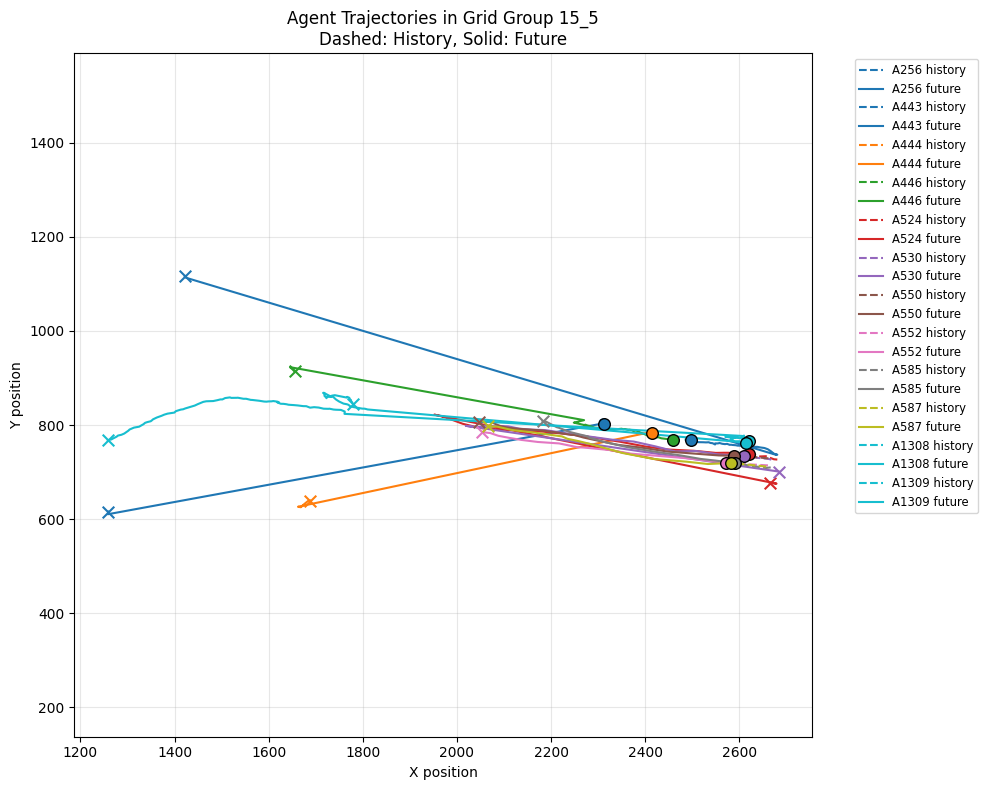

Agent 442: len(history)=8, len(future)=223
Agent 575: len(history)=8, len(future)=71
Agent 609: len(history)=8, len(future)=36
Agent 614: len(history)=8, len(future)=23
Agent 615: len(history)=8, len(future)=31
Agent 624: len(history)=8, len(future)=15
Agent 625: len(history)=8, len(future)=12


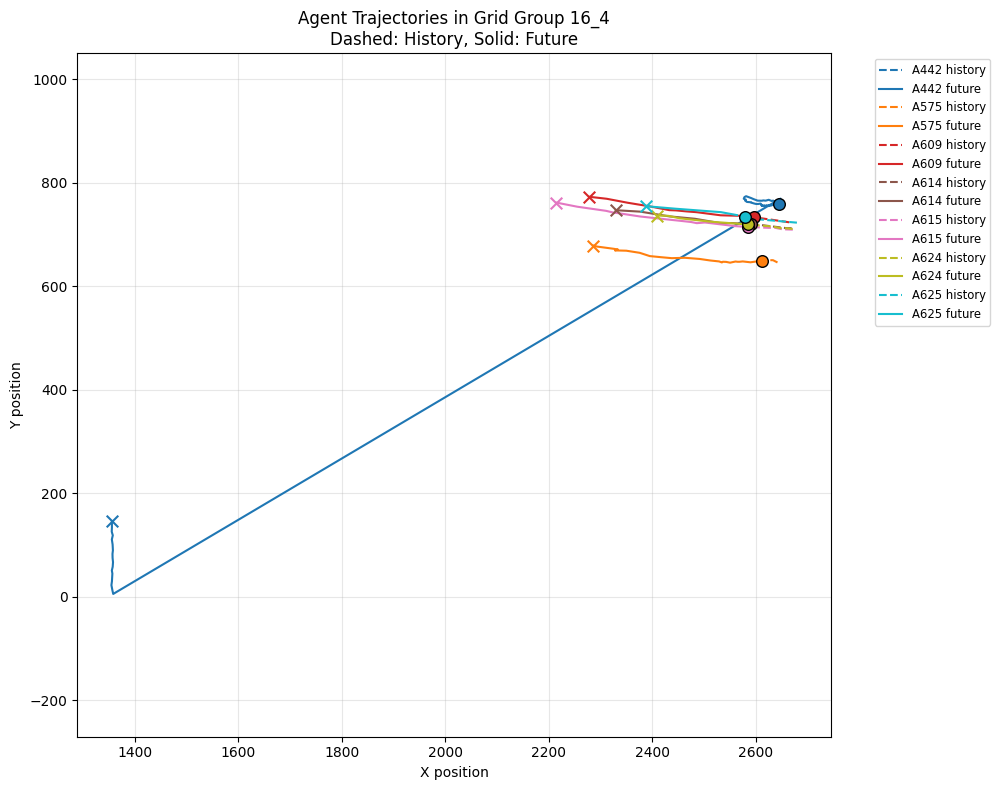

Agent 499: len(history)=8, len(future)=135
Agent 579: len(history)=8, len(future)=60
Agent 582: len(history)=8, len(future)=52
Agent 586: len(history)=8, len(future)=50
Agent 616: len(history)=8, len(future)=31


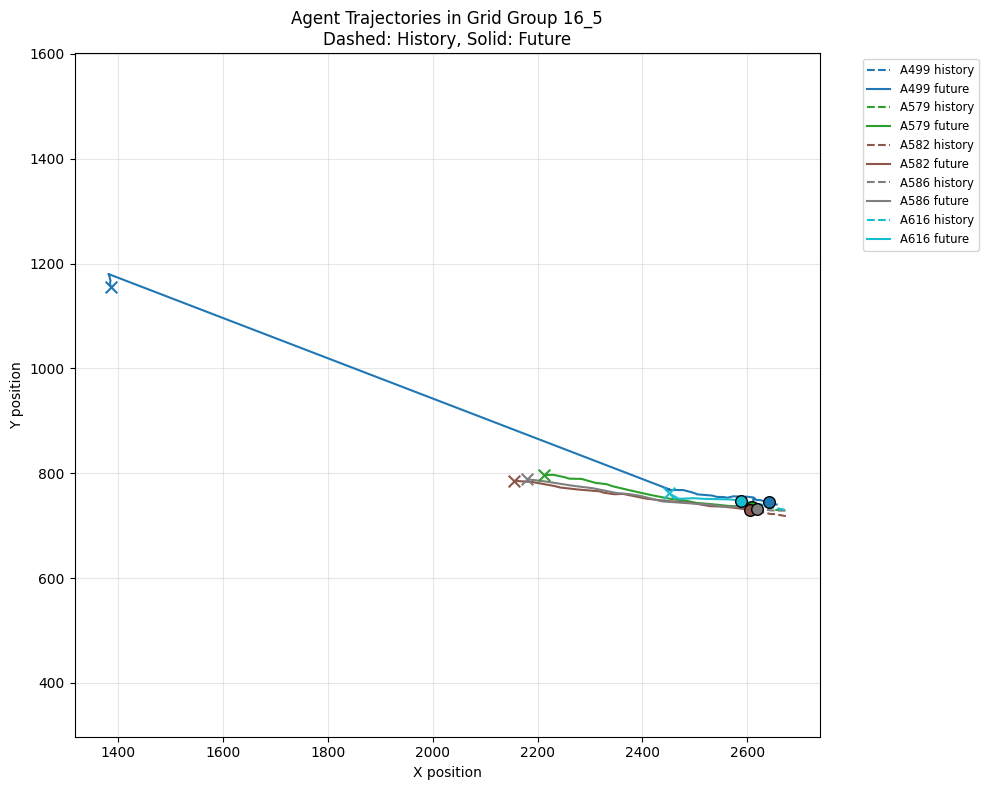

Agent 578: len(history)=4, len(future)=1
Agent 629: len(history)=8, len(future)=6
Agent 630: len(history)=8, len(future)=5
Agent 631: len(history)=8, len(future)=3
Agent 644: len(history)=3, len(future)=1
Agent 675: len(history)=8, len(future)=192
Agent 728: len(history)=8, len(future)=2
Agent 729: len(history)=2, len(future)=1


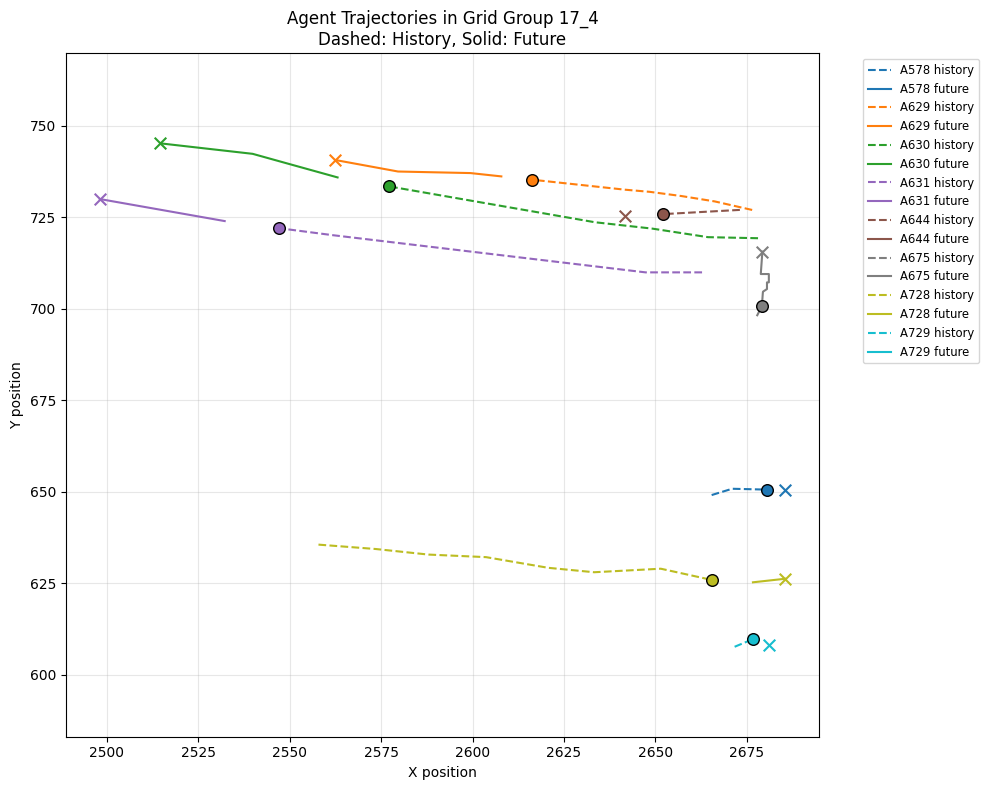

Agent 635: len(history)=8, len(future)=7


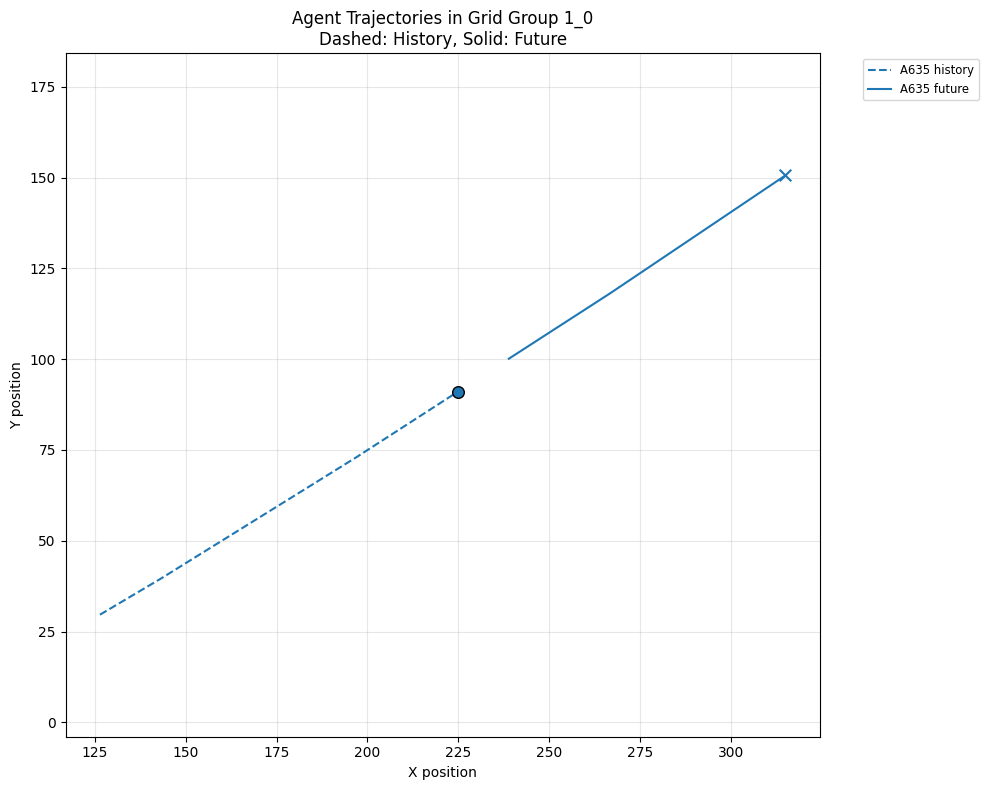

Agent 58: len(history)=8, len(future)=457
Agent 511: len(history)=8, len(future)=128
Agent 589: len(history)=8, len(future)=47
Agent 765: len(history)=8, len(future)=58
Agent 1380: len(history)=8, len(future)=151
Agent 1381: len(history)=8, len(future)=151


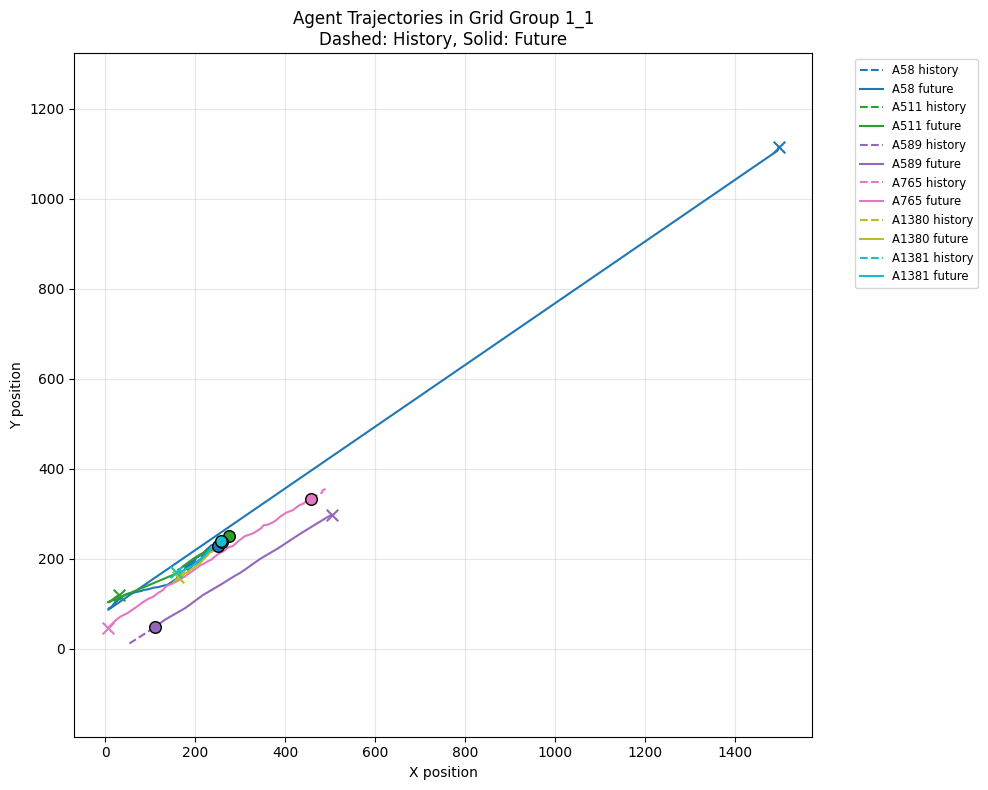

Agent 409: len(history)=8, len(future)=237


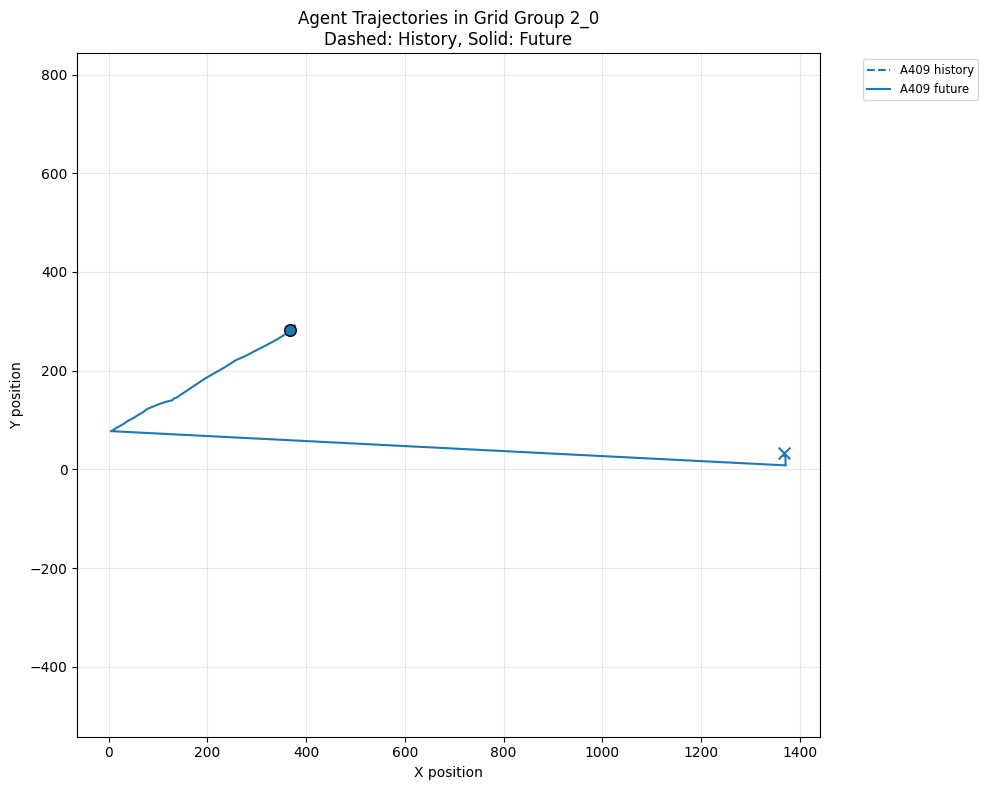

Agent 185: len(history)=8, len(future)=462
Agent 565: len(history)=8, len(future)=64
Agent 610: len(history)=8, len(future)=36
Agent 613: len(history)=8, len(future)=27
Agent 764: len(history)=8, len(future)=62
Agent 766: len(history)=8, len(future)=192
Agent 1304: len(history)=8, len(future)=688
Agent 1377: len(history)=8, len(future)=74
Agent 1397: len(history)=8, len(future)=69


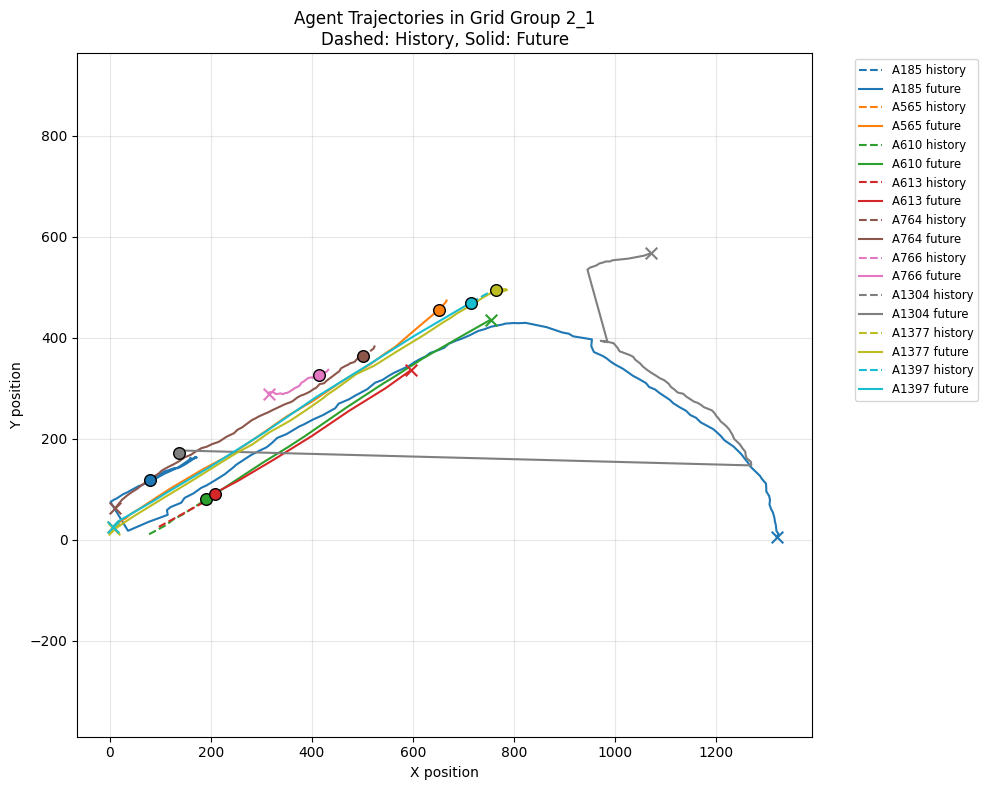

Agent 132: len(history)=8, len(future)=604
Agent 544: len(history)=8, len(future)=90
Agent 767: len(history)=8, len(future)=192
Agent 768: len(history)=8, len(future)=192
Agent 1148: len(history)=8, len(future)=370


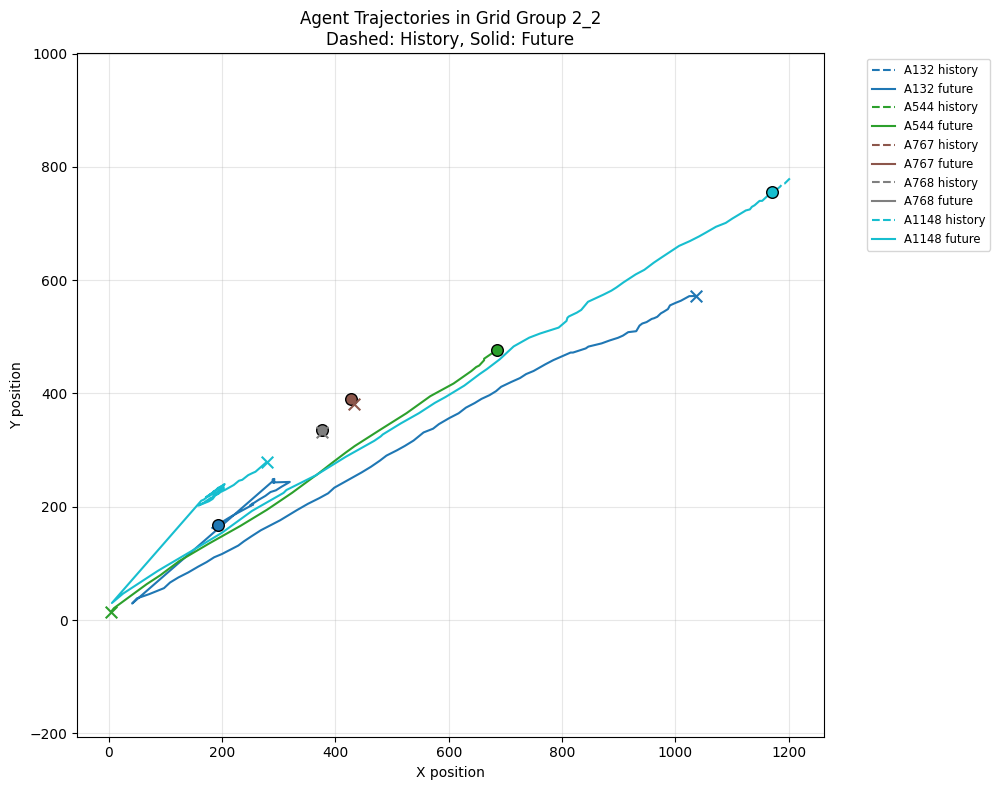

Agent 184: len(history)=8, len(future)=421
Agent 186: len(history)=8, len(future)=509


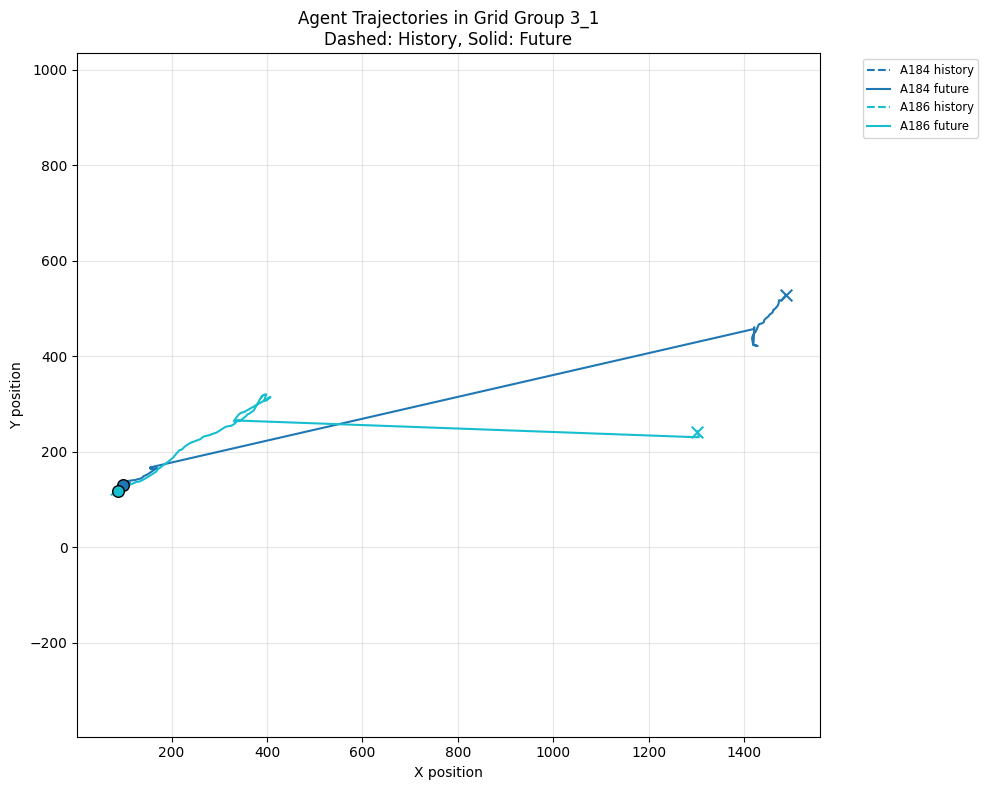

Agent 15: len(history)=8, len(future)=318
Agent 35: len(history)=8, len(future)=392
Agent 59: len(history)=8, len(future)=564
Agent 226: len(history)=8, len(future)=445
Agent 355: len(history)=8, len(future)=142
Agent 545: len(history)=8, len(future)=112
Agent 546: len(history)=8, len(future)=87
Agent 547: len(history)=8, len(future)=110
Agent 760: len(history)=8, len(future)=97
Agent 763: len(history)=8, len(future)=192
Agent 1138: len(history)=8, len(future)=420
Agent 1141: len(history)=8, len(future)=251
Agent 1147: len(history)=8, len(future)=407
Agent 1203: len(history)=8, len(future)=602


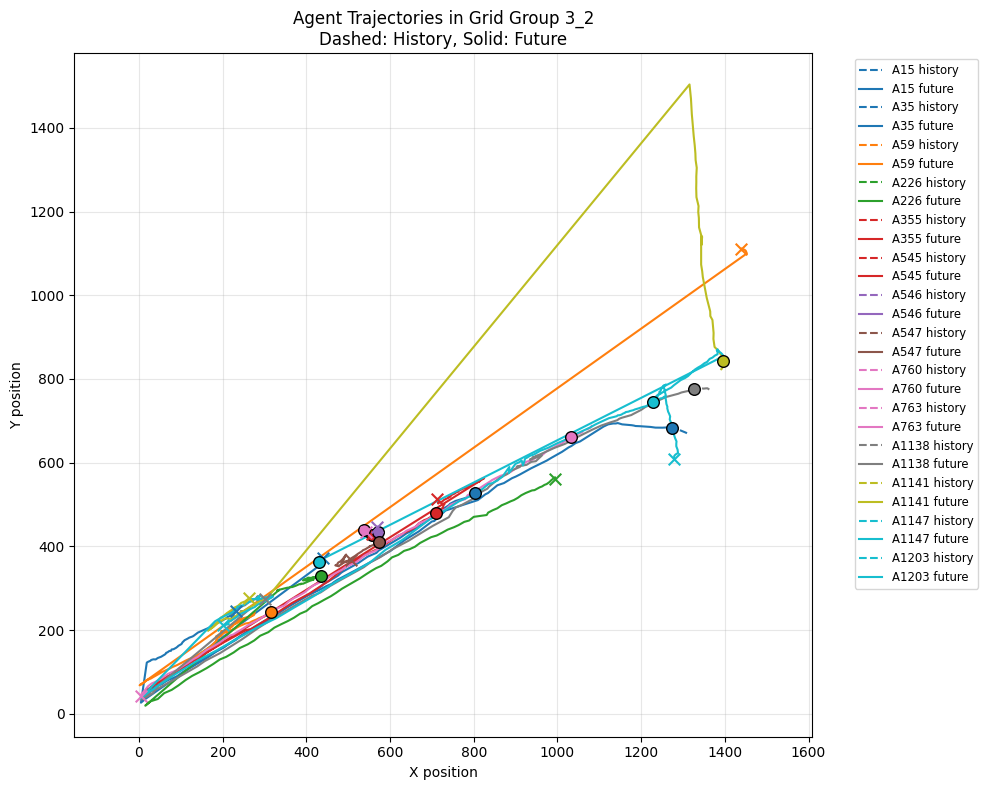

Agent 187: len(history)=8, len(future)=508
Agent 977: len(history)=8, len(future)=522
Agent 982: len(history)=8, len(future)=692


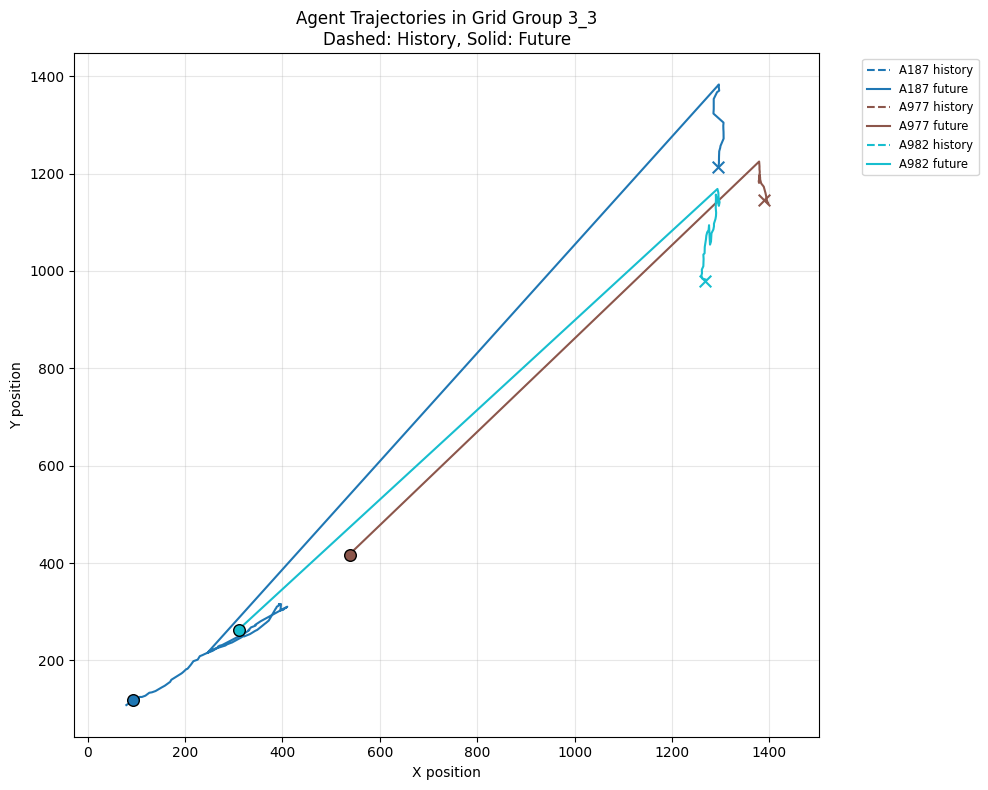

Agent 410: len(history)=8, len(future)=119


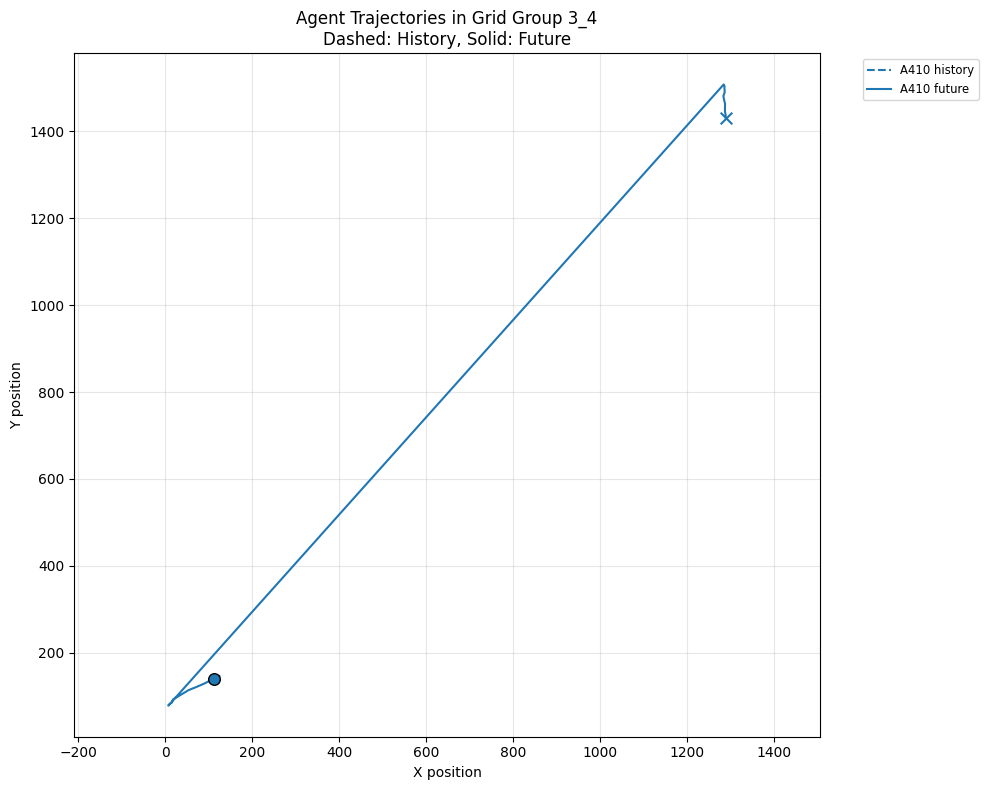

Agent 116: len(history)=8, len(future)=125
Agent 165: len(history)=8, len(future)=541
Agent 1177: len(history)=8, len(future)=137


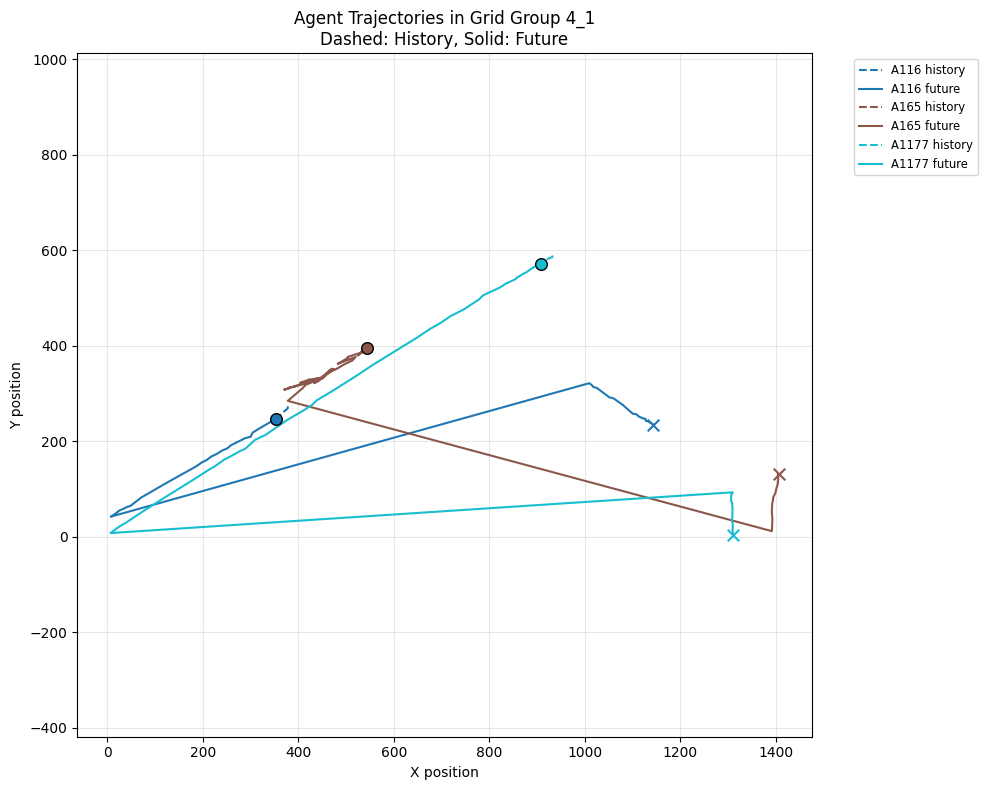

Agent 43: len(history)=8, len(future)=338
Agent 164: len(history)=8, len(future)=282
Agent 188: len(history)=8, len(future)=248
Agent 232: len(history)=8, len(future)=544
Agent 543: len(history)=8, len(future)=83
Agent 577: len(history)=8, len(future)=69
Agent 1139: len(history)=8, len(future)=401
Agent 1144: len(history)=8, len(future)=329
Agent 1145: len(history)=8, len(future)=282
Agent 1176: len(history)=8, len(future)=162
Agent 1202: len(history)=8, len(future)=692
Agent 1206: len(history)=8, len(future)=441
Agent 1319: len(history)=8, len(future)=692
Agent 1320: len(history)=8, len(future)=692
Agent 1361: len(history)=8, len(future)=130


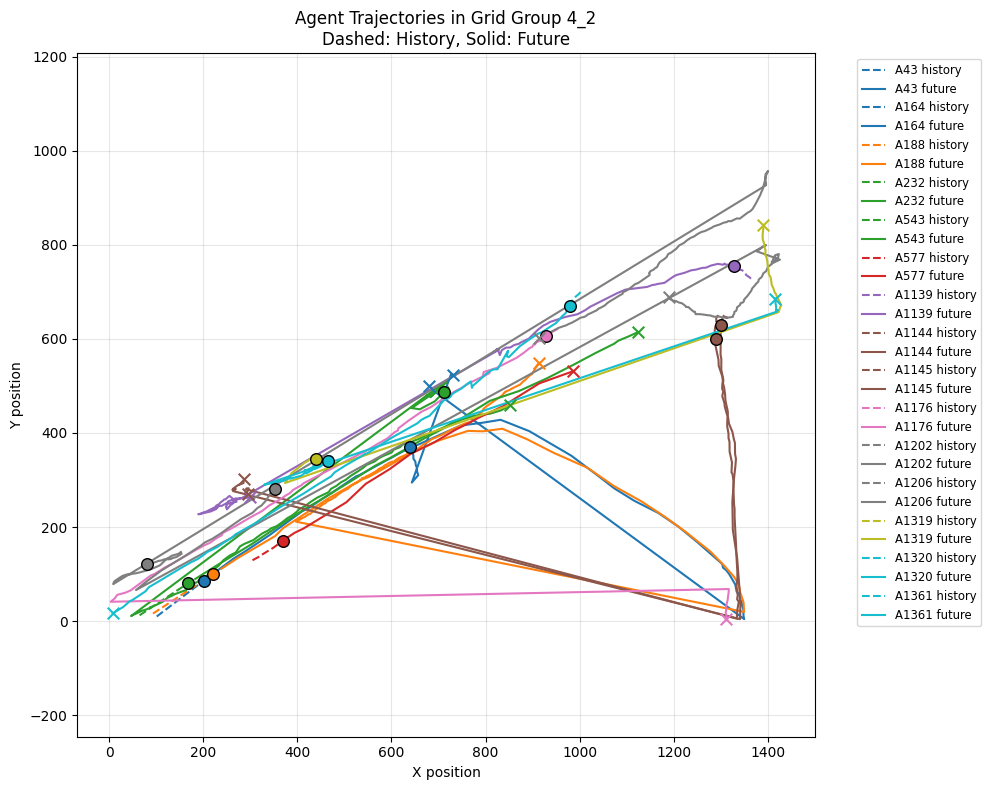

Agent 20: len(history)=8, len(future)=291
Agent 67: len(history)=8, len(future)=443
Agent 159: len(history)=8, len(future)=207
Agent 231: len(history)=8, len(future)=544
Agent 299: len(history)=8, len(future)=274
Agent 453: len(history)=8, len(future)=380
Agent 502: len(history)=8, len(future)=138
Agent 762: len(history)=8, len(future)=192
Agent 1132: len(history)=8, len(future)=281
Agent 1137: len(history)=8, len(future)=288
Agent 1140: len(history)=8, len(future)=289
Agent 1153: len(history)=8, len(future)=692
Agent 1157: len(history)=8, len(future)=658
Agent 1205: len(history)=8, len(future)=260
Agent 1335: len(history)=8, len(future)=672
Agent 1384: len(history)=8, len(future)=492
Agent 1385: len(history)=8, len(future)=489
Agent 1404: len(history)=8, len(future)=492


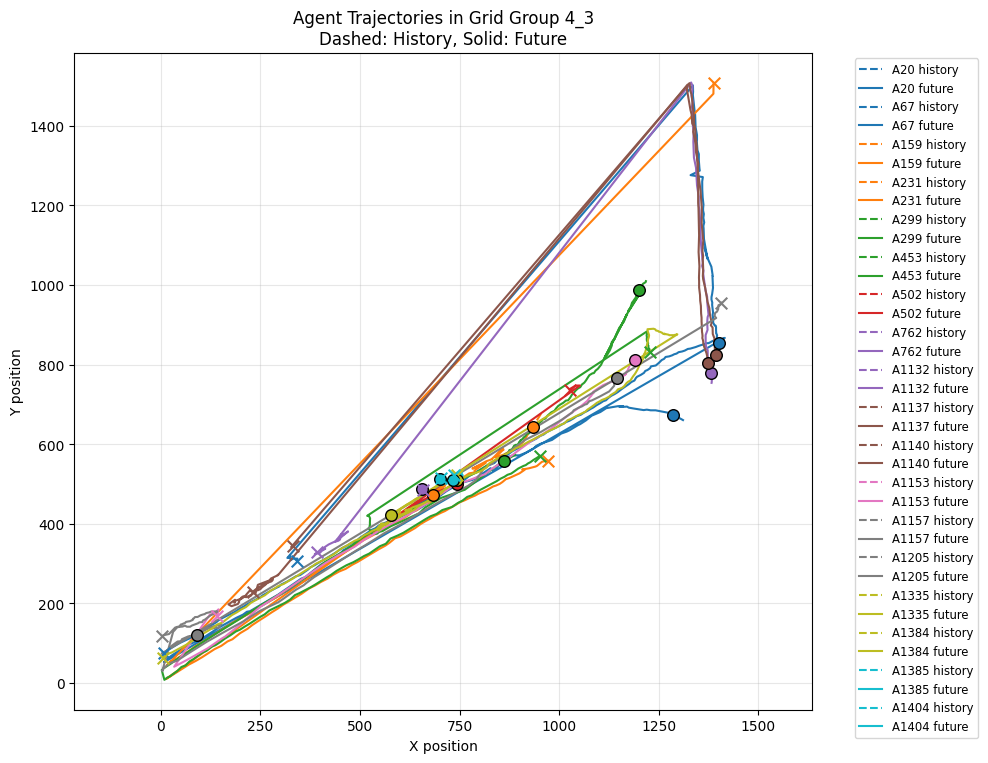

Agent 1135: len(history)=8, len(future)=291
Agent 1142: len(history)=8, len(future)=180


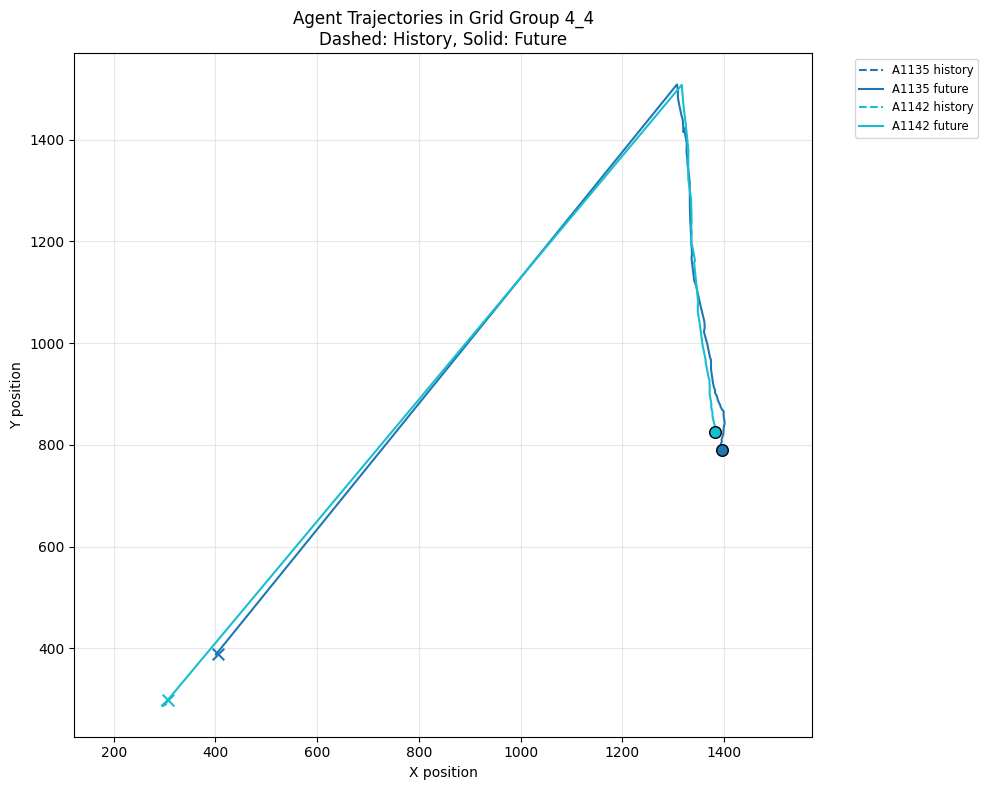

Agent 134: len(history)=8, len(future)=256


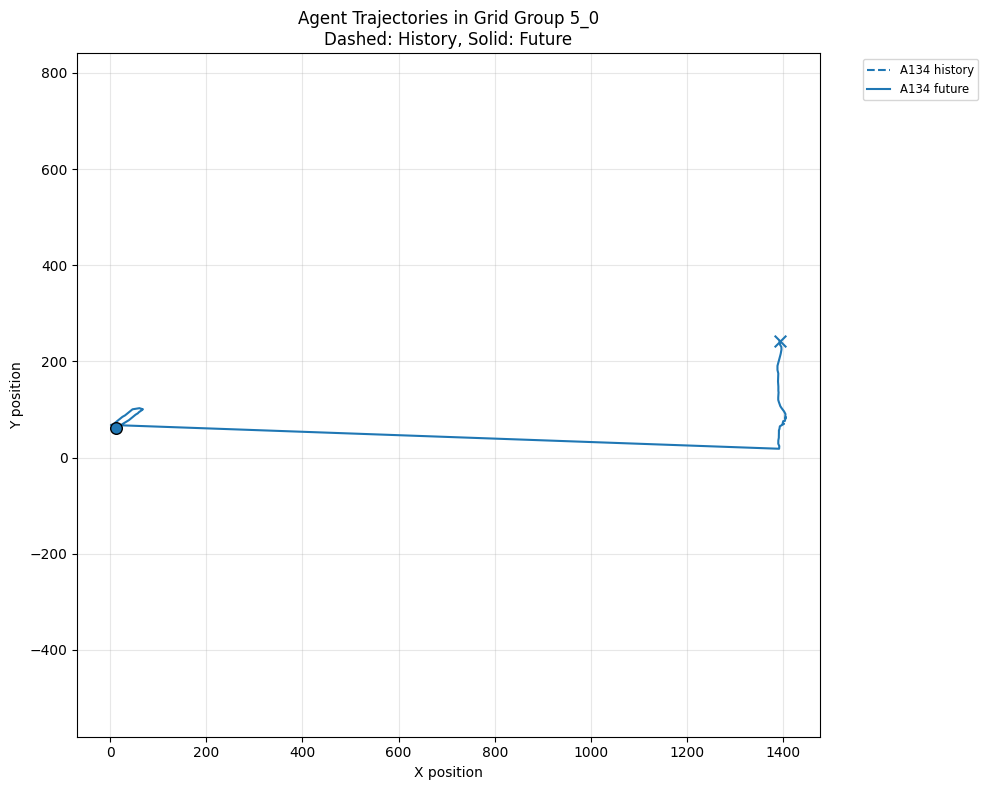

Agent 16: len(history)=8, len(future)=130
Agent 117: len(history)=8, len(future)=179
Agent 135: len(history)=8, len(future)=292
Agent 287: len(history)=8, len(future)=138


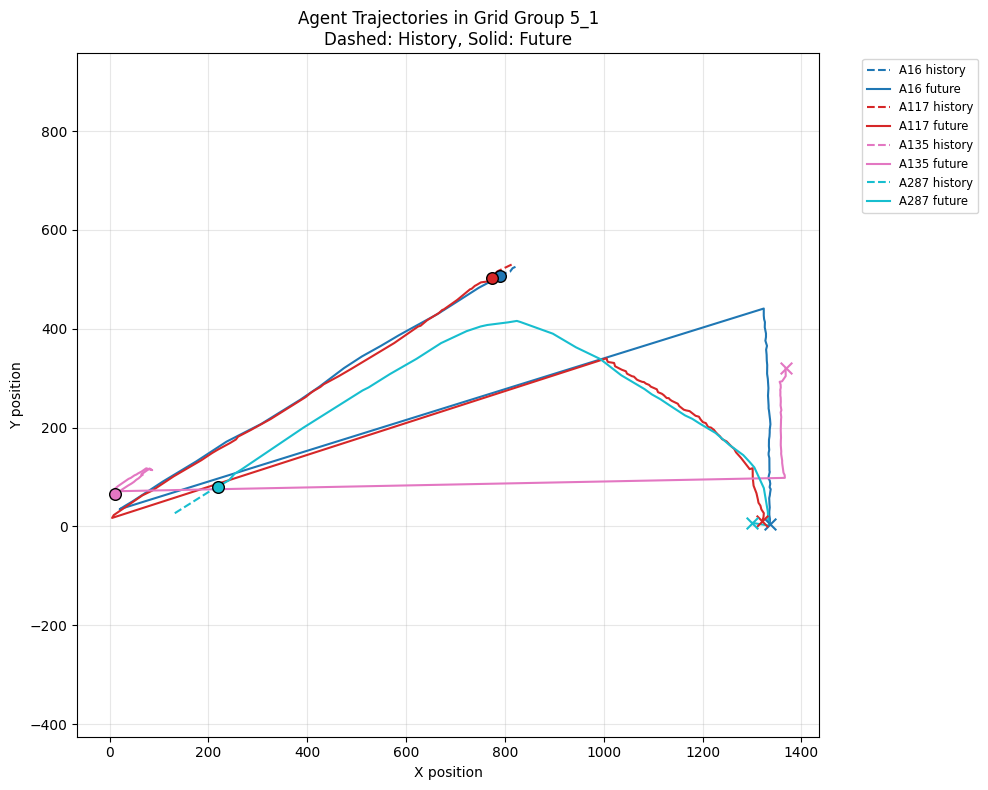

Agent 133: len(history)=8, len(future)=585
Agent 350: len(history)=8, len(future)=152
Agent 487: len(history)=8, len(future)=133
Agent 560: len(history)=8, len(future)=80
Agent 770: len(history)=8, len(future)=192
Agent 1174: len(history)=8, len(future)=316
Agent 1185: len(history)=8, len(future)=542
Agent 1201: len(history)=8, len(future)=284
Agent 1305: len(history)=8, len(future)=42
Agent 1321: len(history)=8, len(future)=650


KeyboardInterrupt: 

In [ ]:


# Load your CSV as before
file_path = '/content/combined_annotations.csv'
df = pd.read_csv(file_path, names=['frame', 'agent', 'x', 'y'], header=0)
df = df[(df['x'] != 0) & (df['y'] != 0)]

# Compute each agent's mean position
agent_means = df.groupby('agent')[['x', 'y']].mean().reset_index()

x_bin_size = 150
y_bin_size = 150

# Assign grid bins
agent_means['x_bin'] = (agent_means['x'] // x_bin_size).astype(int)
agent_means['y_bin'] = (agent_means['y'] // y_bin_size).astype(int)
agent_means['grid_group'] = agent_means['x_bin'].astype(str) + "_" + agent_means['y_bin'].astype(str)
agent_to_group = dict(zip(agent_means['agent'], agent_means['grid_group']))
df['grid_group'] = df['agent'].map(agent_to_group)
unique_groups = df['grid_group'].dropna().unique()

# Plot each grid group separately
for idx, group in enumerate(sorted(unique_groups)):
    group_agents = agent_means[agent_means['grid_group'] == group]['agent'].values
    n_agents = len(group_agents)
    agent_cmap = cm.get_cmap('tab10', n_agents)  # Use a qualitative colormap

    plt.figure(figsize=(10, 8))
    for i, agent_id in enumerate(group_agents):
        # Get that agent's full trajectory sorted by frame
        agent_df = df[df['agent'] == agent_id].sort_values('frame')
        frames = agent_df['frame'].values.astype(int)
        x = agent_df['x'].values
        y = agent_df['y'].values

        # Define cut: first 5 points = history (example), next = future
        # Or use your own history/future logic if you have defined windowing
        hist_n = min(8, len(x)-1)
        x_hist, y_hist = x[:hist_n], y[:hist_n]
        x_future, y_future = x[hist_n:], y[hist_n:] #future has no bounds, go from hist_n to hist_n+future_len
        print(f"Agent {agent_id}: len(history)={len(x_hist)}, len(future)={len(x_future)}")

        # Plot history (dashed), future (solid), each agent with unique color
        base_color = agent_cmap(i)
        if len(x_hist) > 1:
            plt.plot(x_hist, y_hist, '--', color=base_color, label=f'A{agent_id} history')

        plt.plot(x_future, y_future, '-', color=base_color, label=f'A{agent_id} future')
        # Mark ends
        if len(x_hist) > 0:
            plt.scatter(x_hist[-1], y_hist[-1], color=base_color, marker='o', edgecolor='k', s=70, zorder=5)
        if len(x_future) > 0:
            plt.scatter(x_future[-1], y_future[-1], color=base_color, marker='x', edgecolor='k', s=70, zorder=5)

    plt.xlabel('X position')
    plt.ylabel('Y position')
    plt.title(f'Agent Trajectories in Grid Group {group}\nDashed: History, Solid: Future')
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.show()

In [ ]:
def compute_dataset_average_speed(file_path):
    """
    Compute average speed for an entire dataset file: frame, agent, x, y
    """
    import numpy as np

    agent_positions = {}
    with open(file_path, 'r') as f:
        for line in f:
            frame, agent, x, y = line.strip().split(',')
            frame, agent = int(frame), int(agent)
            x, y = float(x), float(y)
            agent_positions.setdefault(agent, []).append((frame, x, y))

    speeds = []
    for traj in agent_positions.values():
        traj.sort(key=lambda p: p[0])  # sort by frame
        for i in range(1, len(traj)):
            _, x1, y1 = traj[i-1]
            _, x2, y2 = traj[i]
            dist = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
            speeds.append(dist)

    return float(np.mean(speeds)) if speeds else 0.0


In [ ]:

def compute_average_speed_from_file_ZARA(file_path, delimiter=None):
    """
    Compute average speed across all agents from trajectory data in file.

    Args:
        file_path (str): Path to the file containing data: frame agent x y
        delimiter (str or None): delimiter for np.loadtxt (default None detects spaces).
                                Use "," if your file is comma separated.

    Returns:
        float: average speed (units per frame step)
    """
    # Load dataset: shape (N,4) --> frame, agent, x, y
    data = np.loadtxt(file_path, delimiter=delimiter)

    # Sort by agent then by frame to ensure proper ordering
    data = data[np.lexsort((data[:,0], data[:,1]))]

    total_distance = 0.0
    total_transitions = 0

    # Process each agent separately
    for agent_id in np.unique(data[:,1]):
        agent_data = data[data[:,1] == agent_id]

        # Filter out zero positions (padded)
        mask = ~((agent_data[:,2] == 0) & (agent_data[:,3] == 0))
        agent_data = agent_data[mask]

        if len(agent_data) < 2:
            continue

        frames = agent_data[:,0]
        positions = agent_data[:, 2:4]

        # Calculate Euclidean distances between consecutive positions
        displacements = positions[1:] - positions[:-1]
        distances = np.linalg.norm(displacements, axis=1)

        # Calculate time differences (frame differences)
        delta_times = frames[1:] - frames[:-1]

        # Ignore zero or negative time intervals (avoid division issues)
        valid_mask = delta_times > 0

        total_distance += distances[valid_mask].sum()
        total_transitions += delta_times[valid_mask].sum()  # total time elapsed

    if total_transitions > 0:
        avg_speed = total_distance / total_transitions
    else:
        avg_speed = 0.0

    return avg_speed

file_path = "/content/crowds_zara02_test.txt"
average_speed = compute_average_speed_from_file_ZARA(file_path)
print(f"Average speed: {average_speed:.4f} units per frame")

Average speed: 0.0278 units per frame


In [ ]:
def calculate_speed(trajectory):
    """Calculate average speed from trajectory tensor [B, A, T, 2]"""
    diffs = trajectory[:, :, 1:, :] - trajectory[:, :, :-1, :]  # Frame-to-frame differences
    speeds = torch.norm(diffs, dim=-1)  # [B, A, T-1]
    valid_mask = speeds > 0
    if valid_mask.sum() > 0:
        avg_speed = speeds[valid_mask].mean()
    else:
        avg_speed = torch.tensor(0.0)
    return avg_speed

def check_speed_violations(predictions, history, min_speed, max_speed):
    """Count speed violations in predicted trajectories"""
    # Get last history position
    last_pos = history[:, :, -1:, :]  # [B, A, 1, 2]

    # Combine last history with predictions for speed calculation
    full_traj = torch.cat([last_pos, predictions], dim=2)  # [B, A, T+1, 2]

    # Calculate speeds
    diffs = full_traj[:, :, 1:, :] - full_traj[:, :, :-1, :]
    speeds = torch.norm(diffs, dim=-1)  # [B, A, T]

    # Count violations
    violations = ((speeds < min_speed) | (speeds > max_speed)).sum().item()
    return violations

## MTA_PFM model

In [ ]:


class PotentialField(nn.Module):
    def __init__(self, goal, num_agents=1000, k_init=1.0, repulsion_radius=0.5):
        super().__init__()
        self.register_buffer('goal', torch.tensor(goal, dtype=torch.float32))
        self.repulsion_radius = repulsion_radius
        self.coeff_embedding = nn.Embedding(num_agents, 3)
        self.coeff_embedding.weight.data.fill_(k_init)

    def forward(self, pos, predicted, neighbors, goal, coeffs):
        k_att1 = coeffs[..., 0:1]
        k_att2 = coeffs[..., 1:2]
        k_rep = coeffs[..., 2:3]

        F_goal = k_att1 * (goal - pos)
        F_pred = k_att2 * (predicted[:, :, 0, :] - pos)

        diffs = pos.unsqueeze(2) - neighbors
        dists = torch.norm(diffs, dim=-1, keepdim=True) + 1e-6
        mask = (dists < self.repulsion_radius).float()

        F_rep = (k_rep.unsqueeze(2) * diffs / dists.pow(2) * mask).sum(dim=2)

        total_force = F_goal + F_pred + F_rep

        return total_force, coeffs


class CheckpointedIntegratedMTAPFMModel(nn.Module):
    def __init__(self, input_size=2, hidden_size=64, num_layers=2,
                 goal=(4.2,4.2), target_avg_speed=0.027,
                 speed_tolerance=0.15, num_agents=1000):
        super().__init__()
        self.num_layers = num_layers
        self.hidden_size = hidden_size

        self.input_embed = nn.Linear(input_size, hidden_size)
        self.encoder = nn.LSTM(hidden_size, hidden_size, num_layers, batch_first=True)
        self.decoder = nn.LSTM(hidden_size, hidden_size, num_layers, batch_first=True)

        # If postprocess is unnecessary, replace with identity
        # self.postprocess = nn.Identity()
        self.postprocess = nn.Linear(input_size, input_size)


        self.output = nn.Linear(hidden_size, input_size)
        self.pfm = PotentialField(goal=goal, num_agents=num_agents)

        if target_avg_speed is None:
            raise ValueError("target_avg_speed must be computed from dataset and passed here.")

        self.target_avg_speed = target_avg_speed
        self.speed_tolerance = speed_tolerance
        self.min_speed = self.target_avg_speed * (1 - self.speed_tolerance)
        self.max_speed = self.target_avg_speed * (1 + self.speed_tolerance)

    def apply_speed_constraints(self, predictions, last_positions):
        B, A, T, D = predictions.shape
        constrained_preds = predictions.clone()
        current_pos = last_positions.clone()
        for t in range(T):
            displacement = predictions[:, :, t] - current_pos
            speeds = torch.norm(displacement, dim=-1, keepdim=True)
            non_zero_mask = speeds > 0
            clipped_speeds = torch.clamp(speeds, self.min_speed, self.max_speed)
            final_speeds = torch.where(non_zero_mask, clipped_speeds, speeds)
            direction = displacement / (speeds + 1e-8)
            clipped_displacement = direction * final_speeds
            constrained_preds[:, :, t] = current_pos + clipped_displacement
            current_pos = constrained_preds[:, :, t].clone()
        return constrained_preds

    def forward_encoder(self, x):
        return self.encoder(x)

    def forward_decoder_step(self, input_step, hx):
        return self.decoder(input_step, hx)

    def forward(self, history, neighbors, goal):
        B, A, H, D = history.shape
        device = history.device
        agent_ids = torch.arange(A).repeat(B, 1).to(device)

        hist_flat = history.reshape(B * A, H, D)
        hist_embedded = self.input_embed(hist_flat)

        # Gradient checkpoint on encoder
        _, (h_n, c_n) = checkpoint.checkpoint(self.forward_encoder, hist_embedded)

        pred_flat = torch.zeros(B * A, 12, D, device=device)

        h_n = h_n[-1].unsqueeze(0).repeat(self.num_layers, 1, 1)
        c_n = c_n[-1].unsqueeze(0).repeat(self.num_layers, 1, 1)
        hx = (h_n, c_n)

        for t in range(12):
            current_pred = pred_flat[:, t:t+1].clone()
            pred_embedded = self.input_embed(current_pred)
            out, hx = checkpoint.checkpoint(self.forward_decoder_step, pred_embedded, hx)
            step_output = self.output(out.squeeze(1))
            pred_flat[:, t] = self.postprocess(step_output)

        predictions = pred_flat.view(B, A, 12, D)
        adjusted_preds = torch.zeros_like(predictions)
        current_pos = history[:, :, -1, :].clone()
        coeff_list = []

        coeffs = self.pfm.coeff_embedding(agent_ids)

        for t in range(12):
            pred_slice = predictions[:, :, t:t+1].clone()
            forces, coeff_step = self.pfm(current_pos, pred_slice, neighbors.clone(), goal, coeffs)
            if t == 0:
                adjusted_preds[:, :, t] = current_pos + forces
            else:
                adjusted_preds[:, :, t] = adjusted_preds[:, :, t-1] + forces
            coeff_list.append(coeff_step)
            current_pos = adjusted_preds[:, :, t].clone()

        last_known_pos = history[:, :, -1, :]
        constrained_preds = self.apply_speed_constraints(adjusted_preds, last_known_pos)

        coeff_stack = torch.stack(coeff_list, dim=0)
        coeff_mean = coeff_stack.mean()
        coeff_var = coeff_stack.var(unbiased=False)

        return constrained_preds, coeff_mean, coeff_var

In [ ]:
# Define test dimensions
batch_size = 32
num_agents = 1000
history_len = 8
num_neighbors = 10
goal_dim = 2

# Initialize the model
model = CheckpointedIntegratedMTAPFMModel(input_size=2, hidden_size=64)

# Generate random input tensors
test_input = torch.rand(batch_size, num_agents, history_len, goal_dim)      # [B, A, H, 2]
test_neighbors = torch.rand(batch_size, num_agents, num_neighbors, goal_dim)  # [B, A, N, 2]

# Generate random goals for each agent
test_goal = torch.rand(batch_size, num_agents, goal_dim)  # [B, A, 2]

# Forward pass
output, coeff_mean, coeff_var = model(test_input, test_neighbors, test_goal)

# Output result shapes
print("Output shape:", output.shape)        # Expected: [32, 5, 12, 2]
print("Coeff mean:", coeff_mean.item())
print("Coeff var:", coeff_var.item())

/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:929: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)


Output shape: torch.Size([32, 1000, 12, 2])
Coeff mean: 1.0
Coeff var: 0.0


## MTA_only

In [ ]:

class DeepLSTMModel(nn.Module):
    def __init__(self, input_size=2, hidden_size=64, num_layers=2, dt=0.1,
                 target_avg_speed=4.087, speed_tolerance=0.15):
        super().__init__()
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        self.dt = dt

        self.input_embed = nn.Linear(input_size, hidden_size)
        self.encoder = nn.LSTM(hidden_size, hidden_size, num_layers, batch_first=True)
        self.decoder = nn.LSTM(hidden_size, hidden_size, num_layers, batch_first=True)
        self.output = nn.Linear(hidden_size, input_size)
        self.postprocess = nn.Linear(input_size, input_size)  # Added postprocess layer

        self.speed_tolerance = speed_tolerance
        self.target_avg_speed = target_avg_speed
        self.min_speed = target_avg_speed * (1 - speed_tolerance)
        self.max_speed = target_avg_speed * (1 + speed_tolerance)

    def apply_speed_constraints(self, preds, last_pos):
        B, A, T, D = preds.shape
        constrained_preds = preds.clone()
        current_pos = last_pos.clone()
        for t in range(T):
            displacement = constrained_preds[:, :, t] - current_pos
            speeds = torch.norm(displacement, dim=-1, keepdim=True)
            non_zero_mask = speeds > 0
            clipped_speeds = torch.clamp(speeds, self.min_speed, self.max_speed)
            final_speeds = torch.where(non_zero_mask, clipped_speeds, speeds)
            direction = displacement / (speeds + 1e-8)
            constrained_preds[:, :, t] = current_pos + direction * final_speeds
            current_pos = constrained_preds[:, :, t].clone()
        return constrained_preds

    def forward_encoder(self, x):
        return self.encoder(x)

    def forward_decoder_step(self, input_step, hx):
        return self.decoder(input_step, hx)

    def forward(self, history, neighbors=None, goal=None):
        # neighbors and goal not used here, kept for signature compatibility
        B, A, H, D = history.shape
        device = history.device

        hist_flat = history.reshape(B * A, H, D)
        hist_embedded = self.input_embed(hist_flat)

        # Encoder with gradient checkpointing
        _, (h_n, c_n) = checkpoint.checkpoint(self.forward_encoder, hist_embedded)

        pred_flat = torch.zeros(B * A, 12, D, device=device)

        # Prepare initial hidden/cell states for decoder by repeating last encoder layer's h/c
        h_n = h_n[-1].unsqueeze(0).repeat(self.num_layers, 1, 1)
        c_n = c_n[-1].unsqueeze(0).repeat(self.num_layers, 1, 1)
        hx = (h_n, c_n)

        for t in range(12):
            current_pred = pred_flat[:, t:t + 1].clone()
            pred_embedded = self.input_embed(current_pred)
            out, hx = checkpoint.checkpoint(self.forward_decoder_step, pred_embedded, hx)
            step_output = self.output(out.squeeze(1))

            step_output = self.postprocess(step_output)  # Postprocess here

            pred_flat[:, t] = step_output

        predictions = pred_flat.view(B, A, 12, D)
        last_known_pos = history[:, :, -1, :]
        constrained_preds = self.apply_speed_constraints(predictions, last_known_pos)

        return constrained_preds, None, None  # No coeff mean/var anymore

In [ ]:
dataset_path = "/content/combined_annotations.csv"
avg_speed = compute_dataset_average_speed(dataset_path)
print(f"Computed dataset average speed: {avg_speed:.4f}")

Computed dataset average speed: 4.0887


In [ ]:


def convert_and_clean_txt_for_pfm(txt_file, output_txt_file):
    # Load with space (or tab) separator
    df = pd.read_csv(txt_file, sep="\s+", header=None, names=['frame', 'agent_id', 'x', 'y'])

    df.replace("?", np.nan, inplace=True)
    df['x'] = pd.to_numeric(df['x'], errors='coerce')
    df['y'] = pd.to_numeric(df['y'], errors='coerce')

    # Sort for proper interpolation
    df.sort_values(by=['agent_id', 'frame'], inplace=True)

    # Interpolate missing x, y values per agent_id (limit_direction='both' is more robust)
    df[['x', 'y']] = df.groupby('agent_id')[['x', 'y']].transform(lambda group: group.interpolate(method='linear', limit_direction='both'))

    # After interpolation, drop any remaining NaN rows (e.g., at start/end)
    df.dropna(inplace=True)

    df['frame'] = df['frame'].astype(int)
    df['agent_id'] = df['agent_id'].astype(int)

    # Save without header, comma-separated to match downstream expectations
    df.to_csv(output_txt_file, index=False, header=False)
    print(f"✅ Cleaned and saved formatted txt for PFM dataset: {output_txt_file}")

# Usage example:
convert_and_clean_txt_for_pfm('/content/crowds_zara02_test.txt', '/content/crowds_zara02_test_cleaned.txt')

<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-2559586607.py:3: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv(txt_file, sep="\s+", header=None, names=['frame', 'agent_id', 'x', 'y'])


✅ Cleaned and saved formatted txt for PFM dataset: /content/crowds_zara02_test_cleaned.txt


In [ ]:
dataset_path = "/content/crowds_zara02_test.txt"
avg_speed = compute_average_speed_from_file_ZARA(dataset_path)
print(f"Computed dataset average speed: {avg_speed:.4f}")

NameError: name 'compute_average_speed_from_file_ZARA' is not defined

In [ ]:
# Select GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = CheckpointedIntegratedMTAPFMModel(
    input_size=2,
    hidden_size=64,
    num_layers=2,
    goal=(4.2, 4.2),
    target_avg_speed=0.027,
    speed_tolerance=0.15
).to(device)

In [ ]:
avg_speed = compute_dataset_average_speed("/content/combined_annotations.csv")

## training data own

In [ ]:


def train_pfm_model(
    data_path,
    model_save_path,
    model_class,
    dataset_class,
    collate_fn,
    batch_size=32,
    epochs=1,
    learning_rate=0.001,
    weight_decay=0.0,
    device=None
):
    """
    Train a PFM trajectory prediction model with speed constraints.

    Args:
        data_path (str): Path to dataset file.
        model_save_path (str): Where to save the trained model.
        model_class (class): Model class to instantiate (e.g., IntegratedMTAPFMModel).
        dataset_class (class): Dataset loader class (e.g., PFM_TrajectoryDataset).
        collate_fn (function): Collate function for DataLoader.
        batch_size (int): Batch size for DataLoader.
        epochs (int): Number of training epochs.
        learning_rate (float): Learning rate for optimizer.
        weight_decay (float): Weight decay for optimizer.
        device (torch.device): Device to train on. If None, auto-select CUDA if available.
    """
    device = device or torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    torch.autograd.set_detect_anomaly(True)

    # === DATA LOADING ===
    dataset = dataset_class(data_path)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

    # === MODEL / OPTIMIZER / LOSS ===
    model = model_class().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    print(f"\n🎯 Speed Constraints Enabled:")
    print(f"   Target Avg Speed: {model.target_avg_speed:.4f}")
    print(f"   Allowed range: [{model.min_speed:.4f}, {model.max_speed:.4f}]")
    print(f"   Tolerance: ±{model.speed_tolerance * 100:.1f}%\n")

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0
        epoch_gt_speeds, epoch_pred_speeds, epoch_hist_speeds, epoch_violations = [], [], [], []

        for batch_idx, (history, future, neighbors, goal) in enumerate(dataloader):
            history = history.to(device)
            future = future.to(device)
            neighbors = neighbors.to(device)
            goal = future[:, :, -1, :].clone()  # final target position

            optimizer.zero_grad()
            pred, coeff_mean, coeff_var = model(history, neighbors, goal)
            loss = criterion(pred, future)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            epoch_loss += loss.item()

            # === SPEED TRACKING ===
            with torch.no_grad():
                gt_speed = calculate_speed(future)
                pred_speed = calculate_speed(pred)
                hist_speed = calculate_speed(history)



                epoch_gt_speeds.append(gt_speed.item())
                epoch_pred_speeds.append(pred_speed.item())
                epoch_hist_speeds.append(hist_speed.item())

                violation_count = check_speed_violations(pred, history, model.min_speed, model.max_speed)
                epoch_violations.append(violation_count)

            if batch_idx % 50 == 0:
                print(f"[{batch_idx}] Loss: {loss:.4f} | k_att1 μ={coeff_mean:.2f}, σ²={coeff_var:.2f}")
                print(f"    Speeds - GT: {gt_speed:.3f}, Pred: {pred_speed:.3f}, Hist: {hist_speed:.3f}")
                print(f"    Speed Violations: {violation_count}")

        # === EPOCH SUMMARY ===
        avg_gt_speed = sum(epoch_gt_speeds) / len(epoch_gt_speeds)
        avg_pred_speed = sum(epoch_pred_speeds) / len(epoch_pred_speeds)
        avg_hist_speed = sum(epoch_hist_speeds) / len(epoch_hist_speeds)
        total_violations = sum(epoch_violations)

        print(f"\n=== EPOCH {epoch+1} SUMMARY ===")
        print(f"Avg Loss: {epoch_loss/len(dataloader):.4f}")
        print(f"Avg Speeds: Hist={avg_hist_speed:.4f}, GT={avg_gt_speed:.4f}, Pred={avg_pred_speed:.4f}")
        print(f"Speed Error: {abs(avg_gt_speed - avg_pred_speed):.4f}")
        print(f"Violations: {total_violations} | Constraint Compliance: {(1 - total_violations/(len(dataloader)*batch_size*5*12))*100:.2f}%")
        print("=" * 40)

        # === CLEAR CUDA CACHE AND COLLECT GARBAGE AFTER EACH EPOCH ===
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

    torch.autograd.set_detect_anomaly(False)

    # === SAVE MODEL ===
    print("\n💾 Saving model...")
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epochs,
        'loss': epoch_loss/len(dataloader),
        'speed_constraints': {
            'target_avg_speed': model.target_avg_speed,
            'min_speed': model.min_speed,
            'max_speed': model.max_speed,
            'tolerance': model.speed_tolerance
        },
        'final_avg_speeds': {
            'historical': avg_hist_speed,
            'ground_truth': avg_gt_speed,
            'predicted': avg_pred_speed
        }
    }, model_save_path)
    print(f"✅ Model saved at {model_save_path} with speed constraints!")


# if __name__ == "__main__":
#     train_pfm_model(
#         data_path="/content/combined_annotations.csv",
#         model_save_path="/content/mta_pfm_trajectory_model_own.pth",
#         model_class=CheckpointedIntegratedMTAPFMModel,
#         dataset_class=PFM_TrajectoryDataset,
#         collate_fn=collate_fn,
#         batch_size=8,
#         epochs=3
#     )

## Zara train

In [ ]:
train_pfm_model(
        data_path="/content/crowds_zara02_test_cleaned.txt",
        model_save_path="/content/mta_pfm_trajectory_model_zara.pth",
        model_class=CheckpointedIntegratedMTAPFMModel,
        dataset_class=PFM_TrajectoryDataset,
        collate_fn=collate_fn,
        batch_size=8,
        epochs=5
    )


🎯 Speed Constraints Enabled:
   Target Avg Speed: 0.0270
   Allowed range: [0.0229, 0.0310]
   Tolerance: ±15.0%



/tmp/ipython-input-2431836939.py:124: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at /pytorch/aten/src/ATen/native/ReduceOps.cpp:1839.)
  coeff_var = coeff_stack.var(unbiased=False)


[0] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0
[50] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0
[100] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0

=== EPOCH 1 SUMMARY ===
Avg Loss: nan
Avg Speeds: Hist=0.0000, GT=0.0000, Pred=0.0000
Speed Error: 0.0000
Violations: 0 | Constraint Compliance: 100.00%
[0] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0
[50] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0
[100] Loss: nan | k_att1 μ=nan, σ²=nan
    Speeds - GT: 0.000, Pred: 0.000, Hist: 0.000
    Speed Violations: 0

=== EPOCH 2 SUMMARY ===
Avg Loss: nan
Avg Speeds: Hist=0.0000, GT=0.0000, Pred=0.0000
Speed Error: 0.0000
Violations: 0 | Constraint Compliance: 100.00%
[0] Loss: nan | k_att1 μ=n

## Debugging

In [ ]:
data_path = '/content/crowds_zara02_test_cleaned.txt'
dataset = PFM_TrajectoryDataset(data_path, history_len=4, prediction_len=6)
print("Number of samples:", len(dataset))

Number of samples: 0


In [ ]:
import pandas as pd
df = pd.read_csv("/content/crowds_zara02_test_cleaned.txt", sep=" ", names=['frame','agent','x','y'])
agent_counts = df.groupby("frame")["agent"].nunique()
print(agent_counts.value_counts())

Series([], Name: count, dtype: int64)


## Visualisation

In [ ]:


def visualize_trajectory_interactive(history, future, prediction):
    """
    Interactive visualization with slider control for past, ground truth future,
    and predicted trajectories of multiple agents.

    Args:
        history: Historical trajectory data [num_agents, hist_len, 2]
        future: Ground truth future trajectory [num_agents, fut_len, 2]
        prediction: Predicted future trajectory [num_agents, fut_len, 2]
    """
    num_agents = history.shape[0]
    hist_len = history.shape[1]
    fut_len = future.shape[1]

    # Convert to numpy if tensors
    if torch.is_tensor(history):
        history = history.cpu().numpy()
    if torch.is_tensor(future):
        future = future.cpu().numpy()
    if torch.is_tensor(prediction):
        prediction = prediction.detach().cpu().numpy()

    # Create figure and axis with room for slider
    fig, ax = plt.subplots(figsize=(12, 10))
    plt.subplots_adjust(bottom=0.2)

    colors = cm.rainbow(np.linspace(0, 1, num_agents))

    # Create slider axis and widget
    ax_slider = plt.axes([0.2, 0.05, 0.6, 0.03])
    slider = Slider(ax_slider, 'Time Step', 0, hist_len + fut_len - 1, valinit=0, valfmt='%d')

    def update_plot(val):
        ax.clear()
        time_step = int(slider.val)

        for i in range(num_agents):
            # Masks for valid, non-padded points
            hist_mask = ~((history[i][:, 0] == 0) & (history[i][:, 1] == 0))
            fut_mask = ~((future[i][:, 0] == 0) & (future[i][:, 1] == 0))
            pred_mask = ~((prediction[i][:, 0] == 0) & (prediction[i][:, 1] == 0))

            hist_filtered = history[i][hist_mask]
            fut_filtered = future[i][fut_mask]
            pred_filtered = prediction[i][pred_mask]

            # Show history up to current time step
            if time_step < hist_len:
                end_idx = min(time_step + 1, len(hist_filtered))
                if end_idx > 0:
                    ax.plot(hist_filtered[:end_idx, 0], hist_filtered[:end_idx, 1],
                            color=colors[i], linestyle='--', linewidth=2,
                            label=f'Agent {i} History')
                    ax.scatter(hist_filtered[end_idx - 1, 0], hist_filtered[end_idx - 1, 1],
                               color=colors[i], s=100, marker='o', edgecolor='black')
            else:
                # Show full history with transparency
                if len(hist_filtered) > 0:
                    ax.plot(hist_filtered[:, 0], hist_filtered[:, 1],
                            color=colors[i], linestyle='--', linewidth=2, alpha=0.7)

                future_step = time_step - hist_len

                # Show GT future up to current future step
                if len(fut_filtered) > 0 and future_step < len(fut_filtered):
                    end_idx = future_step + 1
                    ax.plot(fut_filtered[:end_idx, 0], fut_filtered[:end_idx, 1],
                            color=colors[i], linestyle='-', linewidth=3,
                            label=f'Agent {i} GT Future')
                    ax.scatter(fut_filtered[future_step, 0], fut_filtered[future_step, 1],
                               color=colors[i], s=100, marker='o', edgecolor='black')

                # Show predicted future up to current future step
                if len(pred_filtered) > 0 and future_step < len(pred_filtered):
                    end_idx = future_step + 1
                    ax.plot(pred_filtered[:end_idx, 0], pred_filtered[:end_idx, 1],
                            color=colors[i], linestyle=':', linewidth=3, alpha=0.8,
                            label=f'Agent {i} Predicted')

        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_title(f'Interactive Trajectory Visualization - Time Step: {time_step}')
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal')

        # Set axis limits consistently
        all_points = np.concatenate([history.reshape(-1, 2),
                                     future.reshape(-1, 2),
                                     prediction.reshape(-1, 2)], axis=0)
        valid_mask = ~((all_points[:, 0] == 0) & (all_points[:, 1] == 0))
        if np.any(valid_mask):
            valid_points = all_points[valid_mask]
            margin = 2.0
            ax.set_xlim(valid_points[:, 0].min() - margin, valid_points[:, 0].max() + margin)
            ax.set_ylim(valid_points[:, 1].min() - margin, valid_points[:, 1].max() + margin)

        # Show legend without duplicates
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

        plt.draw()

    slider.on_changed(update_plot)
    update_plot(0)  # Initialize plot
    plt.show()


In [ ]:



# Assume your existing dataset, collate_fn, and model classes are already defined and imported

# Define device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the dataset and dataloader
dataset = PFM_TrajectoryDataset("/content/combined_annotations.csv", history_len=8, prediction_len=12)
dataloader = DataLoader(dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

# Instantiate the model
model = CheckpointedIntegratedMTAPFMModel(
    input_size=2,
    hidden_size=64,
    num_layers=2,
    goal=(4.2,4.2),
    target_avg_speed=4.027,  # Replace with actual computed speed if different
    speed_tolerance=0.15
).to(device)

# Load the saved checkpoint
checkpoint_dict = torch.load("/content/mta_pfm_trajectory_model_own.pth", map_location=device)
model.load_state_dict(checkpoint_dict['model_state_dict'])
model.eval()

# Run inference on one batch and visualize
with torch.no_grad():
    for history, future, neighbors, goals in dataloader:
        history = history.to(device)
        future = future.to(device)
        neighbors = neighbors.to(device)
        goals = goals.to(device)

        prediction, coeff_mean, coeff_var = model(history, neighbors, goals)

        # Select valid agents who have nonzero future and prediction
        valid_agents = [
            i for i in range(history.shape[1])
            if np.any(future[0,i].cpu().numpy() != 0) and np.any(prediction[0,i].cpu().numpy() != 0)
        ]

        # Limit to first 10 valid agents (or fewer if less available)
        selected_agents = valid_agents[:10]

        # Extract numpy arrays of history, future, and prediction for selected agents in first batch sample
        history_data = history[0, selected_agents].cpu().numpy()
        future_data = future[0, selected_agents].cpu().numpy()
        prediction_data = prediction[0, selected_agents].cpu().numpy()

        # Print or store the data as needed
        import json

        # Prepare dictionary to save or print
        agent_trajectories = {}
        for idx, agent_idx in enumerate(selected_agents):
            agent_trajectories[f"agent_{agent_idx}"] = {
                "history": history_data[idx].tolist(),
                "future": future_data[idx].tolist(),
                "prediction": prediction_data[idx].tolist()
            }

        # Print formatted JSON
        print(json.dumps(agent_trajectories, indent=2))

        # Optionally save to a JSON file
        with open("selected_agents_trajectories.json", "w") as f:
            json.dump(agent_trajectories, f, indent=2)

        break  # process only the first batch


{
  "agent_0": {
    "history": [
      [
        0.0,
        0.0
      ],
      [
        0.0,
        0.0
      ],
      [
        0.0,
        0.0
      ],
      [
        0.0,
        0.0
      ],
      [
        0.0,
        0.0
      ],
      [
        1376.760009765625,
        10.585000038146973
      ],
      [
        1375.7099609375,
        21.78499984741211
      ],
      [
        1374.7049560546875,
        34.30500030517578
      ]
    ],
    "future": [
      [
        1373.739990234375,
        44.54499816894531
      ],
      [
        1372.780029296875,
        54.775001525878906
      ],
      [
        1371.8199462890625,
        65.01499938964844
      ],
      [
        1370.85498046875,
        75.24500274658203
      ],
      [
        1369.780029296875,
        85.45500183105469
      ],
      [
        1368.7049560546875,
        95.66999816894531
      ],
      [
        1368.3900146484375,
        106.03500366210938
      ],
      [
        1368.079956054

/tmp/ipython-input-3040183496.py:33: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(fut_valid[-1, 0], fut_valid[-1, 1], color=colors[i], marker='x', edgecolors='black', s=80)


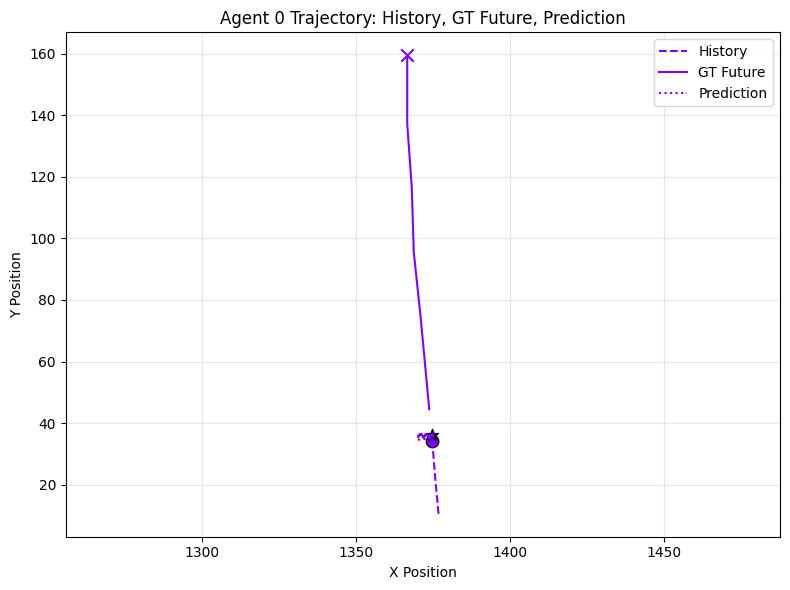

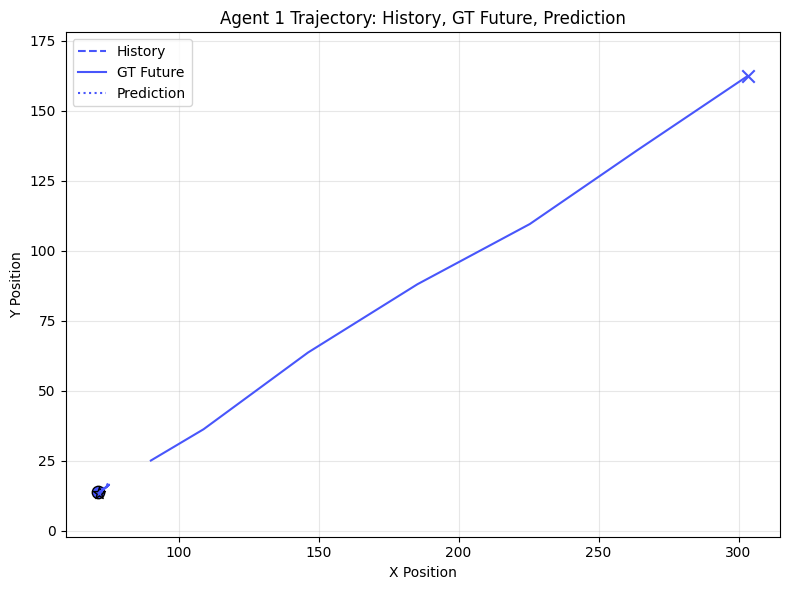

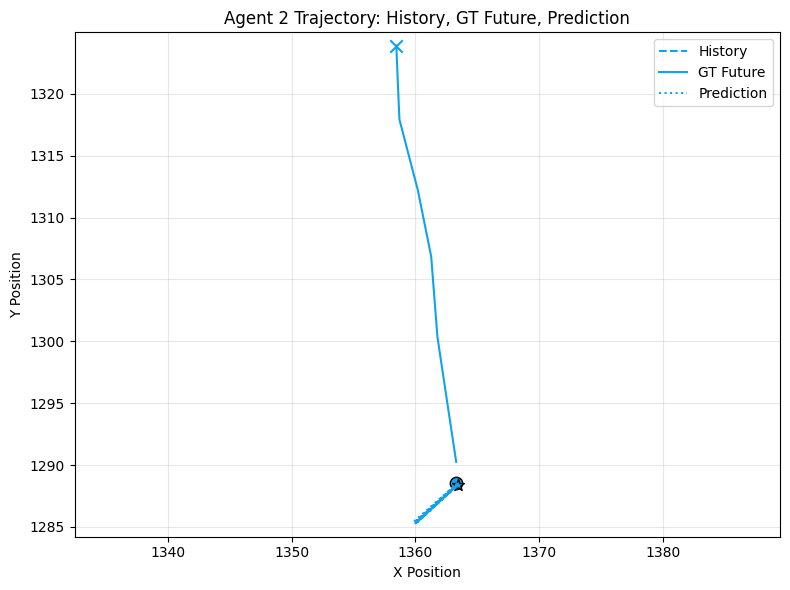

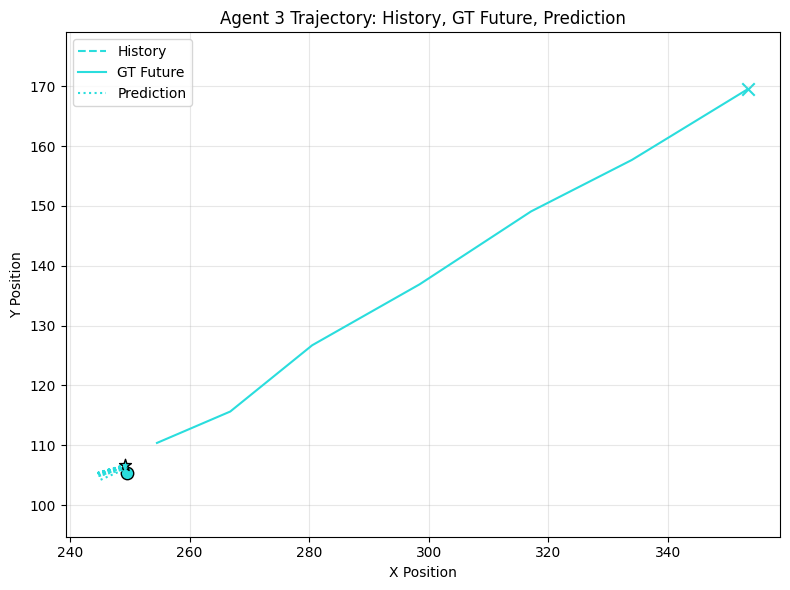

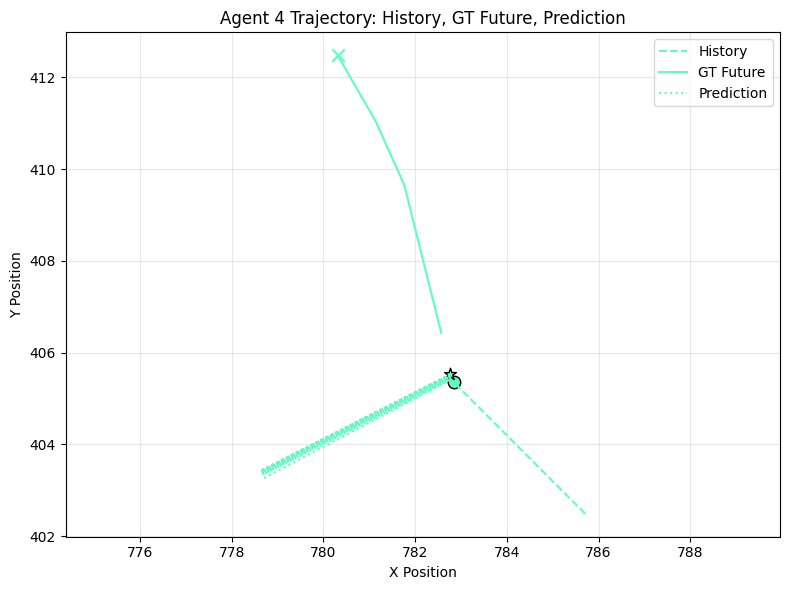

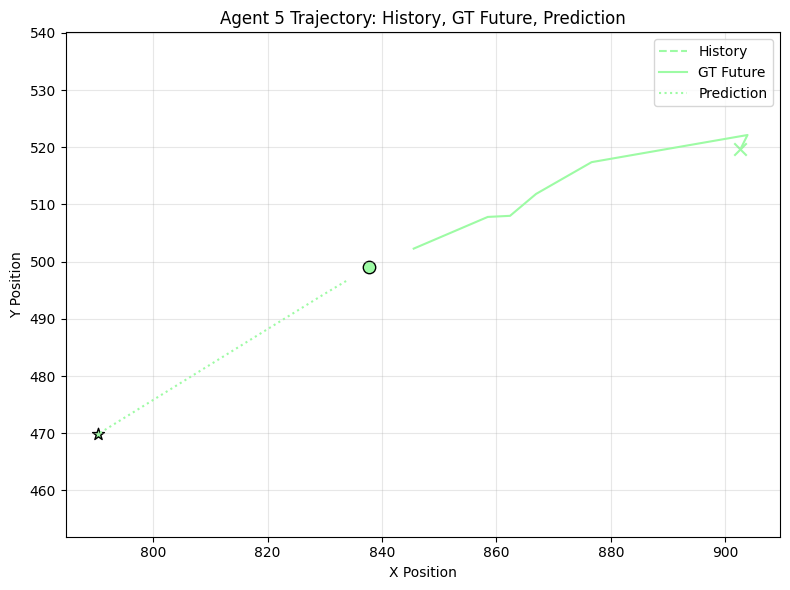

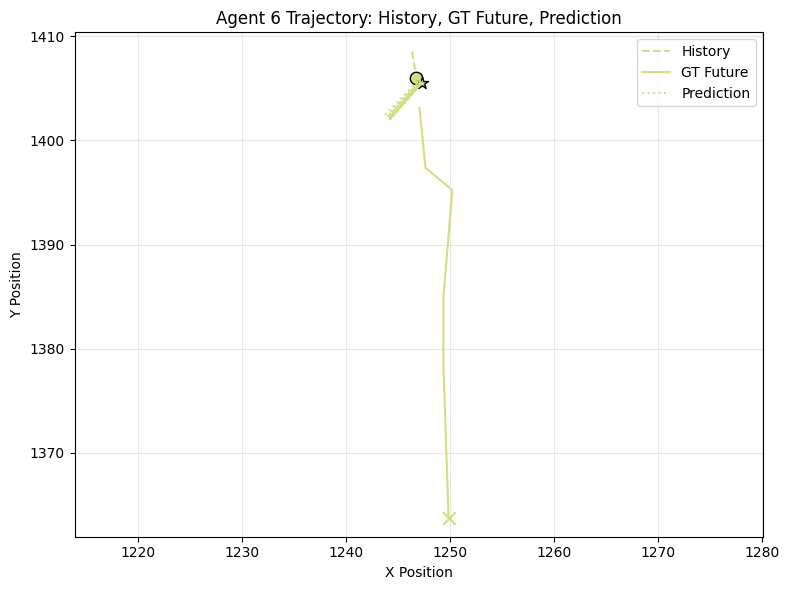

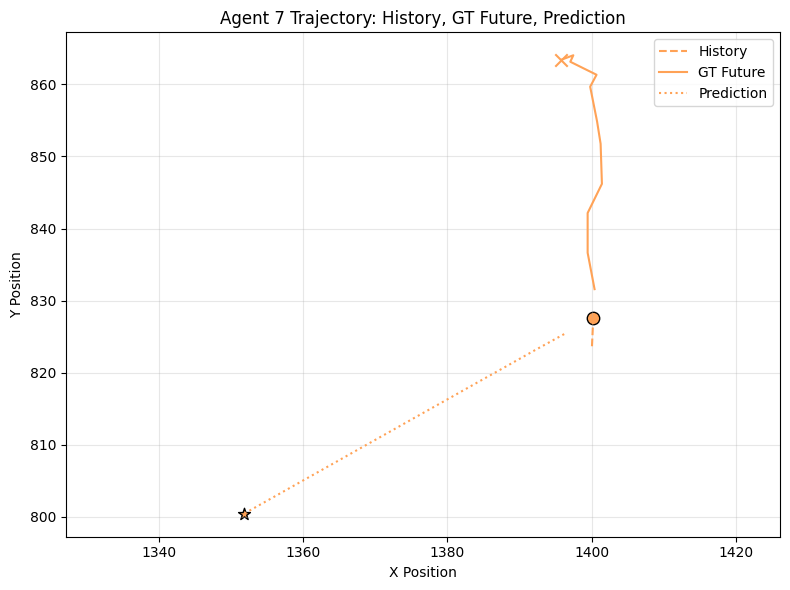

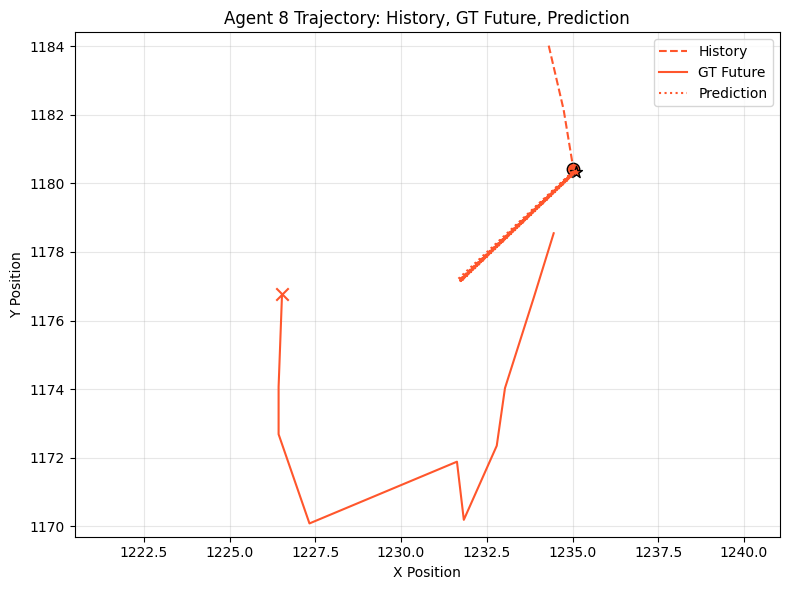

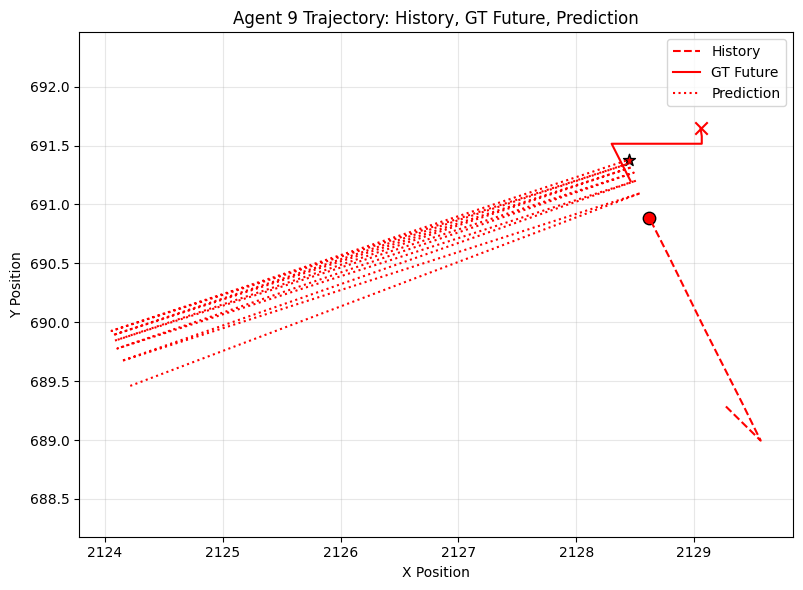

In [ ]:

# Load the JSON trajectory data
json_path = '/content/selected_agents_trajectories.json'
with open(json_path, 'r') as f:
    agent_data = json.load(f)

num_agents = len(agent_data)
colors = cm.rainbow(np.linspace(0, 1, num_agents))

# Iterate and plot one agent at a time
for i, agent_key in enumerate(sorted(agent_data.keys())):
    hist = np.array(agent_data[agent_key]['history'], dtype=np.float32)
    fut = np.array(agent_data[agent_key]['future'], dtype=np.float32)
    pred = np.array(agent_data[agent_key]['prediction'], dtype=np.float32)

    # Filter out all (0,0) points
    hist_valid = hist[~np.all(hist == 0.0, axis=1)]
    fut_valid = fut[~np.all(fut == 0.0, axis=1)]
    pred_valid = pred[~np.all(pred == 0.0, axis=1)]

    plt.figure(figsize=(8, 6))
    # History (dashed)
    if hist_valid.shape[0] > 0:
        plt.plot(hist_valid[:, 0], hist_valid[:, 1], '--', color=colors[i], label='History')
        plt.scatter(hist_valid[-1, 0], hist_valid[-1, 1], color=colors[i], marker='o', edgecolors='black', s=80)
    # Ground Truth Future (solid)
    if fut_valid.shape[0] > 0:
        plt.plot(fut_valid[:, 0], fut_valid[:, 1], '-', color=colors[i], label='GT Future')
        plt.scatter(fut_valid[-1, 0], fut_valid[-1, 1], color=colors[i], marker='x', edgecolors='black', s=80)
    # Prediction (dotted)
    if pred_valid.shape[0] > 0:
        plt.plot(pred_valid[:, 0], pred_valid[:, 1], ':', color=colors[i], label='Prediction')
        plt.scatter(pred_valid[-1, 0], pred_valid[-1, 1], color=colors[i], marker='*', edgecolors='black', s=80)

    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.title(f"Agent {i} Trajectory: History, GT Future, Prediction")
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

##

## MTA_only_Own train

In [ ]:


def train_mta_only_model(
    data_path,
    model_save_path,
    model_class,
    dataset_class,
    collate_fn,
    batch_size=32,
    epochs=1,
    learning_rate=0.001,
    weight_decay=0.0,
    device=None
):
    """
    Train a DeepLSTM trajectory prediction model with speed constraints (no PFM coeffs).

    Args:
        data_path (str): Path to dataset file.
        model_save_path (str): Where to save the trained model.
        model_class (class): Model class to instantiate (e.g., DeepLSTMModel).
        dataset_class (class): Dataset loader class (e.g., PFM_TrajectoryDataset).
        collate_fn (function): Collate function for DataLoader.
        batch_size (int): Batch size for DataLoader.
        epochs (int): Number of training epochs.
        learning_rate (float): Learning rate for optimizer.
        weight_decay (float): Weight decay for optimizer.
        device (torch.device): Device to train on. If None, auto-select CUDA if available.
    """
    device = device or torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    torch.autograd.set_detect_anomaly(True)

    # === DATA LOADING ===
    dataset = dataset_class(data_path)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

    # === MODEL / OPTIMIZER / LOSS ===
    model = model_class().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    print(f"\n🎯 Speed Constraints Enabled:")
    print(f"   Target Avg Speed: {model.target_avg_speed:.4f}")
    print(f"   Allowed range: [{model.min_speed:.4f}, {model.max_speed:.4f}]")
    print(f"   Tolerance: ±{model.speed_tolerance * 100:.1f}%\n")

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0.0
        epoch_gt_speeds, epoch_pred_speeds, epoch_hist_speeds, epoch_violations = [], [], [], []

        for batch_idx, (history, future, neighbors, goal) in enumerate(dataloader):
            history = history.to(device)
            future = future.to(device)
            # neighbors and goal are not used by DeepLSTMModel but are passed by the dataloader
            # neighbors = neighbors.to(device)
            # goal = future[:, :, -1, :].clone().to(device)

            optimizer.zero_grad()
            pred, _, _ = model(history) # DeepLSTMModel returns None for coeffs
            loss = criterion(pred, future)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            epoch_loss += loss.item()

            # === SPEED TRACKING ===
            with torch.no_grad():
                gt_speed = calculate_speed(future)
                pred_speed = calculate_speed(pred)
                hist_speed = calculate_speed(history)

                epoch_gt_speeds.append(gt_speed.item())
                epoch_pred_speeds.append(pred_speed.item())
                epoch_hist_speeds.append(hist_speed.item())

                violation_count = check_speed_violations(pred, history, model.min_speed, model.max_speed)
                epoch_violations.append(violation_count)

            if batch_idx % 50 == 0:
                print(f"[{batch_idx}] Loss: {loss:.4f}")
                print(f"    Speeds - GT: {gt_speed:.3f}, Pred: {pred_speed:.3f}, Hist: {hist_speed:.3f}")
                print(f"    Speed Violations: {violation_count}")


        # === EPOCH SUMMARY ===
        avg_gt_speed = sum(epoch_gt_speeds) / len(epoch_gt_speeds)
        avg_pred_speed = sum(epoch_pred_speeds) / len(epoch_pred_speeds)
        avg_hist_speed = sum(epoch_hist_speeds) / len(epoch_hist_speeds)
        total_violations = sum(epoch_violations)


        print(f"\n=== EPOCH {epoch+1} SUMMARY ===")
        print(f"Avg Loss: {epoch_loss/len(dataloader):.4f}")
        print(f"Avg Speeds: Hist={avg_hist_speed:.4f}, GT={avg_gt_speed:.4f}, Pred={avg_pred_speed:.4f}")
        print(f"Speed Error: {abs(avg_gt_speed - avg_pred_speed):.4f}")
        print(f"Violations: {total_violations} | Constraint Compliance: {(1 - total_violations/(len(dataloader)*batch_size*5*12))*100:.2f}%")
        print("=" * 40)

        # === CLEAR CUDA CACHE AND COLLECT GARBAGE AFTER EACH EPOCH ===
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()

    torch.autograd.set_detect_anomaly(False)

    # === SAVE MODEL ===
    print("\n💾 Saving model...")
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epochs,
        'loss': epoch_loss/len(dataloader),
        'speed_constraints': {
            'target_avg_speed': model.target_avg_speed,
            'min_speed': model.min_speed,
            'max_speed': model.max_speed,
            'tolerance': model.speed_tolerance
        },
        'final_avg_speeds': {
            'historical': avg_hist_speed,
            'ground_truth': avg_gt_speed,
            'predicted': avg_pred_speed
        }
    }, model_save_path)
    print(f"✅ Model saved at {model_save_path} with speed constraints!")


data_path = '/content/combined_annotations.csv'
model_save_path = '/content/mta_trajectory_model_own.pth'
model_class = DeepLSTMModel
dataset_class = PFM_TrajectoryDataset
collate_fn = collate_fn
train_mta_only_model(
    data_path,
    model_save_path,
    model_class,
    dataset_class,
    collate_fn,
    batch_size=32,
    epochs=1,
    learning_rate=0.001,
    weight_decay=0.0,
    device=None
)

train_mta_only_model(data_path, model_save_path, model_class, dataset_class, collate_fn, 32, 1, 0.001, 0.0)


🎯 Speed Constraints Enabled:
   Target Avg Speed: 4.0870
   Allowed range: [3.4739, 4.7000]
   Tolerance: ±15.0%

[0] Loss: 798.3756
    Speeds - GT: 2.429, Pred: 4.465, Hist: 2.386
    Speed Violations: 157259


KeyboardInterrupt: 

In [ ]:
# Select GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_mta = DeepLSTMModel(
    input_size=2,
    hidden_size=64,
    num_layers=2,
    target_avg_speed=4.087,
    speed_tolerance=0.15
).to(device)

## testing mta only own and mta_pfm

In [ ]:

def compute_ADE(pred, gt):
    return F.mse_loss(pred, gt, reduction='none').sum(dim=2).sqrt().mean().item()

def compute_FDE(pred, gt):
    return F.mse_loss(pred[:, -1], gt[:, -1], reduction='none').sum(dim=1).sqrt().mean().item()

def compute_miss_rate(pred, gt, threshold=2.0):
    final_dist = F.mse_loss(pred[:, -1], gt[:, -1], reduction='none').sum(dim=1).sqrt()
    misses = (final_dist > threshold).float()
    return (misses.sum() / len(misses)).item()

In [ ]:
def test_with_metrics_pfm(model_path, cleaned_txt_file):   #load different models accordingly
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    dataset = PFM_TrajectoryDataset(cleaned_txt_file)
    print(f"\n📦 Loaded {len(dataset)} frame samples for evaluation.")

    if len(dataset) == 0:
        print("❌ No valid samples available. Check your preprocessing.")
        return

    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

    model = DeepLSTMModel().to(device)
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    total_ade, total_fde, total_miss = 0.0, 0.0, 0.0
    count = 0

    with torch.no_grad():
        for history, future, neighbors, goal in dataloader:
            history = history.to(device)
            future = future.to(device)
            neighbors = neighbors.to(device)
            goal = goal.to(device)

            pred, _, _ = model(history, neighbors, goal)  # [1, A, 12, 2]
            pred = pred[0]    # [A, 12, 2]
            future = future[0]  # [A, T, 2]

            # Fix length mismatch
            min_len = min(pred.size(1), future.size(1))
            if pred.size(1) != future.size(1):
                print(f"⚠️ Truncating: pred_len={pred.size(1)}, future_len={future.size(1)} → using {min_len}")
            pred = pred[:, :min_len, :]
            future = future[:, :min_len, :]

            ade = torch.norm(pred - future, dim=-1).mean().item()
            fde = torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1).mean().item()
            miss = (torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1) > 2.0).float().mean().item()

            total_ade += ade
            total_fde += fde
            total_miss += miss
            count += 1

    if count == 0:
        print("❌ Evaluation aborted: No samples processed.")
        return

    print(f"\n📊 Evaluation Metrics on Test Dataset:")
    print(f"🔹 Average ADE:  {total_ade / count:.4f}")
    print(f"🔹 Average FDE:  {total_fde / count:.4f}")
    print(f"🔹 Miss Rate:    {total_miss / count:.4f} (threshold: 2m)")

In [ ]:
test_with_metrics_pfm(
        '/content/deep_lstm_model.pth',
        '/content/combined_annotations.csv'
    )


📦 Loaded 681 frame samples for evaluation.


/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:929: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
def test_with_metrics_mta_pfm(model_path, cleaned_txt_file):   #load different models accordingly
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    dataset = PFM_TrajectoryDataset(cleaned_txt_file)
    print(f"\n📦 Loaded {len(dataset)} frame samples for evaluation.")

    if len(dataset) == 0:
        print("❌ No valid samples available. Check your preprocessing.")
        return

    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

    model = CheckpointedIntegratedMTAPFMModel().to(device)
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    total_ade, total_fde, total_miss = 0.0, 0.0, 0.0
    count = 0

    with torch.no_grad():
        for history, future, neighbors, goal in dataloader:
            history = history.to(device)
            future = future.to(device)
            neighbors = neighbors.to(device)
            goal = goal.to(device)

            pred, _, _ = model(history, neighbors, goal)  # [1, A, 12, 2]
            pred = pred[0]    # [A, 12, 2]
            future = future[0]  # [A, T, 2]

            # Fix length mismatch
            min_len = min(pred.size(1), future.size(1))
            if pred.size(1) != future.size(1):
                print(f"⚠️ Truncating: pred_len={pred.size(1)}, future_len={future.size(1)} → using {min_len}")
            pred = pred[:, :min_len, :]
            future = future[:, :min_len, :]

            ade = torch.norm(pred - future, dim=-1).mean().item()
            fde = torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1).mean().item()
            miss = (torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1) > 2.0).float().mean().item()

            total_ade += ade
            total_fde += fde
            total_miss += miss
            count += 1

    if count == 0:
        print("❌ Evaluation aborted: No samples processed.")
        return

    print(f"\n📊 Evaluation Metrics on Test Dataset:")
    print(f"🔹 Average ADE:  {total_ade / count:.4f}")
    print(f"🔹 Average FDE:  {total_fde / count:.4f}")
    print(f"🔹 Miss Rate:    {total_miss / count:.4f} (threshold: 2m)")

In [ ]:
test_with_metrics_mta_pfm(
        '/content/integrated_pfm_model.pth',
        '/content/combined_annotations.csv'
    )


📦 Loaded 681 frame samples for evaluation.


KeyboardInterrupt: 

/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:745: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/tmp/ipython-input-277603255.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', num_agents)


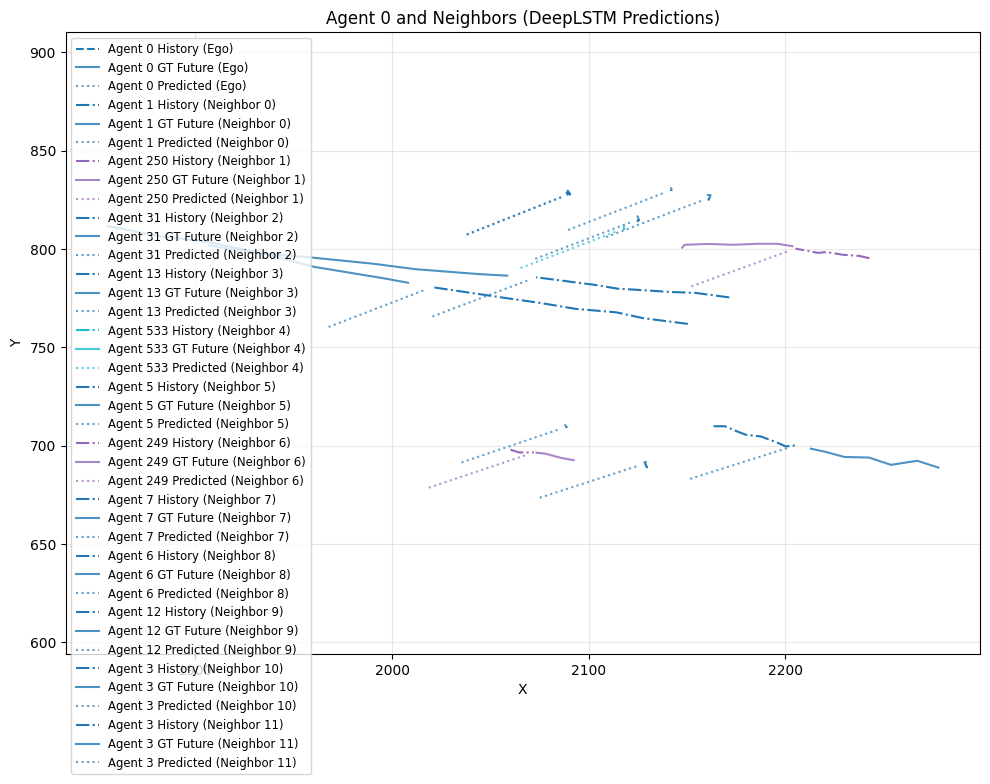

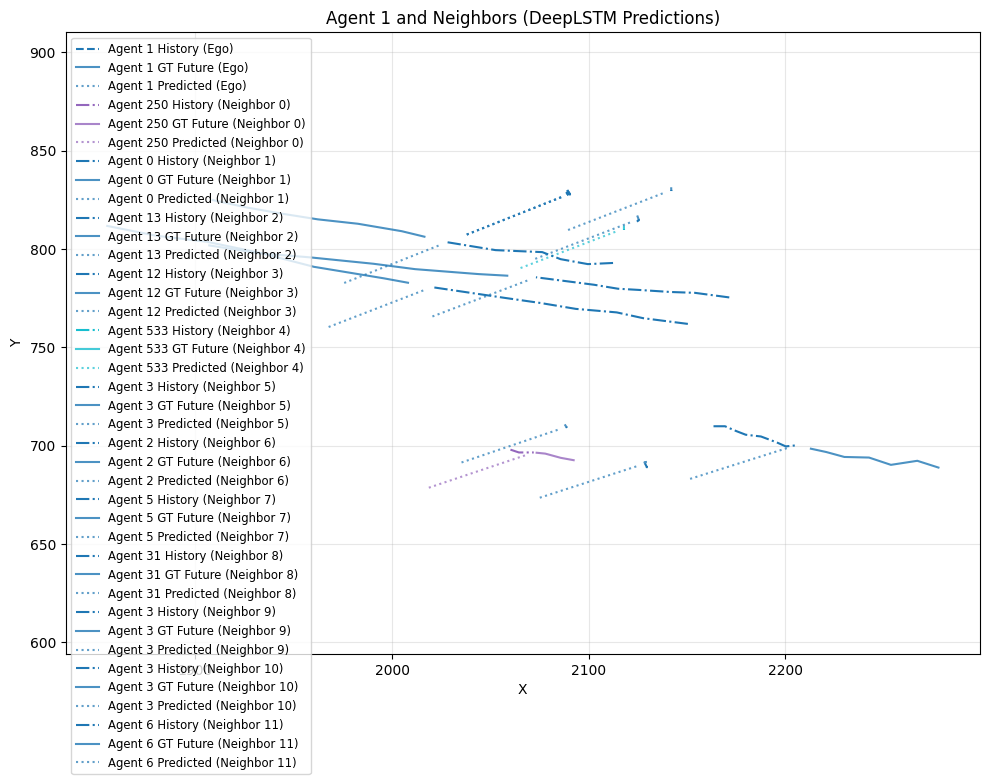

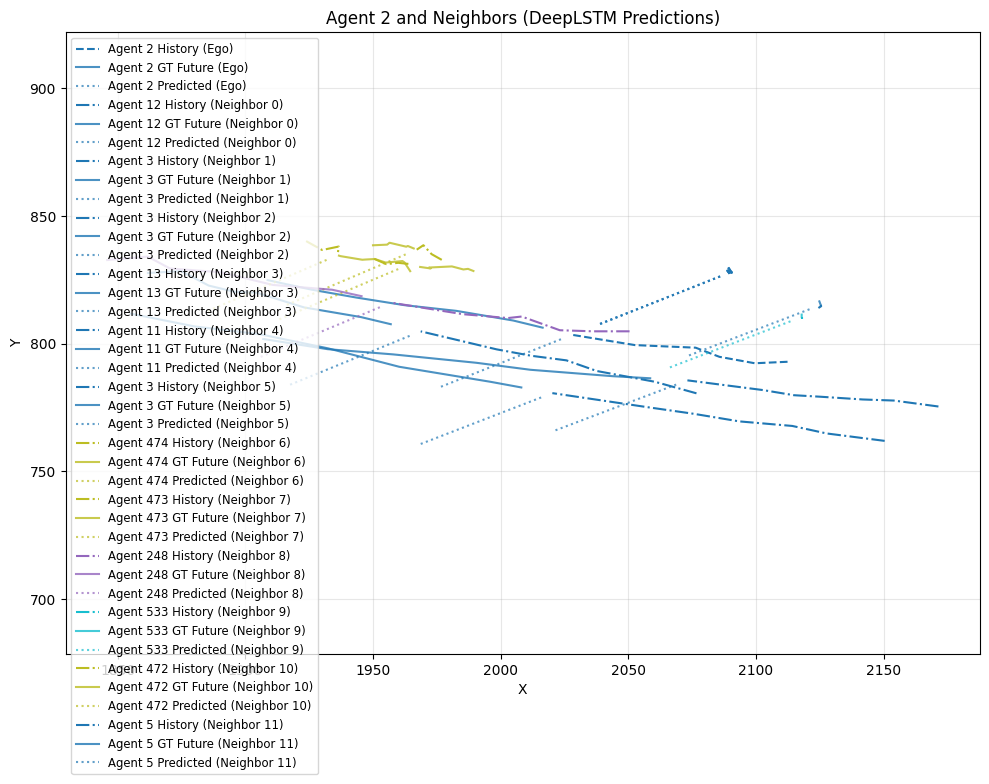

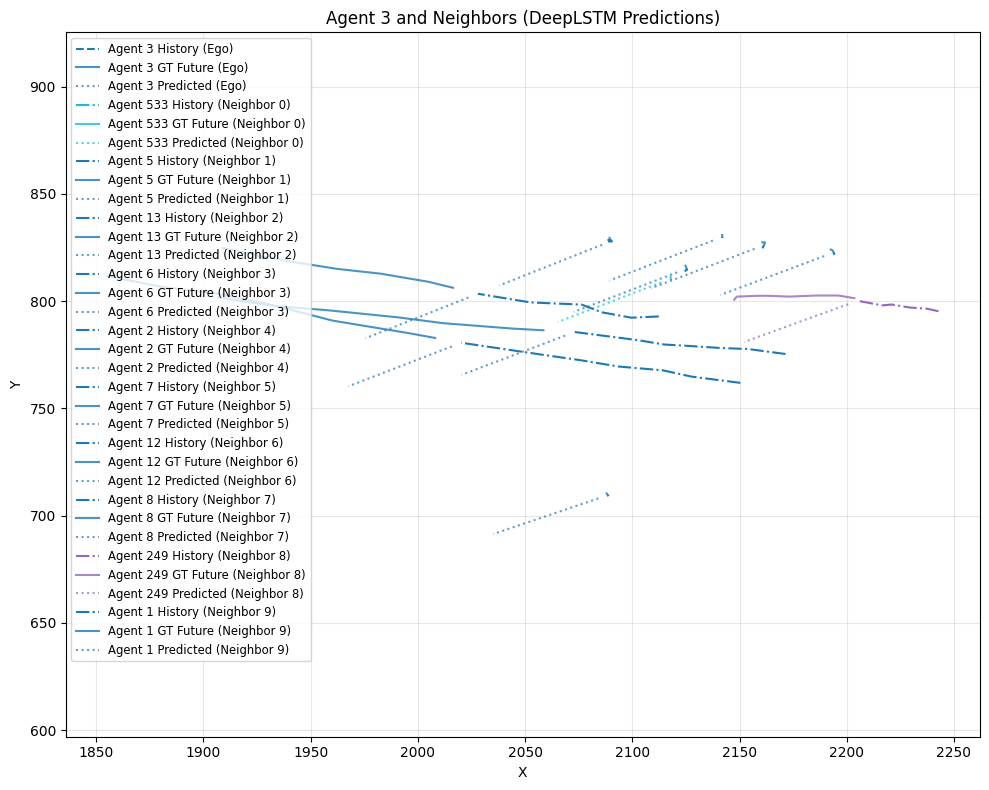

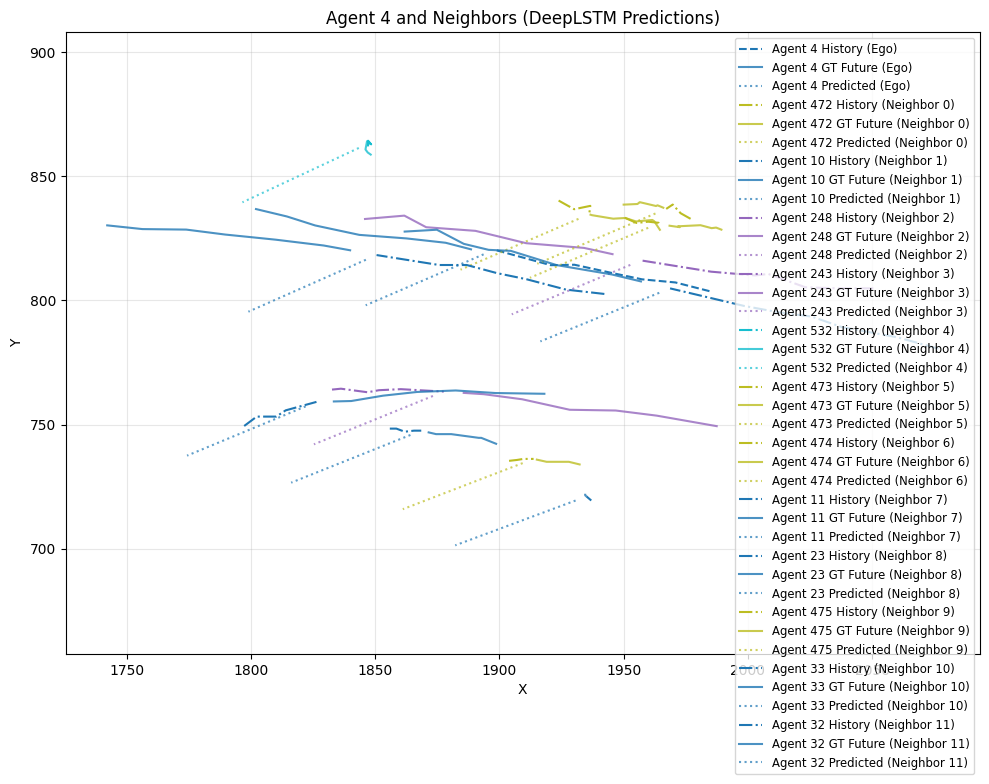

...

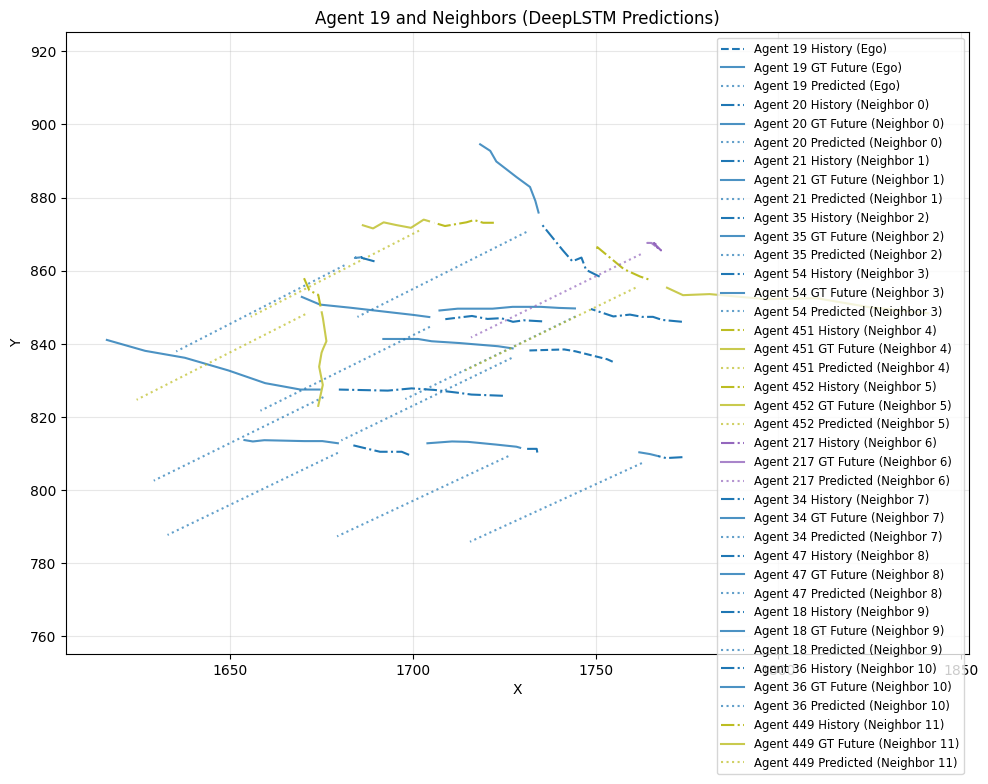

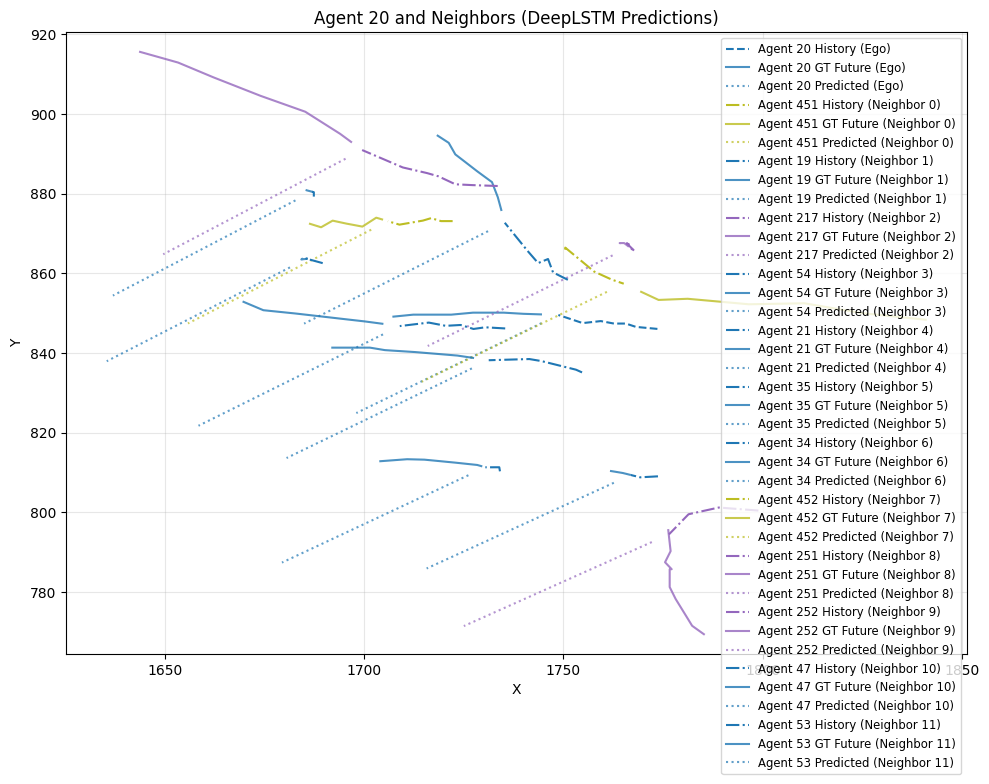

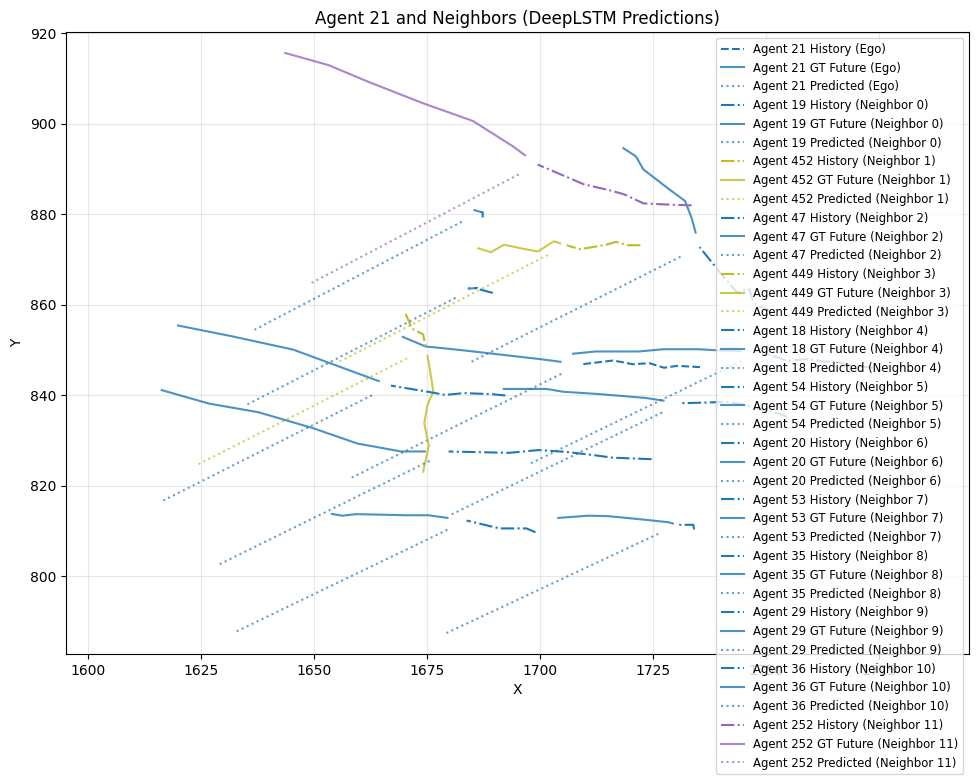

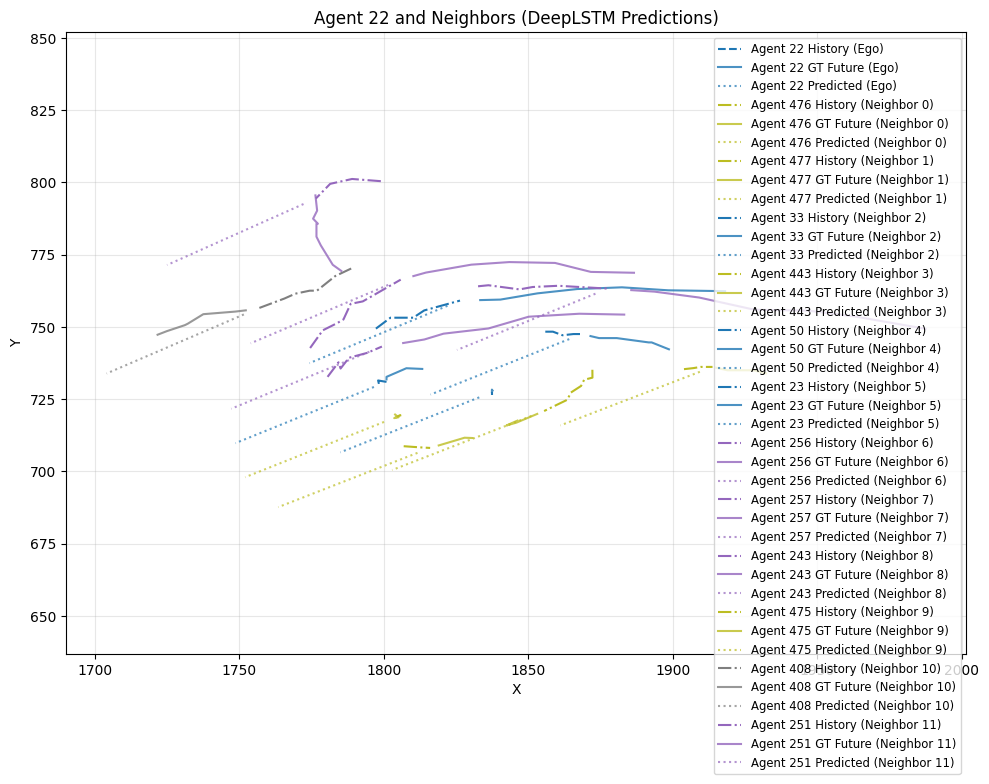

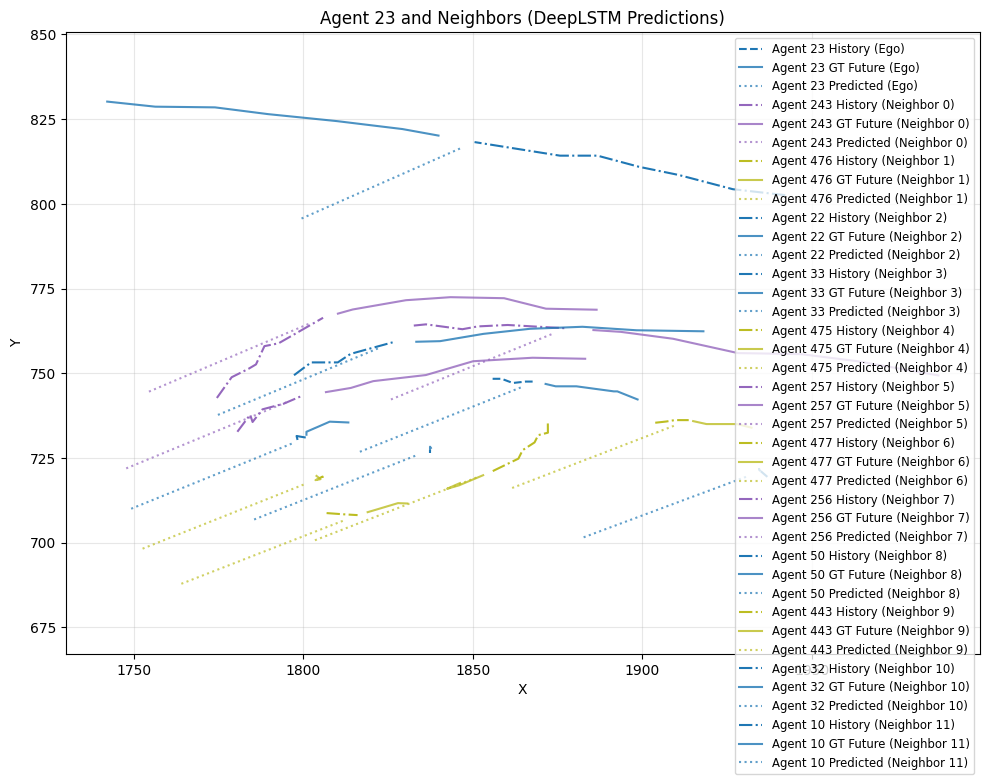

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipython-input-277603255.py", line 212, in <cell line: 0>
    plot_agents_individually_with_neighbors(dataset, device, sample_idx=0, prev=12, next=24, model=model_mta)
  File "/tmp/ipython-input-277603255.py", line 80, in plot_agents_individually_with_neighbors
    plt.show()
  File "/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py", line 614, in show
    return _get_backend_mod().show(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/matplotlib_inline/backend_inline.py", line 90, in show
    display(
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/display.py", line 320, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
                           ^^^^^^^^^^^^

TypeError: object of type 'NoneType' has no len()

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt


def plot_agents_individually_with_neighbors(dataset, device, sample_idx=0,
                                            prev=12, next=24,
                                            max_neighbors=12,
                                            model=None):  # pass your DeepLSTMModel instance here

    history, future, neighbors, goals = dataset[sample_idx]

    if history.shape[0] == 0:
        print(f"No agents in sample {sample_idx}")
        return

    history_np = history.numpy()
    future_np = future.numpy()

    with torch.no_grad():
        history_in = history.unsqueeze(0).to(device)     # [1, num_agents, hist_len, 2]
        neighbors_in = neighbors.unsqueeze(0).to(device)
        goals_in = goals.unsqueeze(0).to(device)
        pred_out, _, _ = model(history_in, neighbors_in, goals_in)  # Shape [1, num_agents, 12, 2]
        pred_np = pred_out.squeeze(0).cpu().numpy()

    num_agents = history_np.shape[0]
    colors = plt.cm.get_cmap('tab10', num_agents)

    for ego_agent_idx in range(num_agents):
        plt.figure(figsize=(10, 8))

        def plot_traj(agent_idx, label_suffix, linestyle, color):
            traj_hist = history_np[agent_idx]
            traj_fut = future_np[agent_idx]
            traj_pred = pred_np[agent_idx]

            # Masks to ignore zero-padding (0,0)
            mask_hist = ~np.all(traj_hist == 0, axis=1)
            mask_fut = ~np.all(traj_fut == 0, axis=1)
            mask_pred = ~np.all(traj_pred == 0, axis=1)

            plt.plot(traj_hist[mask_hist, 0], traj_hist[mask_hist, 1], linestyle,
                     color=color, label=f'Agent {agent_idx} History {label_suffix}')
            plt.plot(traj_fut[mask_fut, 0], traj_fut[mask_fut, 1], '-',
                     color=color, alpha=0.8, label=f'Agent {agent_idx} GT Future {label_suffix}')
            plt.plot(traj_pred[mask_pred, 0], traj_pred[mask_pred, 1], ':',
                     color=color, alpha=0.7, label=f'Agent {agent_idx} Predicted {label_suffix}')

        # Plot ego agent
        plot_traj(ego_agent_idx, '(Ego)', '--', colors(ego_agent_idx))

        # Plot neighbors (up to max_neighbors)
        neighbor_positions = neighbors[ego_agent_idx]
        neighbor_count = 0

        for n_idx in range(neighbor_positions.shape[0]):
            if neighbor_count >= max_neighbors:
                break
            neigh_pos = neighbor_positions[n_idx]
            if np.all(neigh_pos.numpy() == 0):
                continue

            dists = np.linalg.norm(history_np[:, -1, :] - neigh_pos.numpy(), axis=1)
            closest_neighbor_idx = np.argmin(dists)

            if closest_neighbor_idx == ego_agent_idx:
                continue  # skip ego itself

            plot_traj(closest_neighbor_idx, f'(Neighbor {neighbor_count})', '-.', colors(closest_neighbor_idx))
            neighbor_count += 1

        plt.title(f"Agent {ego_agent_idx} and Neighbors (DeepLSTM Predictions)")
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend(fontsize='small', loc='best')
        plt.axis('equal')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()





# =============================
# Example Dataset Loader (Your PFM_TrajectoryDataset class here)
# =============================
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

# =============================
# Usage Example
# =============================
# instantiate your model:
model_mta = DeepLSTMModel().to(device)

# load your dataset
dataset = PFM_TrajectoryDataset('/content/combined_annotations.csv', history_len=8, prediction_len=12)

# then call plotting
plot_agents_individually_with_neighbors(dataset, device, sample_idx=0, prev=12, next=24, model=model_mta)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt


def plot_agents_individually_with_neighbors(dataset, device, sample_idx=0,
                                            prev=12, next=24,
                                            max_neighbors=12,
                                            model=None):  # pass your DeepLSTMModel instance here

    history, future, neighbors, goals = dataset[sample_idx]

    if history.shape[0] == 0:
        print(f"No agents in sample {sample_idx}")
        return

    history_np = history.numpy()
    future_np = future.numpy()

    with torch.no_grad():
        history_in = history.unsqueeze(0).to(device)     # [1, num_agents, hist_len, 2]
        neighbors_in = neighbors.unsqueeze(0).to(device)
        goals_in = goals.unsqueeze(0).to(device)
        pred_out, _, _ = model(history_in, neighbors_in, goals_in)  # Shape [1, num_agents, 12, 2]
        pred_np = pred_out.squeeze(0).cpu().numpy()

    num_agents = history_np.shape[0]
    colors = plt.cm.get_cmap('tab10', num_agents)

    for ego_agent_idx in range(num_agents):
        plt.figure(figsize=(10, 8))

        def plot_traj(agent_idx, label_suffix, linestyle, color):
            traj_hist = history_np[agent_idx]
            traj_fut = future_np[agent_idx]
            traj_pred = pred_np[agent_idx]

            # Masks to ignore zero-padding (0,0)
            mask_hist = ~np.all(traj_hist == 0, axis=1)
            mask_fut = ~np.all(traj_fut == 0, axis=1)
            mask_pred = ~np.all(traj_pred == 0, axis=1)

            plt.plot(traj_hist[mask_hist, 0], traj_hist[mask_hist, 1], linestyle,
                     color=color, label=f'Agent {agent_idx} History {label_suffix}')
            plt.plot(traj_fut[mask_fut, 0], traj_fut[mask_fut, 1], '-',
                     color=color, alpha=0.8, label=f'Agent {agent_idx} GT Future {label_suffix}')
            plt.plot(traj_pred[mask_pred, 0], traj_pred[mask_pred, 1], ':',
                     color=color, alpha=0.7, label=f'Agent {agent_idx} Predicted {label_suffix}')

        # Plot ego agent
        plot_traj(ego_agent_idx, '(Ego)', '--', colors(ego_agent_idx))

        # Plot neighbors (up to max_neighbors)
        neighbor_positions = neighbors[ego_agent_idx]
        neighbor_count = 0

        for n_idx in range(neighbor_positions.shape[0]):
            if neighbor_count >= max_neighbors:
                break
            neigh_pos = neighbor_positions[n_idx]
            if np.all(neigh_pos.numpy() == 0):
                continue

            dists = np.linalg.norm(history_np[:, -1, :] - neigh_pos.numpy(), axis=1)
            closest_neighbor_idx = np.argmin(dists)

            if closest_neighbor_idx == ego_agent_idx:
                continue  # skip ego itself

            plot_traj(closest_neighbor_idx, f'(Neighbor {neighbor_count})', '-.', colors(closest_neighbor_idx))
            neighbor_count += 1

        plt.title(f"Agent {ego_agent_idx} and Neighbors (DeepLSTM Predictions)")
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend(fontsize='small', loc='best')
        plt.axis('equal')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()





# =============================
# Example Dataset Loader (Your PFM_TrajectoryDataset class here)
# =============================
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

# =============================
# Usage Example
# =============================
# instantiate your model:
model_mta = DeepLSTMModel().to(device)

# load your dataset
dataset = PFM_TrajectoryDataset('/content/combined_annotations.csv', history_len=8, prediction_len=12)

# then call plotting
plot_agents_individually_with_neighbors(dataset, device, sample_idx=0, prev=12, next=24, model=model_mta)